In [1]:
import numpy as np
import codecs
import os
import copy
import json
from scipy.spatial.distance import cdist, pdist, squareform
from scipy.linalg import eigh
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import random
from sklearn import manifold
import phate
import pandas as pd 
import scprep
from torch.nn import functional as F


import pandas as pd
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns

import torch
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SubsetRandomSampler,RandomSampler
from torchvision import datasets, transforms
from torch.nn.functional import softmax
from torch import optim, nn
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


# Section 2

## Section 2.1 & 2.2 - Loading data and Logistic Regression

In [2]:
# Loading the dataset and create dataloaders
mnist_train = datasets.MNIST(root = 'data', train=True, download=True, transform = transforms.ToTensor())
mnist_test = datasets.MNIST(root = 'data', train=False, download=True, transform = transforms.ToTensor())


In [3]:
# Prepare the dataset
class MyDataset(Dataset):
    def __init__(self, data, target):
        
        self.data = torch.from_numpy(data).float()
        self.target = torch.from_numpy(target).float()
        
    def __getitem__(self, index):
        x = self.data[index]
        y = self.target[index]
        return x, y
    
    def __len__(self):
        return len(self.data)

In [4]:
def DataPreProcessing(verbose=False):
    dataset = pd.read_csv("../RF/US_TN_season_1_proc.csv")	
    
    #Check for NaN in this table and drop them if there are
    dataset.isna().sum()
    dataset.dropna()

    #Split the dataset into a training set and a test set.
#     dataset_orig = dataset #keep a backup of the original dataset. Might be useful.

    # Remove extra variables from the dataset (keep just the 47 predictors and the 'bcmean' (what we are predicting)
    dataset = dataset.drop(["RVunif_bc","mean","std","cv","longitude","latitude","RVunif"],axis=1)
    if verbose:
        print('Example of the dataset: \n',dataset.head())

    dataset_orig = dataset.copy()
#     dataset.to_csv('dataset_clean.csv',index=False) #Saving the csv file just for easier visualization of the raw data

    # Rescale: differences in scales accross input variables may increase the difficulty of the problem being modeled and results on unstable weights for connections
    sc = MinMaxScaler(feature_range = (0,1)) #Scaling features to a range between 0 and 1

    # Scaling and translating each feature to our chosen range
    dataset = sc.fit_transform(dataset) 
    dataset = pd.DataFrame(dataset, columns = dataset_orig.columns)
    if verbose:
        print('dataset (after transform): \n',dataset.head())
    dataset_scaled = dataset.copy() #Just backup
    inverse_data = sc.inverse_transform(dataset) #just to make sure it works
    inverse_data = pd.DataFrame(inverse_data, columns = dataset_orig.columns)
    if verbose: 
        print('inverse_data: \n',inverse_data.head())

#     train_dataset = dataset.sample(frac=0.8,random_state=0)
#     test_dataset = dataset.drop(train_dataset.index)
#     train_dataset_orig = dataset_orig2.sample(frac=0.8,random_state=0) #just backup
#     test_dataset_orig =  dataset_orig2.drop(train_dataset_orig.index) #just backup
    

    #Check the overall stats
    train_stats = dataset.describe()
    train_stats.pop('bcmean') #because that is what we are trying to predict
    train_stats = train_stats.transpose()
    if verbose: print('train_stats: ',train_stats) #now train_stats has 47 predictors (as described in the paper).

#     # Remove the output from our list of predictors
#     train_dataset.to_csv('train_dataset.csv',index=False) 
#     train_labels = train_dataset.pop('bcmean')
#     test_dataset.to_csv('test_dataset.csv',index=False)
#     test_labels = test_dataset.pop('bcmean')
    
    labels = dataset.pop('bcmean')
    if verbose: print('labels.describe: ',labels.describe())
    dataset = MyDataset(dataset.to_numpy(), labels.to_numpy())
    dataset_size  = len(dataset)
    if verbose: print('dataset_size: {}'.format(dataset_size))
    validation_split=0.3

    batch_size=25 #How many frames are actually going to be selected

    # -- split dataset
    indices       = list(range(dataset_size))
    split         = int(np.floor(validation_split*dataset_size))
    if verbose: print('samples in validation: {}'.format(split))
    np.random.shuffle(indices) # Randomizing the indices is not a good idea if you want to model the sequence
    train_indices, val_indices = indices[split:], indices[:split]

    # -- create dataloaders
    train_sampler = RandomSampler(train_indices)
    valid_sampler = RandomSampler(val_indices)

    dataloaders   = {
        'train': torch.utils.data.DataLoader(dataset, batch_size=batch_size, num_workers=6, sampler=train_sampler),
        'val': torch.utils.data.DataLoader(dataset, batch_size=batch_size, num_workers=6, sampler=valid_sampler),
        'test': torch.utils.data.DataLoader(dataset,  batch_size=dataset_size, num_workers=6, shuffle=False),
        'all_val': torch.utils.data.DataLoader(dataset, batch_size=split, num_workers=6, shuffle=True),
        }


    if verbose: 
        #Inspect the original mean (still missing some formatting)
        sns.set()
        f, (ax1,ax2) = plt.subplots(2, 1,sharex=True)
        sns.distplot(labels,hist=True,kde=False,bins=75,color='darkblue',  ax=ax1, axlabel=False)
        sns.kdeplot(labels,bw=0.15,legend=True,color='darkblue', ax=ax2)

        ax1.set_title('Original  histogram')
        ax1.legend(['bcmean'])
        ax2.set_title('KDE')
        ax2.set_xlabel('Mean Concentration N')
        ax1.set_ylabel('Count')
        ax2.set_ylabel('Dist')
        # plt.show()
        
    # Inspect the joint distribution of a few pairs of columns from the training set
    # We can observe that the process of scalling the data did not affect the skewness of the data
    sns.pairplot(dataset_scaled[["lc09", "lc07", "hydro05", "hydro07","soil01","dem"]], diag_kind="kde")
    plt.show()
        
    return dataloaders
    

    #Normalize the data because the data has very different ranges (not really crucial for the prediction to use the raw data)
    #def norm(x):
    # return (x - train_stats['mean']) / train_stats['std']
#     normed_train_data = train_dataset #norm(train_dataset)
#     normed_test_data = test_dataset #norm(test_dataset)



Example of the dataset: 
    lc01  lc02  lc03  lc04  lc05  lc06  lc07  lc08  lc09  lc10  ...   hydro14  \
0    66     0     1    33     0     0     0     0     0     0  ...      4418   
1    53     0     2    43     0     0     0     0     0     0  ...      3710   
2    28     0    15    45    23    22    12     0     0     0  ...  38819396   
3    59     0     2    33     0     0     6     0     0     0  ...      7735   
4    52     0     2    43     0     0     1     0     0     0  ...      3999   

   hydro15    hydro16    hydro17    hydro18    hydro19   dem  slope  order  \
0       68     182937      21313     182937      21313   498    407      2   
1       68     155202      18107     155202      18107   365    402      2   
2       29  310689856  136347296  310689856  136347296  1470    492      8   
3       67     302169      37266     302169      37266   342    467      2   
4       68     167904      19575     167904      19575   341    391      2   

     bcmean  
0 -1.43559

/home/antonio2/miniconda3/envs/2pmeso_BERT/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/antonio2/miniconda3/envs/2pmeso_BERT/lib/python3.7/site-packages/seaborn/distributions.py:1659: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.15 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


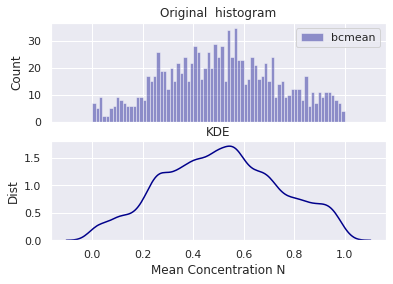

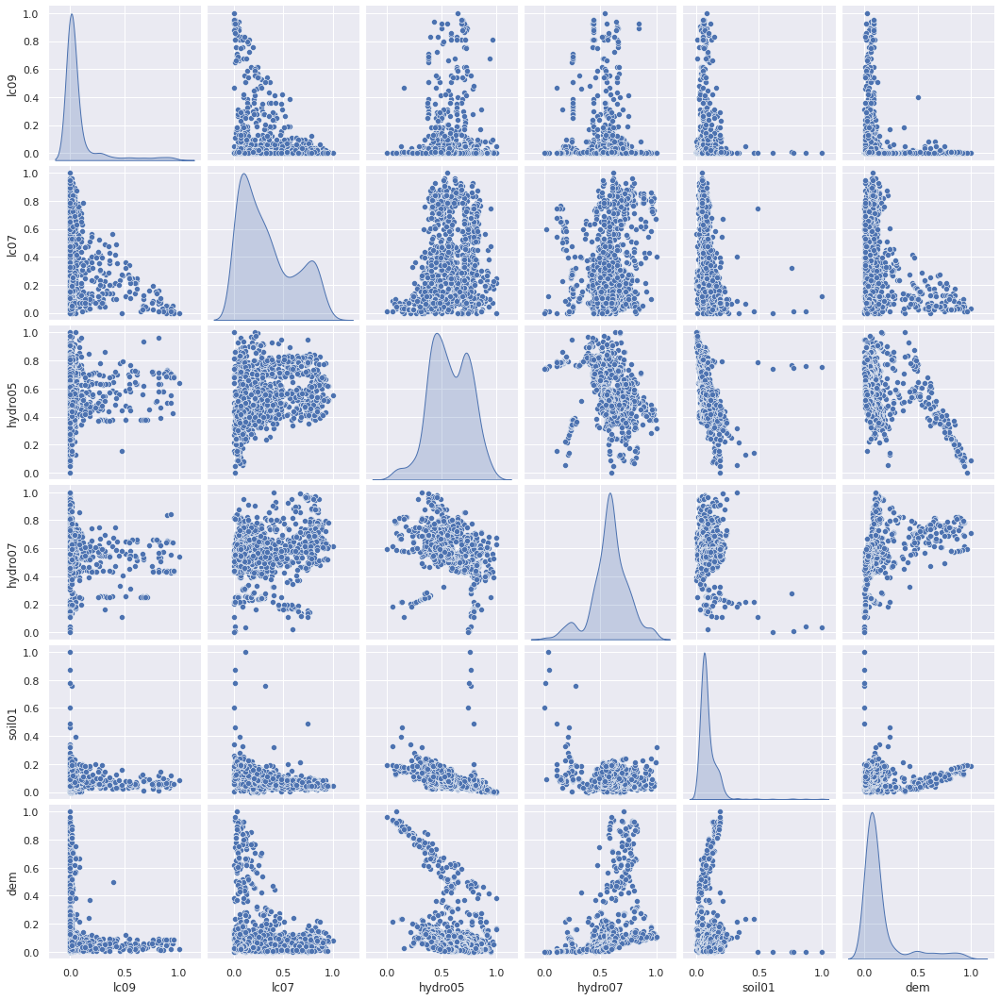

Dim of raw sample image: torch.Size([25, 47])

Dim of labels: torch.Size([25])

max 1.0, min 0.0
max_labels 0.8742004632949829, min 0.08325959742069244


In [5]:
dataloaders = DataPreProcessing(verbose=True)

#Check out how the dataloeader works
dataiter = iter(dataloaders['val'])
samples_tmp, labels_tmp = dataiter.next()

print('Dim of raw sample image: {}\n'.format(samples_tmp.shape))
print('Dim of labels: {}\n'.format(labels_tmp.shape))
print('max {}, min {}'.format(torch.max(samples_tmp),torch.min(samples_tmp)))
print('max_labels {}, min {}'.format(torch.max(labels_tmp),torch.min(labels_tmp)))

In [32]:
# Training and Evaluation routines
def train(model,loss_fn, optimizer, train_loader, test_loader, config_str, num_epochs=None, verbose=False):
    """
    This is a standard training loop, which leaves some parts to be filled in.
    INPUT:
    :param model: an untrained pytorch model
    :param loss_fn: e.g. Cross Entropy loss of Mean Squared Error.
    :param optimizer: the model optimizer, initialized with a learning rate.
    :param training_set: The training data, in a dataloader for easy iteration.
    :param test_loader: The testing data, in a dataloader for easy iteration.
    """
    
    path_to_save = './plots'
    if not os.path.exists(path_to_save):
        os.makedirs(path_to_save)
    
    print('optimizer: {}'.format(optimizer))
    if num_epochs is None:
        num_epochs = 100 # obviously, this is too many. I don't know what this author was thinking.
    print('n. of epochs: {}'.format(num_epochs))
    train_loss=[]
    val_loss=[]
    r2train=[]
    r2val=[]
    for epoch in range(num_epochs+1):
        # loop through each data point in the training set
        all_loss_train=0
        for data, targets in train_loader:
            start = time.time()
            # run the model on the data
            model_input = data.view(data.size(0),-1).to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
#             if verbose: 
#                 print('model_input.shape: {}'.format(model_input.shape))
#                 print('model_input: {}'.format(model_input))
                
            # Clear gradients w.r.t. parameters
            optimizer.zero_grad()
            
            out = model(model_input).squeeze()
#             if verbose:
#                 print('targets: {}'.format(targets.shape))
#                 print('out: {}'.format(out.shape))

            # Calculate the loss
            targets = targets.to(device) # add an extra dimension to keep CrossEntropy happy.
#             if verbose: print('targets.shape: {}'.format(targets.shape))
            loss = loss_fn(out,targets)
#             if verbose: print('loss: {}'.format(loss))
            
            # Find the gradients of our loss via backpropogation
            loss.backward()

            # Adjust accordingly with the optimizer
            optimizer.step()
            all_loss_train += loss.item()
        train_loss.append(all_loss_train/len(train_loader))
            
        with torch.no_grad():
            all_loss_val=0
            for data, targets in test_loader:

                # run the model on the data
                model_input = data.view(data.size(0),-1).to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
                out = model(model_input).squeeze()
                targets = targets.to(device) # add an extra dimension to keep CrossEntropy happy.
                loss = loss_fn(out,targets)
                all_loss_val += loss.item()
            val_loss.append(all_loss_val/len(test_loader))
                    
        
        # Give status reports every 100 epochs
        if epoch % 10==0:
            print(f" EPOCH {epoch}. Progress: {epoch/num_epochs*100}%. ")
            r2train.append(evaluate(model,train_loader,verbose))
            r2val.append(evaluate(model,test_loader,verbose))
            print(" Training R^2: {:.4f}. Test R^2: {:.4f}. Loss Train: {:.4f}. Loss Val: {:.4f}. Time: {:.4f}".format(r2train[-1], 
                                                                                                                       r2val[-1], 
                                                                                                                       train_loss[-1], val_loss[-1], 10*(time.time() - start))) #TODO: implement the evaluate function to provide performance statistics during training.
            
    # Plot 
    plt.close('all')
    fig,ax = plt.subplots(1,2,figsize=(10,5))
    ax[0].plot(np.arange(num_epochs+1),train_loss, label='Training')
    ax[0].plot(np.arange(num_epochs+1),val_loss, label='Test')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss')
    ax[0].legend()
    
    ax[1].plot(np.arange(0,num_epochs+1,10),r2train, label='Training')
    ax[1].plot(np.arange(0,num_epochs+1,10),r2val, label='Test')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Loss')
    ax[1].legend()
    
    plt.show()
    print('saving ', os.path.join(path_to_save,  config_str + '.png'))
    fig.savefig(os.path.join(path_to_save, config_str + '.png'), bbox_inches='tight')

def evaluate(model, evaluation_set, verbose=False):
    """
    Evaluates the given model on the given dataset.
    Returns the percentage of correct classifications out of total classifications.
    """
    with torch.no_grad(): # this disables backpropogation, which makes the model run much more quickly.
        r_score = []
#         total = 0
        for data, targets in evaluation_set:

            # run the model on the data
            model_input = data.view(data.size(0),-1).to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
#             if verbose:
#                 print('model_input.shape: {}'.format(model_input.shape))
#                 print('targets.shape: {}'.format(targets.shape))
            predicted = model(model_input).squeeze()
#             _, predicted = torch.max(out, 1)
            if verbose:
                print('predicted[:5]: {}'.format(predicted[:5].cpu()))
                print('targets[:5]: {}'.format(targets[:5]))
#             total+= targets.size(0)
            r_score.append(r2_score(targets, predicted.cpu()))
            if verbose: print('r2_score(targets, out): ',r2_score(targets, predicted.cpu()))

    r_score = np.array(r_score)
    r_score = r_score.mean()
        
    return r_score


In [7]:
# Testing a regular FFnet
class LogisticRegression(nn.Module):
    def __init__(self, in_dim,out_dim,verbose=False):
        super(LogisticRegression, self).__init__()
        # Linear function
        self.fc1 = nn.Linear(in_dim, out_dim)  
        torch.nn.init.zeros_(self.fc1.weight)
        torch.nn.init.zeros_(self.fc1.bias)

    def forward(self, x):
        # Linear function
        out = self.fc1(x)
        return out

In [54]:
# batch_size = 128
# test_loader = torch.utils.data.DataLoader(mnist_test, 
#                                           batch_size=batch_size, num_workers=8,
#                                           shuffle=False)
# train_loader = torch.utils.data.DataLoader(mnist_train, 
#                                           batch_size=batch_size, num_workers=8,
#                                           shuffle=True)


lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1137. Test R^2: 0.1633. Loss Train: 0.0830. Loss Val: 0.0546. Time: 7.4489
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3653. Test R^2: 0.3425. Loss Train: 0.0324. Loss Val: 0.0426. Time: 7.7223
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4289. Test R^2: 0.3415. Loss Train: 0.0303. Loss Val: 0.0406. Time: 7.5947
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4584. Test R^2: 0.3982. Loss Train: 0.0287. Loss Val: 0.0392. Time: 7.3838
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4813. Test R^2: 0.3608. Loss Train: 0.0283. Loss Val: 0.0389. Time: 7.4062
 EPOCH 50. Progress: 50.0%. 
 Training R^2: 0.4705. Test R^2: 0.3682. Loss Train: 0.0279. Loss Val: 0.0

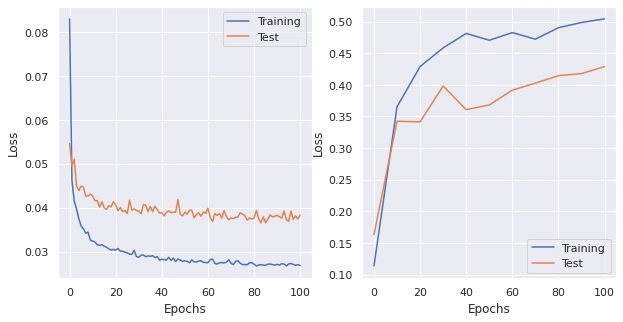

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1083. Test R^2: 0.1266. Loss Train: 0.0824. Loss Val: 0.0541. Time: 7.4735
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3870. Test R^2: 0.3421. Loss Train: 0.0327. Loss Val: 0.0414. Time: 7.4876
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4120. Test R^2: 0.3779. Loss Train: 0.0303. Loss Val: 0.0403. Time: 7.3914
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4267. Test R^2: 0.3347. Loss Train: 0.0289. Loss Val: 0.0396. Time: 7.6316
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4506. Test R^2: 0.3880. Loss Train: 0.0287. Loss Val: 0.0389. Time: 7.4401
 EPOCH 50. Progre

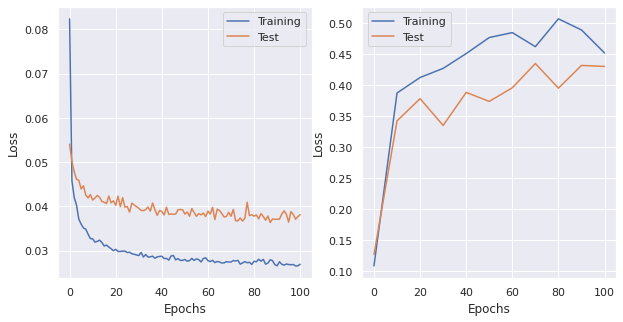

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1070. Test R^2: 0.0471. Loss Train: 0.0802. Loss Val: 0.0563. Time: 7.5353
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3918. Test R^2: 0.3293. Loss Train: 0.0328. Loss Val: 0.0426. Time: 7.4399
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4515. Test R^2: 0.3170. Loss Train: 0.0306. Loss Val: 0.0405. Time: 7.4848
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4666. Test R^2: 0.3369. Loss Train: 0.0289. Loss Val: 0.0404. Time: 7.3415
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4717. Test R^2: 0.4061. Loss Train: 0.0282. Loss Val: 0.0387. Time: 7.7051
 EPOCH 50. Pr

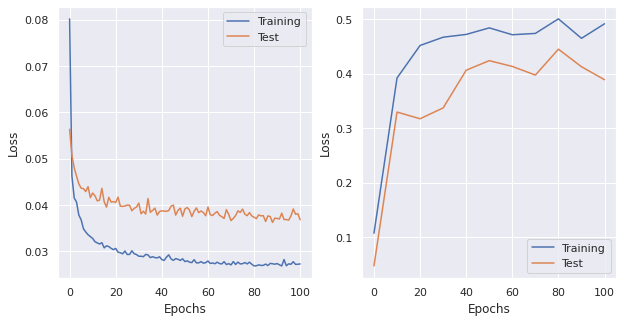

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0796. Test R^2: 0.0858. Loss Train: 0.0806. Loss Val: 0.0549. Time: 7.3279
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3790. Test R^2: 0.3604. Loss Train: 0.0320. Loss Val: 0.0411. Time: 7.4359
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4392. Test R^2: 0.3785. Loss Train: 0.0303. Loss Val: 0.0399. Time: 7.4140
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4496. Test R^2: 0.3353. Loss Train: 0.0291. Loss Val: 0.0403. Time: 7.3799
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4571. Test R^2: 0.3998. Loss Train: 0.0288. Loss Val: 0.0384. Time: 7.6190
 EPOCH 50.

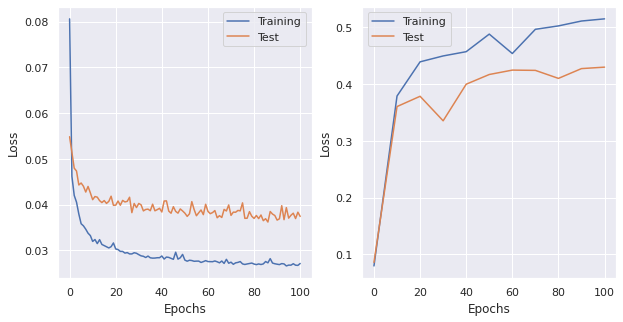

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100

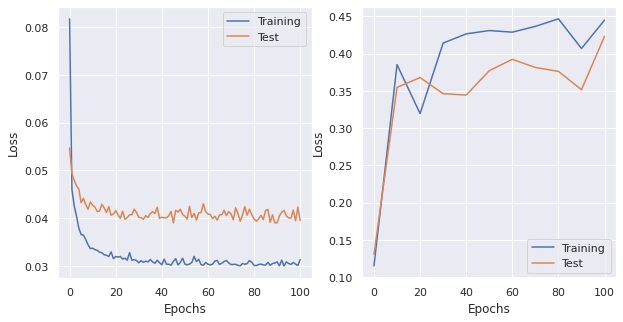

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0963. Test R^2: 0.1089. Loss Train: 0.0839. Loss Val: 0.0540. Time: 7.2142
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3607. Test R^2: 0.3602. Loss Train: 0.0339. Loss Val: 0.0418. Time: 7.5605
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4069. Test R^2: 0.3844. Loss Train: 0.0326. Loss Val: 0.0411. Time: 7.5645
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4063. Test R^2: 0.3393. Loss Train: 0.0308. Loss Val: 0.0404. Time: 7.5320
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4253. Test R^2: 0.3633. Loss Train: 0.0307. Loss Val: 0.0409. Time: 7.4195
 EPOCH 50. 

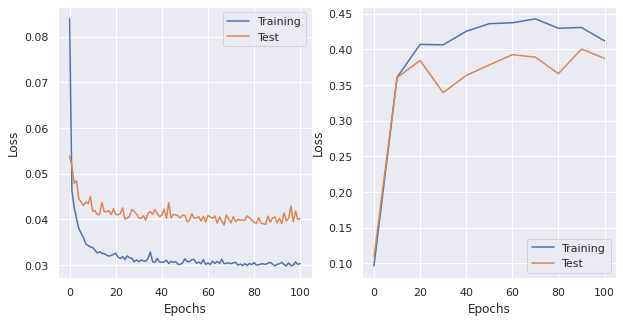

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1088. Test R^2: 0.1347. Loss Train: 0.0814. Loss Val: 0.0555. Time: 7.6446
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3948. Test R^2: 0.3422. Loss Train: 0.0338. Loss Val: 0.0433. Time: 7.4822
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4133. Test R^2: 0.3280. Loss Train: 0.0320. Loss Val: 0.0418. Time: 7.4013
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4118. Test R^2: 0.3757. Loss Train: 0.0308. Loss Val: 0.0403. Time: 7.5721
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4286. Test R^2: 0.3733. Loss Train: 0.0307. Loss Val: 0.0402. Time: 7.2892
 EPOCH 

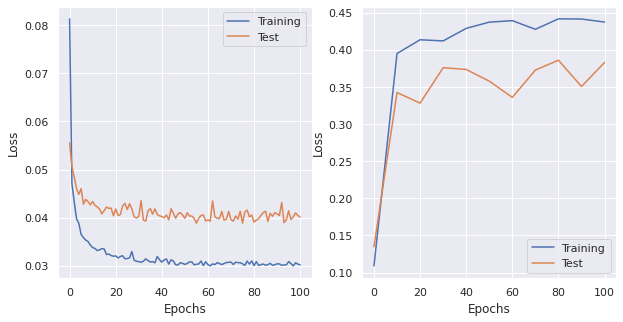

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1130. Test R^2: 0.1797. Loss Train: 0.0842. Loss Val: 0.0541. Time: 7.6727
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3579. Test R^2: 0.3232. Loss Train: 0.0339. Loss Val: 0.0422. Time: 7.5717
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.3985. Test R^2: 0.3248. Loss Train: 0.0316. Loss Val: 0.0411. Time: 7.3961
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4394. Test R^2: 0.3521. Loss Train: 0.0309. Loss Val: 0.0409. Time: 7.3882
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4312. Test R^2: 0.3712. Loss Train: 0.0309. Loss Val: 0.0401. Time: 7.4152
 EPO

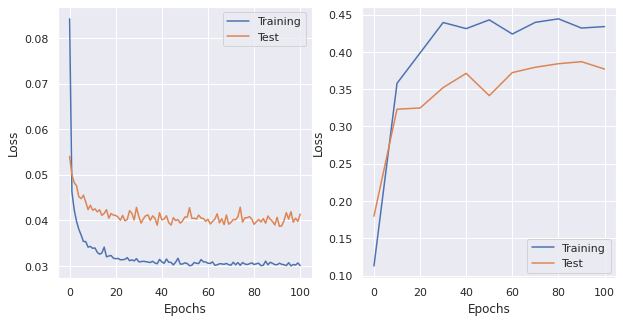

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of

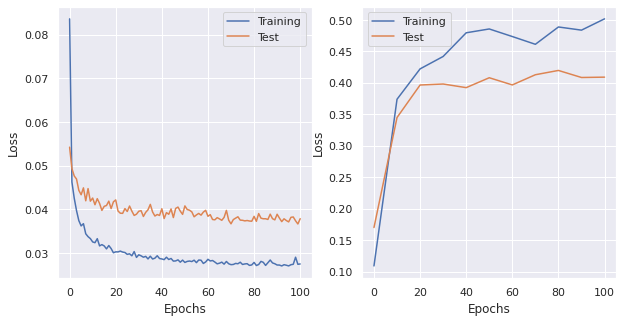

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1051. Test R^2: 0.1607. Loss Train: 0.0834. Loss Val: 0.0532. Time: 7.8264
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3939. Test R^2: 0.3447. Loss Train: 0.0327. Loss Val: 0.0433. Time: 7.3331
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4260. Test R^2: 0.3613. Loss Train: 0.0303. Loss Val: 0.0410. Time: 7.2400
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4663. Test R^2: 0.3978. Loss Train: 0.0295. Loss Val: 0.0390. Time: 7.5440
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4882. Test R^2: 0.3770. Loss Train: 0.0283. Loss Val: 0.0395. Time: 7.3307
 EPOCH 5

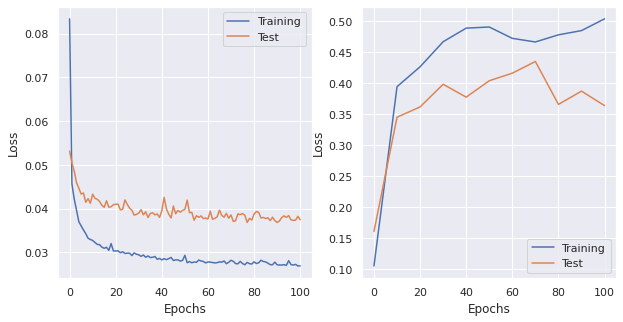

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0934. Test R^2: 0.1121. Loss Train: 0.0807. Loss Val: 0.0562. Time: 7.6322
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3841. Test R^2: 0.3617. Loss Train: 0.0327. Loss Val: 0.0415. Time: 7.4924
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4093. Test R^2: 0.3701. Loss Train: 0.0306. Loss Val: 0.0415. Time: 7.4015
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4403. Test R^2: 0.3869. Loss Train: 0.0295. Loss Val: 0.0406. Time: 7.2939
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4689. Test R^2: 0.3929. Loss Train: 0.0284. Loss Val: 0.0387. Time: 7.6307
 EPO

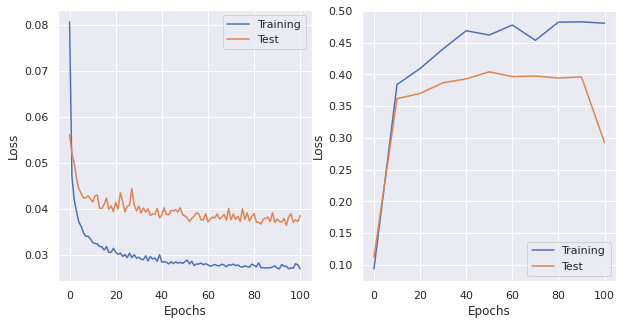

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1004. Test R^2: 0.1526. Loss Train: 0.0840. Loss Val: 0.0547. Time: 7.4578
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3779. Test R^2: 0.3273. Loss Train: 0.0325. Loss Val: 0.0429. Time: 7.8453
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4119. Test R^2: 0.3285. Loss Train: 0.0304. Loss Val: 0.0395. Time: 7.6032
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4636. Test R^2: 0.3947. Loss Train: 0.0294. Loss Val: 0.0410. Time: 7.1874
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4570. Test R^2: 0.3485. Loss Train: 0.0283. Loss Val: 0.0387. Time: 7.4860
 

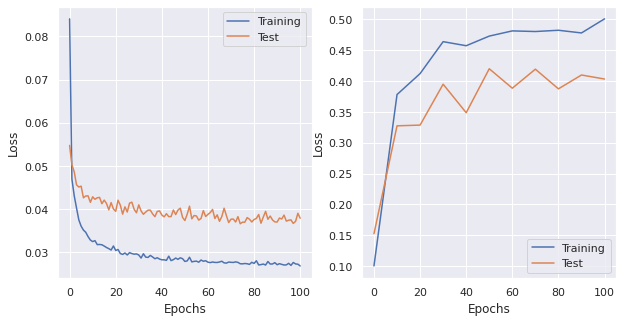

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.001


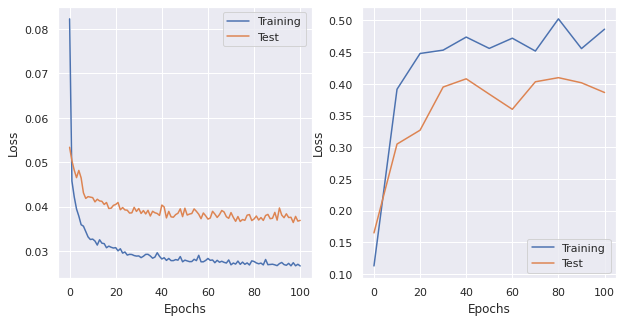

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0980. Test R^2: 0.1349. Loss Train: 0.0810. Loss Val: 0.0540. Time: 7.5524
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3934. Test R^2: 0.3448. Loss Train: 0.0331. Loss Val: 0.0411. Time: 7.5735
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4238. Test R^2: 0.3839. Loss Train: 0.0303. Loss Val: 0.0401. Time: 7.6995
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4578. Test R^2: 0.3805. Loss Train: 0.0290. Loss Val: 0.0410. Time: 7.3985
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4638. Test R^2: 0.4017. Loss Train: 0.0286. Loss Val: 0.0377. Time: 7.5292
 EPOC

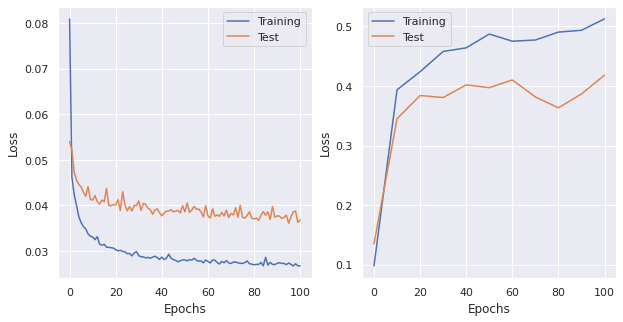

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0925. Test R^2: 0.1361. Loss Train: 0.0825. Loss Val: 0.0562. Time: 7.6347
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3517. Test R^2: 0.3522. Loss Train: 0.0329. Loss Val: 0.0423. Time: 7.7066
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4295. Test R^2: 0.3420. Loss Train: 0.0301. Loss Val: 0.0394. Time: 7.4265
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4604. Test R^2: 0.3815. Loss Train: 0.0295. Loss Val: 0.0393. Time: 7.7373
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4444. Test R^2: 0.3997. Loss Train: 0.0282. Loss Val: 0.0397. Time: 7.3293
 

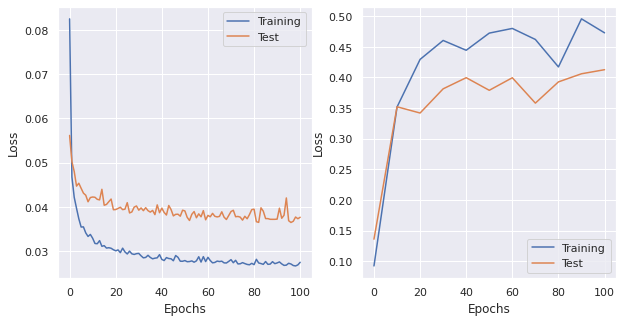

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0871. Test R^2: 0.1775. Loss Train: 0.0828. Loss Val: 0.0534. Time: 7.4863
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3937. Test R^2: 0.3346. Loss Train: 0.0326. Loss Val: 0.0422. Time: 7.6658
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4298. Test R^2: 0.3323. Loss Train: 0.0299. Loss Val: 0.0397. Time: 7.7245
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4668. Test R^2: 0.3823. Loss Train: 0.0292. Loss Val: 0.0381. Time: 7.3475
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4703. Test R^2: 0.3658. Loss Train: 0.0280. Loss Val: 0.0398. Time: 7.676

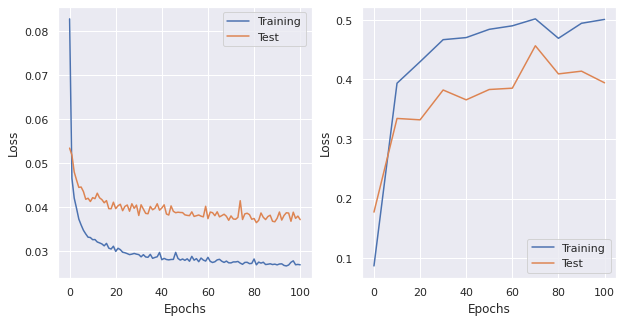

saving  ./plots/LogisticReg_lr0.01_momentum0_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0

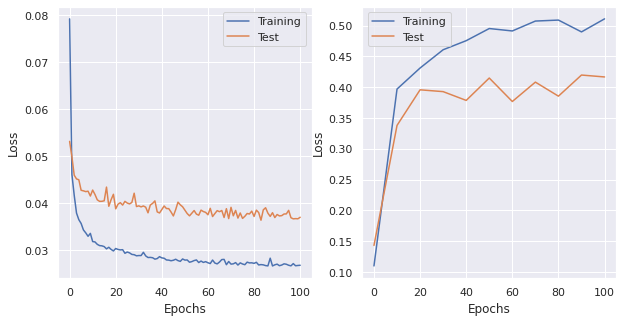

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1090. Test R^2: 0.1654. Loss Train: 0.0833. Loss Val: 0.0551. Time: 7.4926
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4101. Test R^2: 0.3067. Loss Train: 0.0332. Loss Val: 0.0437. Time: 7.4872
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4555. Test R^2: 0.3685. Loss Train: 0.0306. Loss Val: 0.0417. Time: 7.6985
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4635. Test R^2: 0.3914. Loss Train: 0.0288. Loss Val: 0.0394. Time: 7.5754
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4445. Test R^2: 0.3934. Loss Train: 0.0285. Loss Val: 0.0402. Time: 7.3933
 EPOCH 50. 

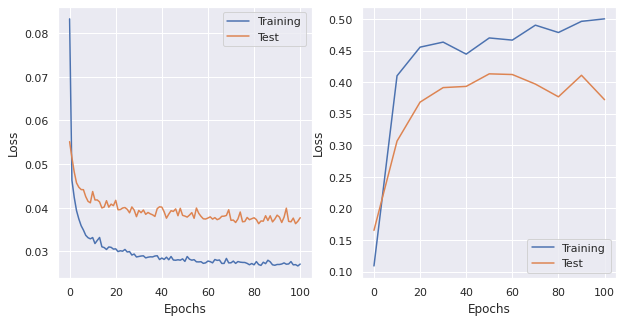

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1312. Test R^2: 0.1841. Loss Train: 0.0796. Loss Val: 0.0549. Time: 7.5948
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4134. Test R^2: 0.3177. Loss Train: 0.0332. Loss Val: 0.0411. Time: 7.6434
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4507. Test R^2: 0.3978. Loss Train: 0.0298. Loss Val: 0.0408. Time: 7.4928
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4507. Test R^2: 0.4112. Loss Train: 0.0295. Loss Val: 0.0384. Time: 7.5877
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4539. Test R^2: 0.3692. Loss Train: 0.0279. Loss Val: 0.0392. Time: 7.5399
 EPOCH 

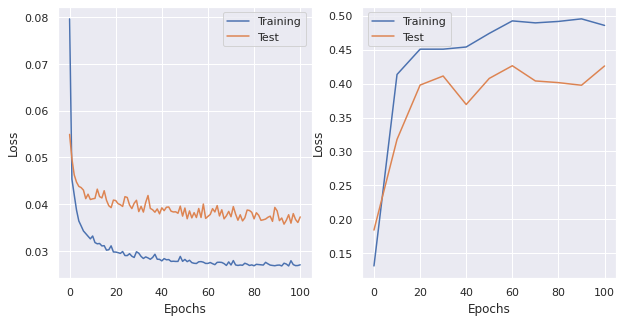

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1186. Test R^2: 0.1624. Loss Train: 0.0785. Loss Val: 0.0549. Time: 7.4608
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4085. Test R^2: 0.3778. Loss Train: 0.0323. Loss Val: 0.0413. Time: 7.6004
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4349. Test R^2: 0.3891. Loss Train: 0.0295. Loss Val: 0.0397. Time: 7.6754
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4393. Test R^2: 0.3865. Loss Train: 0.0293. Loss Val: 0.0391. Time: 7.2267
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4633. Test R^2: 0.3987. Loss Train: 0.0280. Loss Val: 0.0389. Time: 7.7683
 EPO

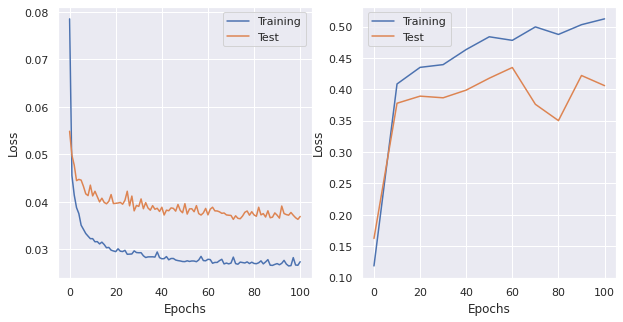

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1195. Test R^2: 0.1512. Loss Train: 0.0801. Loss Val: 0.0535. Time: 7.3907
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3993. Test R^2: 0.3628. Loss Train: 0.0321. Loss Val: 0.0414. Time: 8.1270
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.3811. Test R^2: 0.3821. Loss Train: 0.0300. Loss Val: 0.0425. Time: 7.4789
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4433. Test R^2: 0.3917. Loss Train: 0.0287. Loss Val: 0.0413. Time: 7.1716
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4849. Test R^2: 0.3955. Loss Train: 0.0290. Loss Val: 0.0388. Time: 7.2772
 EPOCH 50. Pr

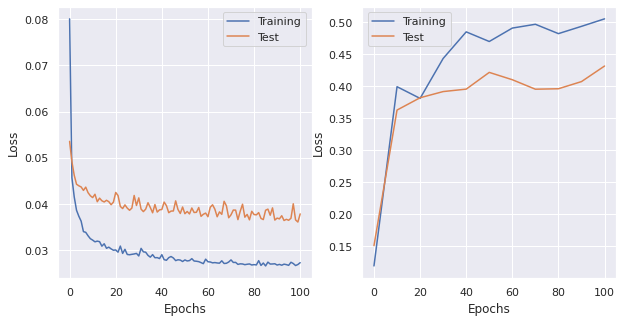

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1152. Test R^2: 0.1504. Loss Train: 0.0789. Loss Val: 0.0533. Time: 7.5198
 EPOCH 10. Progress: 10.0

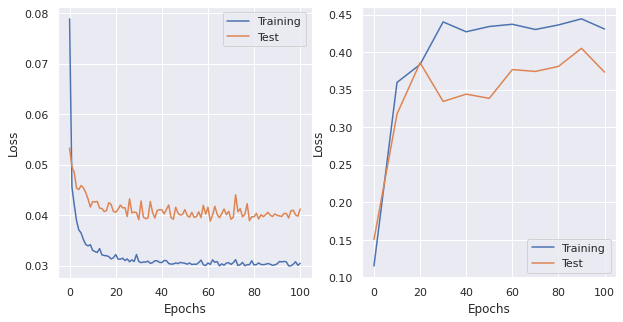

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1015. Test R^2: 0.1382. Loss Train: 0.0857. Loss Val: 0.0534. Time: 7.3952
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3812. Test R^2: 0.3205. Loss Train: 0.0335. Loss Val: 0.0410. Time: 7.5211
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4148. Test R^2: 0.3685. Loss Train: 0.0324. Loss Val: 0.0400. Time: 7.4364
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4153. Test R^2: 0.3830. Loss Train: 0.0313. Loss Val: 0.0400. Time: 7.3936
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4252. Test R^2: 0.3873. Loss Train: 0.0304. Loss Val: 0.0405. Time: 7.4860
 EPOC

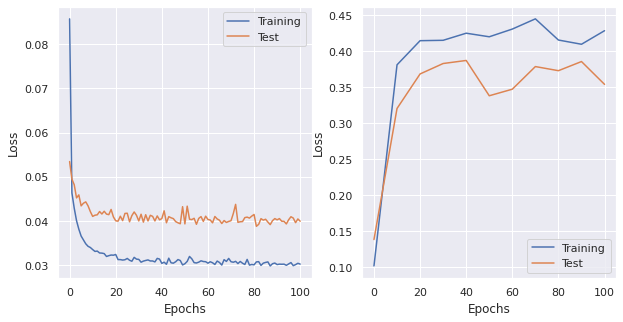

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0983. Test R^2: 0.1556. Loss Train: 0.0794. Loss Val: 0.0551. Time: 7.5844
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3652. Test R^2: 0.2855. Loss Train: 0.0338. Loss Val: 0.0424. Time: 7.3665
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.3833. Test R^2: 0.3679. Loss Train: 0.0313. Loss Val: 0.0414. Time: 7.8680
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4258. Test R^2: 0.3530. Loss Train: 0.0307. Loss Val: 0.0400. Time: 7.4638
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4399. Test R^2: 0.3679. Loss Train: 0.0302. Loss Val: 0.0427. Time: 7.3803
 

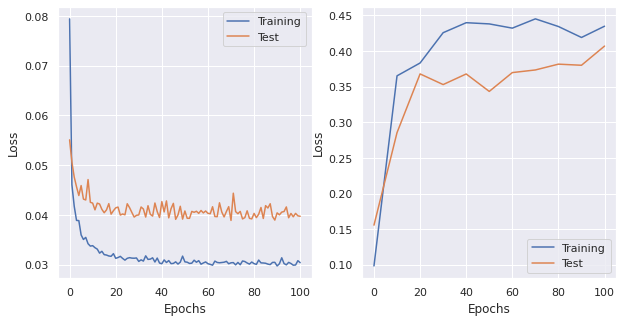

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1373. Test R^2: 0.1734. Loss Train: 0.0802. Loss Val: 0.0553. Time: 7.4166
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3703. Test R^2: 0.3313. Loss Train: 0.0329. Loss Val: 0.0427. Time: 7.3195
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4267. Test R^2: 0.3131. Loss Train: 0.0318. Loss Val: 0.0402. Time: 7.4841
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4192. Test R^2: 0.3647. Loss Train: 0.0316. Loss Val: 0.0396. Time: 7.4263
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4198. Test R^2: 0.3750. Loss Train: 0.0305. Loss Val: 0.0398. Time: 7.723

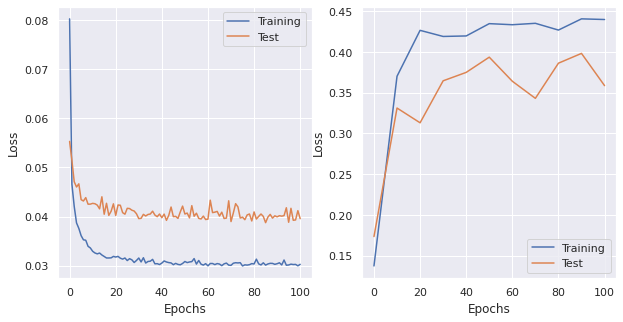

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1140. Test R^2: 0.1487. Loss Train: 0.0811. Loss Val: 0.0546. Time: 7.4488
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3746. Test R^2: 0.3344. Loss Train: 0.0330. Loss Val: 0.0419. Time: 7.5831
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4182. Test R^2: 0.3351. Loss Train: 0.0314. Loss Val: 0.0403. Time: 7.2452
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4293. Test R^2: 0.3969. Loss Train: 0.0306. Loss Val: 0.0398. Time: 7.3970
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4123. Test R^2: 0.3862. Loss Train: 0.0302. Loss Val: 0.0407. Time: 7.2853
 EPOCH 

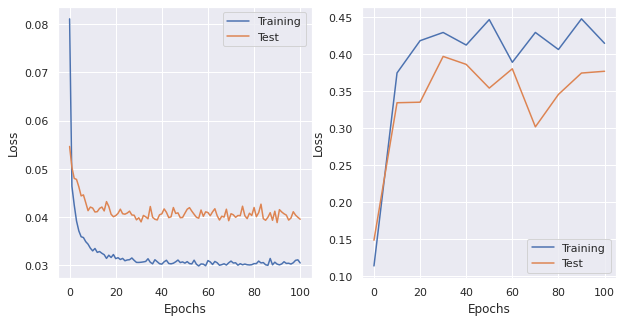

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0765. Test R^2: 0.1663. Loss Train: 0.0791. Loss Val: 0.0550. Time: 7.4192
 EPOCH 10. Prog

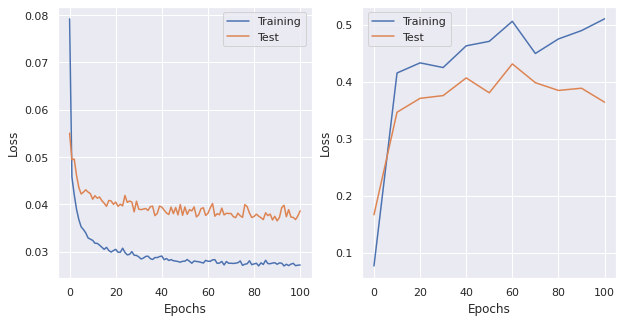

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1159. Test R^2: 0.1540. Loss Train: 0.0806. Loss Val: 0.0542. Time: 7.4976
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4150. Test R^2: 0.3329. Loss Train: 0.0325. Loss Val: 0.0429. Time: 7.5569
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4097. Test R^2: 0.3757. Loss Train: 0.0322. Loss Val: 0.0406. Time: 8.0793
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4553. Test R^2: 0.3898. Loss Train: 0.0289. Loss Val: 0.0388. Time: 7.1959
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4680. Test R^2: 0.4028. Loss Train: 0.0283. Loss Val: 0.0398. Time: 7.2761
 E

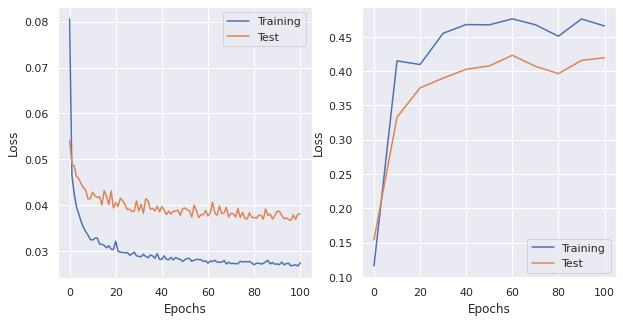

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1365. Test R^2: 0.1301. Loss Train: 0.0794. Loss Val: 0.0545. Time: 7.6441
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3837. Test R^2: 0.3587. Loss Train: 0.0323. Loss Val: 0.0425. Time: 7.1535
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4447. Test R^2: 0.3688. Loss Train: 0.0300. Loss Val: 0.0410. Time: 7.4993
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4300. Test R^2: 0.3792. Loss Train: 0.0288. Loss Val: 0.0414. Time: 7.4996
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4664. Test R^2: 0.3425. Loss Train: 0.0285. Loss Val: 0.0392. Time: 7.457

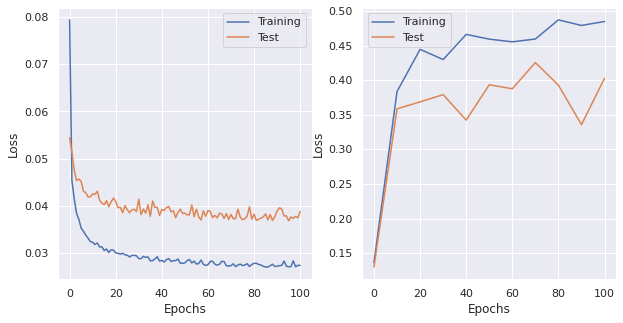

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1179. Test R^2: 0.1661. Loss Train: 0.0797. Loss Val: 0.0538. Time: 7.2195
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3711. Test R^2: 0.3524. Loss Train: 0.0321. Loss Val: 0.0412. Time: 7.5568
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4254. Test R^2: 0.3699. Loss Train: 0.0300. Loss Val: 0.0412. Time: 7.3540
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4550. Test R^2: 0.3279. Loss Train: 0.0293. Loss Val: 0.0402. Time: 7.3663
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4632. Test R^2: 0.3988. Loss Train: 0.0283. Loss Val: 0.0381. Time: 7.

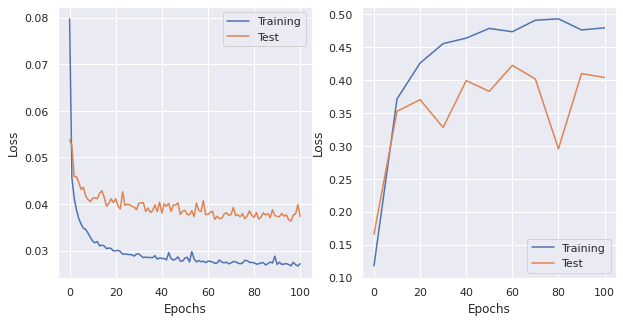

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1152. Test R^2: 0.1606. Loss Train: 0.0769. Loss Val: 0.0534. Time: 7.4857
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3928. Test R^2: 0.2789. Loss Train: 0.0320. Loss Val: 0.0434. Time: 7.4823
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4483. Test R^2: 0.3800. Loss Train: 0.0299. Loss Val: 0.0397. Time: 7.6904
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4675. Test R^2: 0.3926. Loss Train: 0.0293. Loss Val: 0.0384. Time: 7.0465
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4780. Test R^2: 0.4173. Loss Train: 0.0282. Loss Val: 0.0376. Time: 7.6939
 EPO

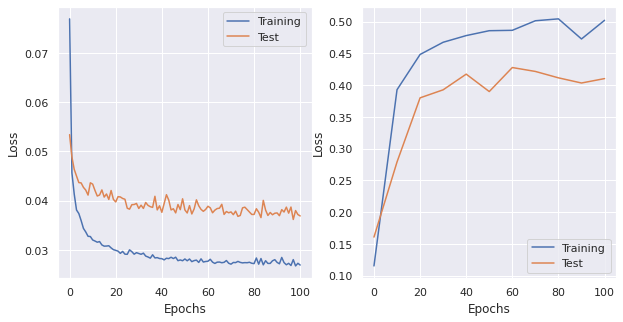

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1089. Test R^2: 0.1399. Loss Train: 0.0800. Loss Val: 0.0542. Time: 7.5310
 EPOCH 10

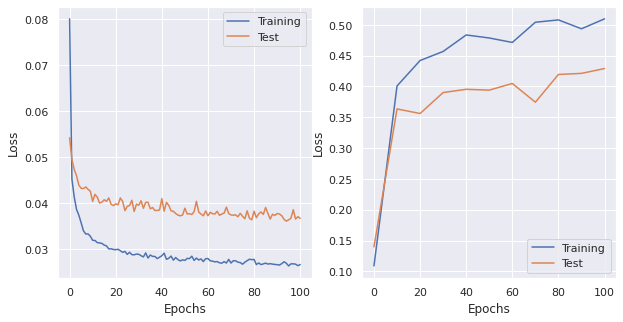

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1193. Test R^2: 0.1384. Loss Train: 0.0834. Loss Val: 0.0539. Time: 7.2919
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3921. Test R^2: 0.3435. Loss Train: 0.0329. Loss Val: 0.0410. Time: 7.5486
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4339. Test R^2: 0.3726. Loss Train: 0.0300. Loss Val: 0.0392. Time: 7.5031
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4334. Test R^2: 0.2142. Loss Train: 0.0290. Loss Val: 0.0387. Time: 7.1707
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4210. Test R^2: 0.3897. Loss Train: 0.0287. Loss Val: 0.0394. Time: 7.6586

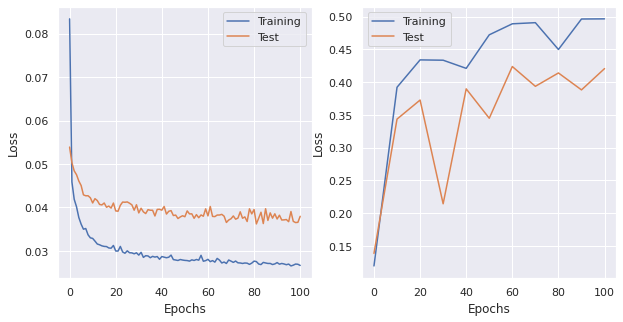

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1225. Test R^2: 0.1679. Loss Train: 0.0823. Loss Val: 0.0535. Time: 7.1079
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4069. Test R^2: 0.3744. Loss Train: 0.0321. Loss Val: 0.0403. Time: 7.4268
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4502. Test R^2: 0.3433. Loss Train: 0.0299. Loss Val: 0.0404. Time: 7.4042
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4665. Test R^2: 0.4076. Loss Train: 0.0290. Loss Val: 0.0391. Time: 7.6660
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4741. Test R^2: 0.3833. Loss Train: 0.0288. Loss Val: 0.0385. Time: 7.

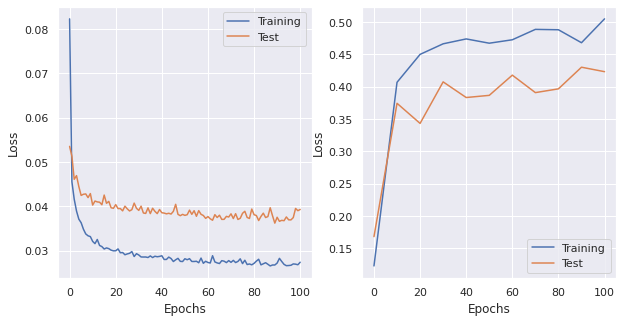

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0938. Test R^2: 0.1203. Loss Train: 0.0796. Loss Val: 0.0540. Time: 7.6044
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3967. Test R^2: 0.3581. Loss Train: 0.0327. Loss Val: 0.0426. Time: 7.3588
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4226. Test R^2: 0.3662. Loss Train: 0.0296. Loss Val: 0.0395. Time: 7.4042
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4479. Test R^2: 0.3694. Loss Train: 0.0296. Loss Val: 0.0392. Time: 7.3030
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4712. Test R^2: 0.4238. Loss Train: 0.0281. Loss Val: 0.0414. Time:

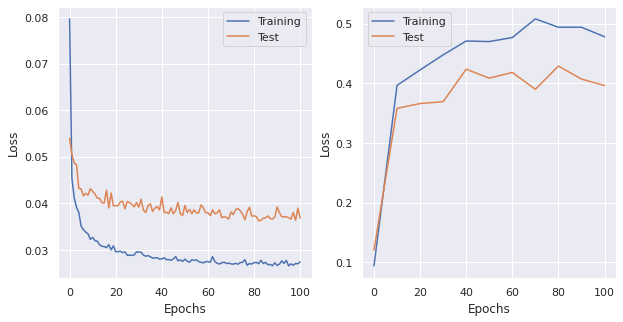

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1040. Test R^2: 0.1097. Loss Train: 0.0797. Loss Val: 0.0546. Time: 7.0588
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4050. Test R^2: 0.3475. Loss Train: 0.0323. Loss Val: 0.0416. Time: 7.3228
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4455. Test R^2: 0.3847. Loss Train: 0.0298. Loss Val: 0.0398. Time: 7.3015
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4704. Test R^2: 0.3850. Loss Train: 0.0289. Loss Val: 0.0393. Time: 7.3701
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4577. Test R^2: 0.3780. Loss Train: 0.0289. Loss Val: 0.0376. Time: 7.3795
 

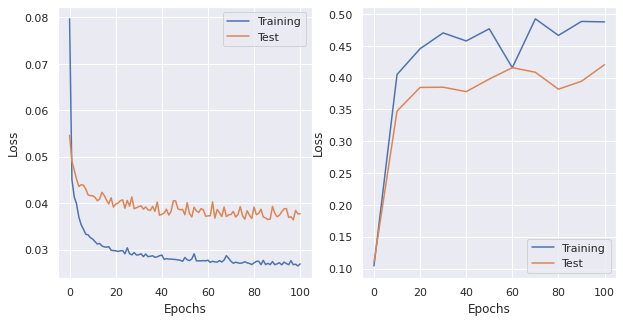

saving  ./plots/LogisticReg_lr0.01_momentum0.1_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0876. Test R^2: 0.1693. Loss Train: 0.0815. Loss Val: 0.0536. Time: 7.4832
 EPOCH 10. 

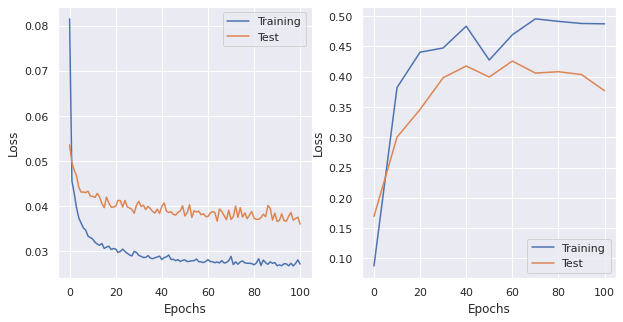

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0691. Test R^2: 0.1765. Loss Train: 0.0839. Loss Val: 0.0551. Time: 7.1207
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3727. Test R^2: 0.3166. Loss Train: 0.0335. Loss Val: 0.0424. Time: 7.2573
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4188. Test R^2: 0.3237. Loss Train: 0.0308. Loss Val: 0.0400. Time: 7.2797
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4693. Test R^2: 0.3721. Loss Train: 0.0295. Loss Val: 0.0390. Time: 7.0752
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4773. Test R^2: 0.3916. Loss Train: 0.0286. Loss Val: 0.0393. Time: 7.7581
 EPOCH 5

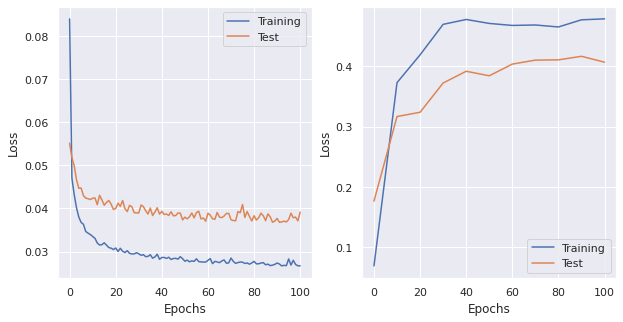

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0799. Test R^2: 0.1049. Loss Train: 0.0826. Loss Val: 0.0546. Time: 7.4636
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3957. Test R^2: 0.3166. Loss Train: 0.0323. Loss Val: 0.0410. Time: 7.1719
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4625. Test R^2: 0.3921. Loss Train: 0.0302. Loss Val: 0.0399. Time: 7.3216
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4633. Test R^2: 0.3835. Loss Train: 0.0289. Loss Val: 0.0411. Time: 7.7254
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4652. Test R^2: 0.3884. Loss Train: 0.0281. Loss Val: 0.0384. Time: 7.1879
 EPO

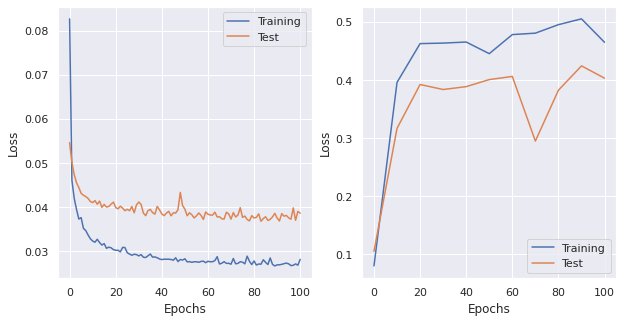

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1162. Test R^2: 0.1579. Loss Train: 0.0817. Loss Val: 0.0544. Time: 7.0869
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4103. Test R^2: 0.3289. Loss Train: 0.0328. Loss Val: 0.0431. Time: 7.2542
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4454. Test R^2: 0.3665. Loss Train: 0.0305. Loss Val: 0.0396. Time: 7.3379
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4669. Test R^2: 0.3161. Loss Train: 0.0287. Loss Val: 0.0394. Time: 7.3092
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4907. Test R^2: 0.4141. Loss Train: 0.0281. Loss Val: 0.0385. Time: 7.4349
 

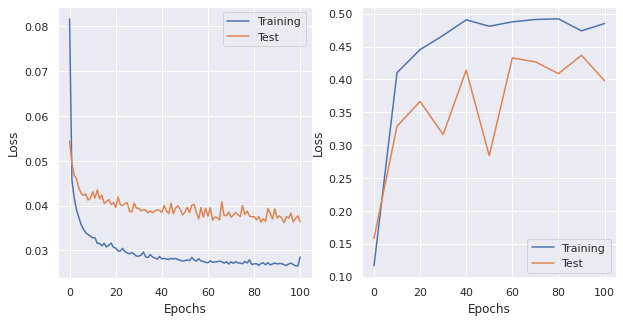

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0994. Test R^2: 0.1163. Loss Train: 0.0804. Loss Val: 0.0556. Time: 7.3128
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4055. Test R^2: 0.3374. Loss Train: 0.0320. Loss Val: 0.0407. Time: 7.2286
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.3995. Test R^2: 0.3658. Loss Train: 0.0305. Loss Val: 0.0408. Time: 7.5220
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4154. Test R^2: 0.3566. Loss Train: 0.0292. Loss Val: 0.0400. Time: 7.3640
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4699. Test R^2: 0.4112. Loss Train: 0.0283. Loss Val: 0.0406. Time: 7.7253
 EPOCH 50.

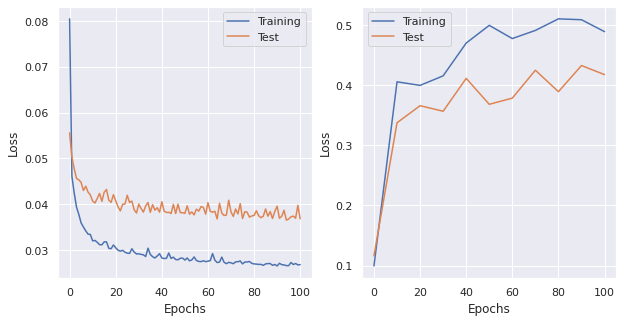

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1076. Test R^2: 0.1822. Loss Train: 0.0840. Loss Val: 0.0561. Time: 7.2842
 EPOCH 10. Progress

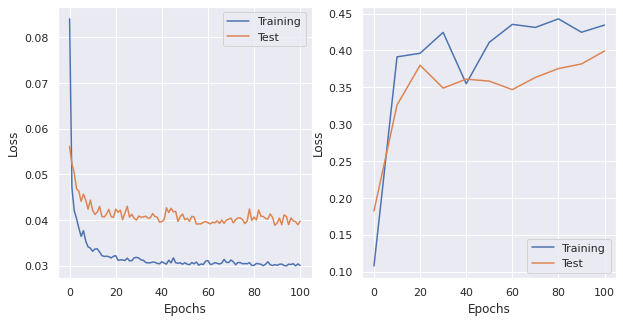

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0478. Test R^2: 0.1116. Loss Train: 0.0861. Loss Val: 0.0535. Time: 7.1594
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3770. Test R^2: 0.3279. Loss Train: 0.0342. Loss Val: 0.0428. Time: 7.2709
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4194. Test R^2: 0.3646. Loss Train: 0.0317. Loss Val: 0.0429. Time: 7.4902
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.3817. Test R^2: 0.3744. Loss Train: 0.0314. Loss Val: 0.0415. Time: 6.9454
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4340. Test R^2: 0.3619. Loss Train: 0.0311. Loss Val: 0.0416. Time: 7.4267
 E

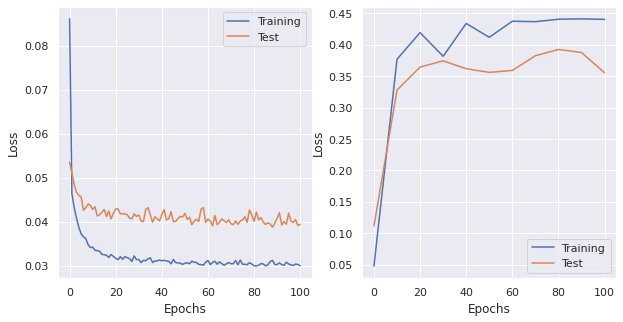

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1011. Test R^2: 0.1880. Loss Train: 0.0834. Loss Val: 0.0545. Time: 7.2168
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3861. Test R^2: 0.3510. Loss Train: 0.0338. Loss Val: 0.0431. Time: 7.2765
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4086. Test R^2: 0.3527. Loss Train: 0.0322. Loss Val: 0.0416. Time: 7.2969
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4302. Test R^2: 0.3828. Loss Train: 0.0311. Loss Val: 0.0422. Time: 7.5279
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4465. Test R^2: 0.3601. Loss Train: 0.0310. Loss Val: 0.0398. Time: 7.378

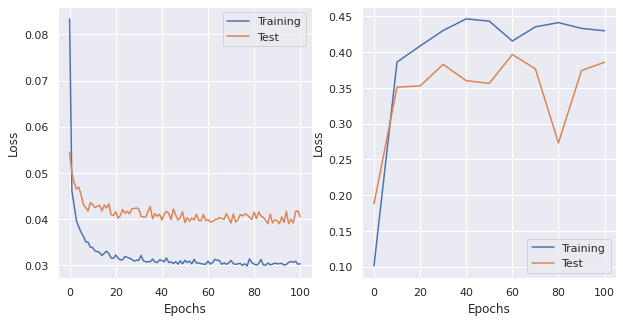

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1086. Test R^2: 0.1345. Loss Train: 0.0830. Loss Val: 0.0543. Time: 7.3937
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3571. Test R^2: 0.3291. Loss Train: 0.0339. Loss Val: 0.0437. Time: 7.5882
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4086. Test R^2: 0.2777. Loss Train: 0.0318. Loss Val: 0.0417. Time: 7.2667
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4248. Test R^2: 0.3702. Loss Train: 0.0309. Loss Val: 0.0396. Time: 7.3548
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4070. Test R^2: 0.3648. Loss Train: 0.0311. Loss Val: 0.0400. Time: 6.

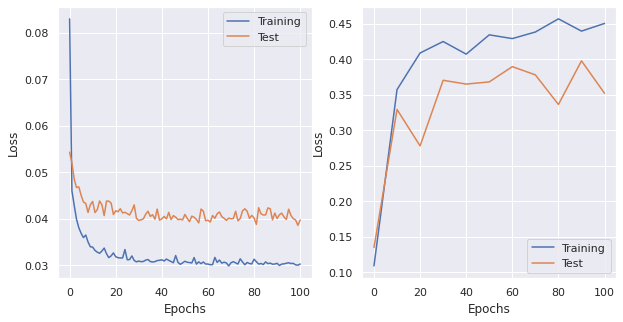

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0909. Test R^2: 0.1366. Loss Train: 0.0819. Loss Val: 0.0542. Time: 7.4469
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3559. Test R^2: 0.2355. Loss Train: 0.0334. Loss Val: 0.0439. Time: 7.3984
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4119. Test R^2: 0.3525. Loss Train: 0.0317. Loss Val: 0.0403. Time: 7.2122
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4101. Test R^2: 0.3660. Loss Train: 0.0307. Loss Val: 0.0404. Time: 7.1018
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4355. Test R^2: 0.3647. Loss Train: 0.0307. Loss Val: 0.0410. Time: 7.2131
 EPO

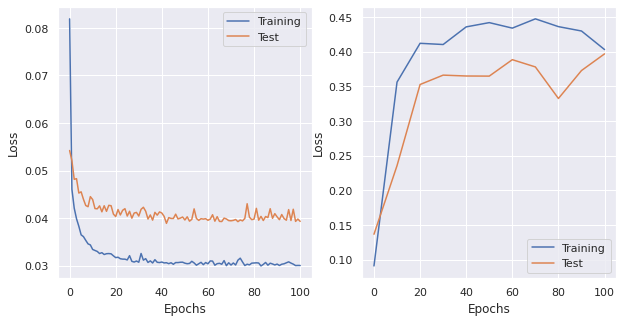

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1168. Test R^2: 0.1383. Loss Train: 0.0813. Loss Val: 0.0551. Time: 6.8032
 EPOCH 10

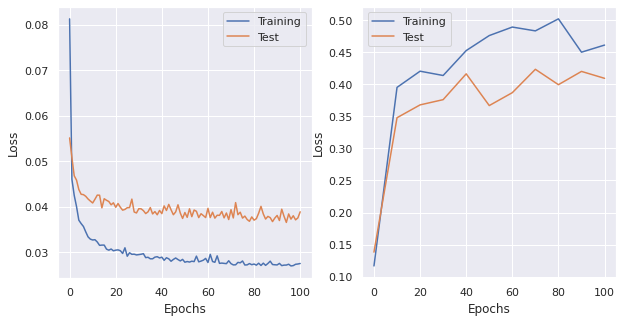

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0941. Test R^2: 0.1239. Loss Train: 0.0836. Loss Val: 0.0578. Time: 7.2752
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3945. Test R^2: 0.3364. Loss Train: 0.0332. Loss Val: 0.0415. Time: 6.9963
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4358. Test R^2: 0.3541. Loss Train: 0.0308. Loss Val: 0.0410. Time: 7.0850
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4289. Test R^2: 0.3825. Loss Train: 0.0296. Loss Val: 0.0405. Time: 7.3948
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4440. Test R^2: 0.3698. Loss Train: 0.0287. Loss Val: 0.0397. Time: 7.4158

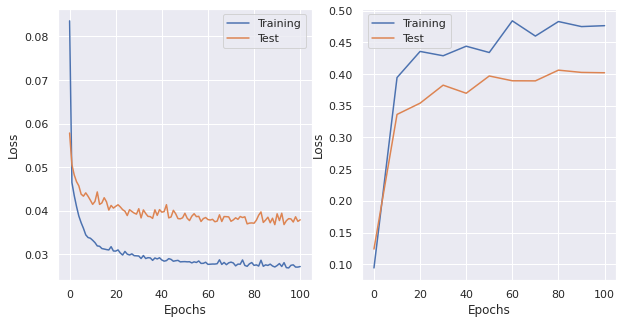

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0750. Test R^2: 0.1214. Loss Train: 0.0823. Loss Val: 0.0563. Time: 7.5863
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4156. Test R^2: 0.3275. Loss Train: 0.0333. Loss Val: 0.0425. Time: 7.5580
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4407. Test R^2: 0.3530. Loss Train: 0.0300. Loss Val: 0.0406. Time: 7.3765
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4576. Test R^2: 0.3777. Loss Train: 0.0305. Loss Val: 0.0389. Time: 7.4874
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4828. Test R^2: 0.3823. Loss Train: 0.0286. Loss Val: 0.0399. Time: 7.

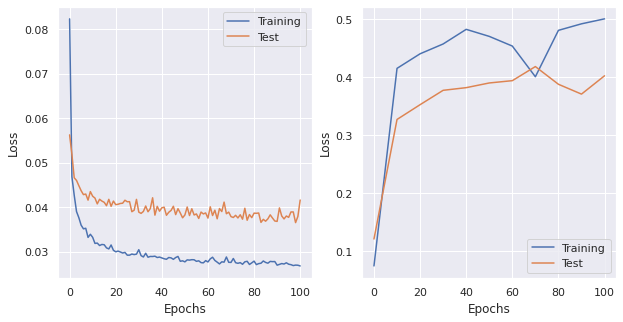

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0988. Test R^2: 0.1297. Loss Train: 0.0820. Loss Val: 0.0544. Time: 7.2958
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3880. Test R^2: 0.3039. Loss Train: 0.0332. Loss Val: 0.0435. Time: 7.2771
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4403. Test R^2: 0.3673. Loss Train: 0.0302. Loss Val: 0.0406. Time: 7.1467
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4595. Test R^2: 0.4009. Loss Train: 0.0291. Loss Val: 0.0382. Time: 7.4167
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4779. Test R^2: 0.3822. Loss Train: 0.0290. Loss Val: 0.0393. Time:

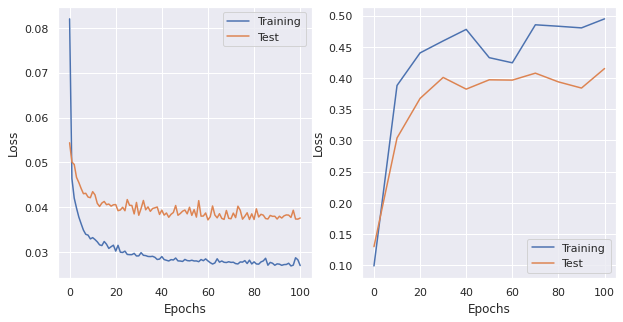

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0924. Test R^2: 0.1595. Loss Train: 0.0836. Loss Val: 0.0556. Time: 7.1843
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4000. Test R^2: 0.3184. Loss Train: 0.0334. Loss Val: 0.0412. Time: 7.6359
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4067. Test R^2: 0.3665. Loss Train: 0.0302. Loss Val: 0.0405. Time: 7.1557
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4785. Test R^2: 0.3584. Loss Train: 0.0291. Loss Val: 0.0387. Time: 7.5917
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4172. Test R^2: 0.3039. Loss Train: 0.0294. Loss Val: 0.0390. Time: 7.3233
 

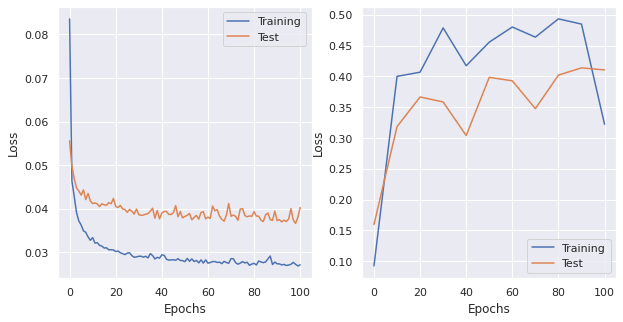

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0852. Test R^2: 0.1366. Loss Train: 0.0835. Loss Val: 0.0545. Time: 7.2895
 EP

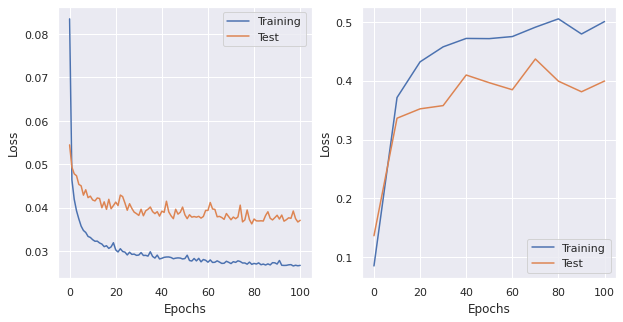

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0781. Test R^2: 0.1539. Loss Train: 0.0856. Loss Val: 0.0551. Time: 7.1784
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3911. Test R^2: 0.3550. Loss Train: 0.0328. Loss Val: 0.0415. Time: 7.3054
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4389. Test R^2: 0.3763. Loss Train: 0.0305. Loss Val: 0.0399. Time: 7.3997
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4683. Test R^2: 0.3755. Loss Train: 0.0291. Loss Val: 0.0391. Time: 7.1431
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4594. Test R^2: 0.3616. Loss Train: 0.0288. Loss Val: 0.0417. Time: 7.3

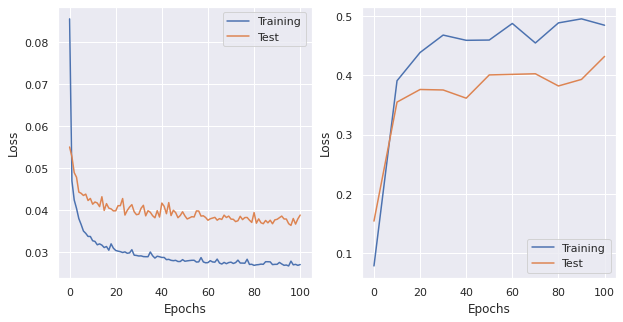

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1160. Test R^2: 0.1625. Loss Train: 0.0805. Loss Val: 0.0552. Time: 7.3944
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3865. Test R^2: 0.3364. Loss Train: 0.0326. Loss Val: 0.0416. Time: 7.1294
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4123. Test R^2: 0.3692. Loss Train: 0.0299. Loss Val: 0.0413. Time: 7.3296
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4334. Test R^2: 0.3975. Loss Train: 0.0289. Loss Val: 0.0394. Time: 7.5144
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4661. Test R^2: 0.3656. Loss Train: 0.0286. Loss Val: 0.0396. Time:

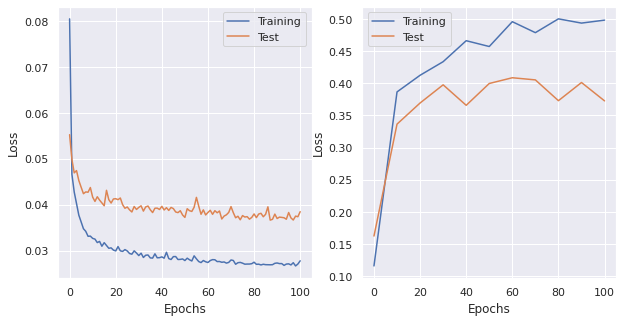

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1018. Test R^2: 0.1264. Loss Train: 0.0835. Loss Val: 0.0559. Time: 6.9294
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4070. Test R^2: 0.3484. Loss Train: 0.0329. Loss Val: 0.0414. Time: 7.1354
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4332. Test R^2: 0.3520. Loss Train: 0.0299. Loss Val: 0.0404. Time: 7.1810
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4559. Test R^2: 0.3522. Loss Train: 0.0294. Loss Val: 0.0392. Time: 7.2187
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4538. Test R^2: 0.3929. Loss Train: 0.0287. Loss Val: 0.0389. Ti

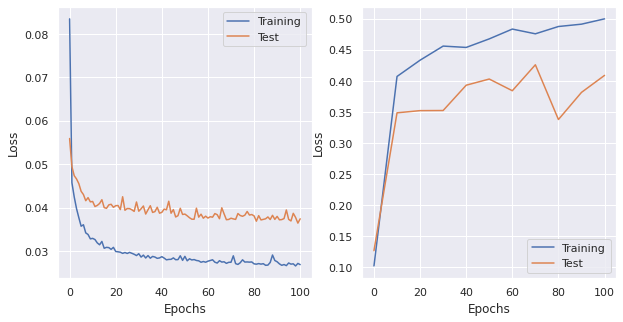

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.01
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1034. Test R^2: 0.1446. Loss Train: 0.0815. Loss Val: 0.0552. Time: 7.4662
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4014. Test R^2: 0.3532. Loss Train: 0.0330. Loss Val: 0.0423. Time: 7.2361
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4468. Test R^2: 0.3688. Loss Train: 0.0297. Loss Val: 0.0396. Time: 7.6573
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4624. Test R^2: 0.3521. Loss Train: 0.0287. Loss Val: 0.0403. Time: 7.4705
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4669. Test R^2: 0.3799. Loss Train: 0.0285. Loss Val: 0.0386. Time: 7.437

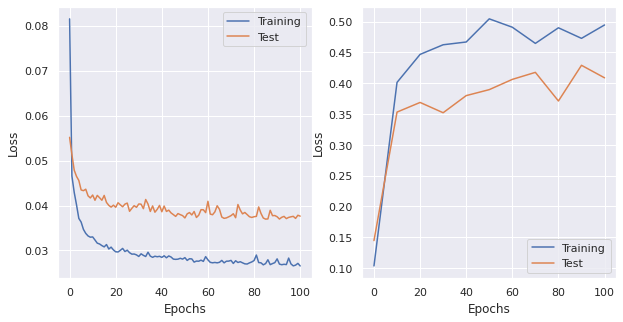

saving  ./plots/LogisticReg_lr0.01_momentum0.01_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.01, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1083. Test R^2: 0.1231. Loss Train: 0.0826. Loss Val: 0.0559. Time: 7.1450
 EPOC

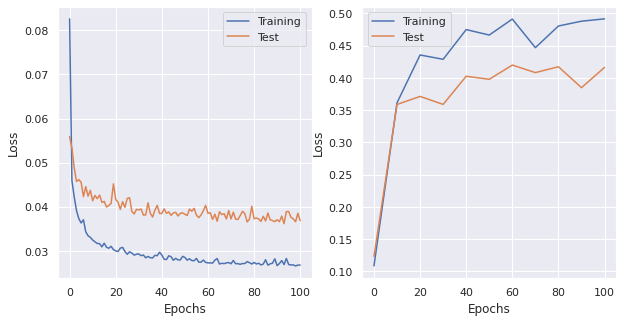

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0449. Test R^2: 0.1253. Loss Train: 0.0831. Loss Val: 0.0545. Time: 7.3918
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4034. Test R^2: 0.3457. Loss Train: 0.0327. Loss Val: 0.0418. Time: 7.4716
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4542. Test R^2: 0.3658. Loss Train: 0.0310. Loss Val: 0.0405. Time: 7.6456
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4587. Test R^2: 0.3939. Loss Train: 0.0294. Loss Val: 0.0391. Time: 7.5443
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4480. Test R^2: 0.3419. Loss Train: 0.0286. Loss Val: 0.0384. Time: 7.0249
 EPOC

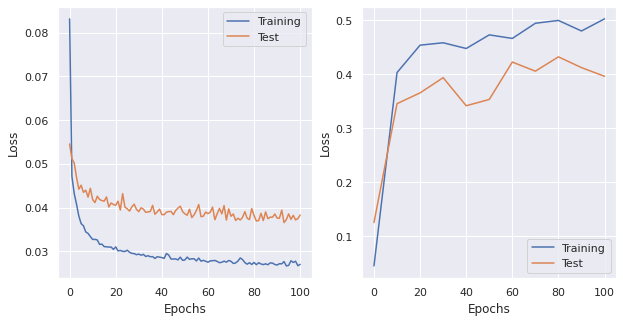

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0462. Test R^2: 0.1422. Loss Train: 0.0828. Loss Val: 0.0549. Time: 7.3542
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3887. Test R^2: 0.3276. Loss Train: 0.0330. Loss Val: 0.0409. Time: 7.2647
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4392. Test R^2: 0.3427. Loss Train: 0.0299. Loss Val: 0.0397. Time: 7.3200
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4583. Test R^2: 0.3830. Loss Train: 0.0291. Loss Val: 0.0402. Time: 6.8969
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4594. Test R^2: 0.3565. Loss Train: 0.0286. Loss Val: 0.0390. Time: 7.2504
 

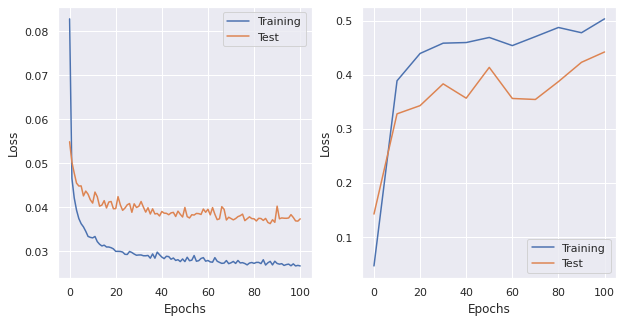

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1015. Test R^2: 0.1043. Loss Train: 0.0818. Loss Val: 0.0556. Time: 7.2112
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3946. Test R^2: 0.3445. Loss Train: 0.0327. Loss Val: 0.0419. Time: 7.4274
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4046. Test R^2: 0.3750. Loss Train: 0.0303. Loss Val: 0.0407. Time: 7.2318
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4617. Test R^2: 0.3884. Loss Train: 0.0295. Loss Val: 0.0409. Time: 7.5882
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4589. Test R^2: 0.4273. Loss Train: 0.0283. Loss Val: 0.0383. Time: 7.507

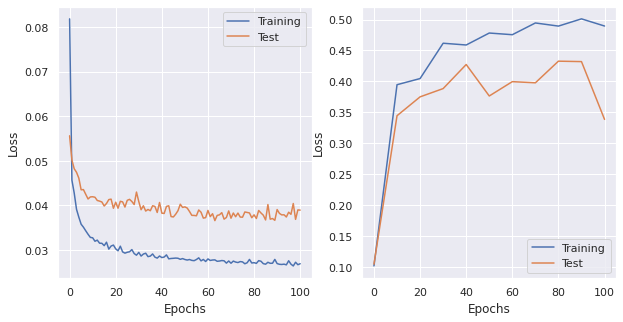

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0979. Test R^2: 0.1544. Loss Train: 0.0804. Loss Val: 0.0542. Time: 7.2673
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3851. Test R^2: 0.3215. Loss Train: 0.0324. Loss Val: 0.0413. Time: 7.3676
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4307. Test R^2: 0.3132. Loss Train: 0.0301. Loss Val: 0.0401. Time: 7.2807
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4605. Test R^2: 0.3915. Loss Train: 0.0288. Loss Val: 0.0396. Time: 7.0060
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4487. Test R^2: 0.3847. Loss Train: 0.0283. Loss Val: 0.0406. Time: 7.3717
 EPOCH 

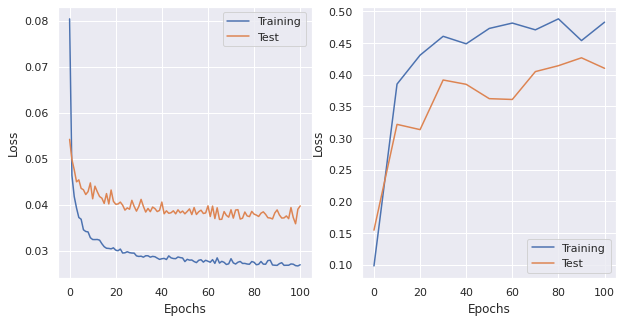

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0872. Test R^2: 0.1444. Loss Train: 0.0827. Loss Val: 0.0546. Time: 7.3094
 EPOCH 10. Pr

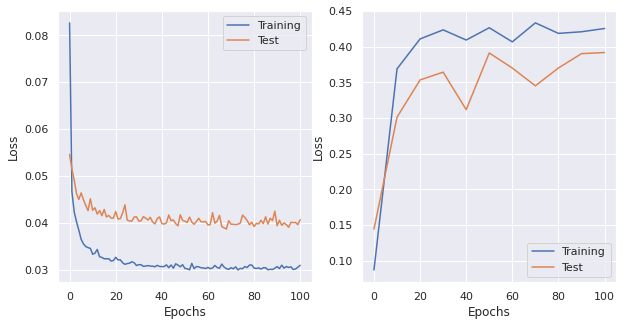

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1071. Test R^2: 0.1375. Loss Train: 0.0845. Loss Val: 0.0547. Time: 7.4048
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3662. Test R^2: 0.3506. Loss Train: 0.0340. Loss Val: 0.0425. Time: 7.4419
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4114. Test R^2: 0.3357. Loss Train: 0.0322. Loss Val: 0.0404. Time: 7.2937
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4048. Test R^2: 0.3585. Loss Train: 0.0313. Loss Val: 0.0413. Time: 7.3318
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4264. Test R^2: 0.3621. Loss Train: 0.0306. Loss Val: 0.0401. Time: 7.5006

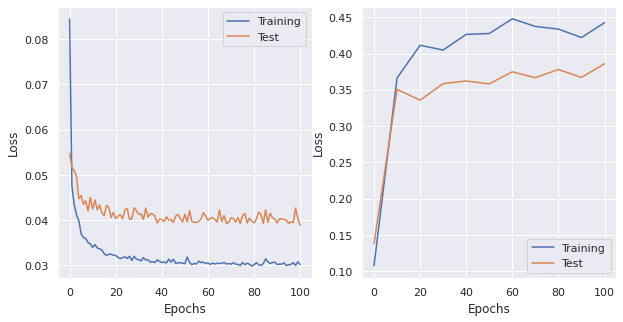

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1263. Test R^2: 0.1600. Loss Train: 0.0841. Loss Val: 0.0566. Time: 7.2936
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3981. Test R^2: 0.3182. Loss Train: 0.0335. Loss Val: 0.0428. Time: 7.6109
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.3980. Test R^2: 0.3657. Loss Train: 0.0325. Loss Val: 0.0401. Time: 7.4103
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4250. Test R^2: 0.3777. Loss Train: 0.0312. Loss Val: 0.0403. Time: 7.3662
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4425. Test R^2: 0.3871. Loss Train: 0.0307. Loss Val: 0.0394. Time: 7.

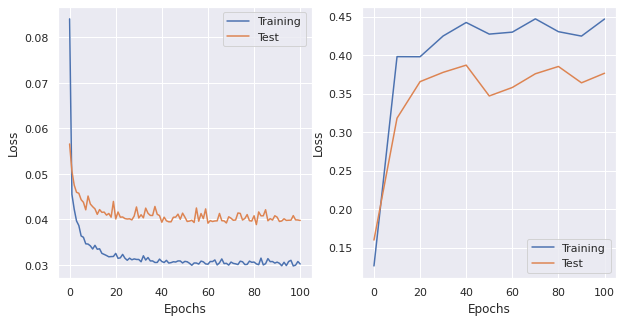

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1228. Test R^2: 0.1846. Loss Train: 0.0825. Loss Val: 0.0537. Time: 7.2795
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3642. Test R^2: 0.3477. Loss Train: 0.0333. Loss Val: 0.0437. Time: 7.3725
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4045. Test R^2: 0.3499. Loss Train: 0.0315. Loss Val: 0.0409. Time: 7.2805
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.3985. Test R^2: 0.3461. Loss Train: 0.0308. Loss Val: 0.0413. Time: 7.5995
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4423. Test R^2: 0.3296. Loss Train: 0.0305. Loss Val: 0.0417. Time:

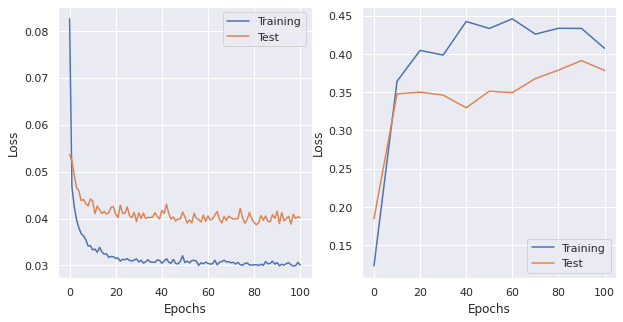

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1099. Test R^2: 0.1160. Loss Train: 0.0819. Loss Val: 0.0554. Time: 7.6292
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3638. Test R^2: 0.3223. Loss Train: 0.0337. Loss Val: 0.0437. Time: 7.7190
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4117. Test R^2: 0.3419. Loss Train: 0.0314. Loss Val: 0.0434. Time: 7.7173
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4243. Test R^2: 0.3724. Loss Train: 0.0313. Loss Val: 0.0413. Time: 7.3278
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4006. Test R^2: 0.3695. Loss Train: 0.0304. Loss Val: 0.0403. Time: 8.0202
 

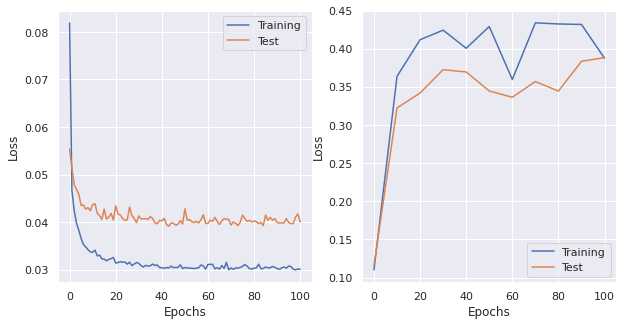

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0940. Test R^2: 0.1472. Loss Train: 0.0823. Loss Val: 0.0550. Time: 7.2569
 EP

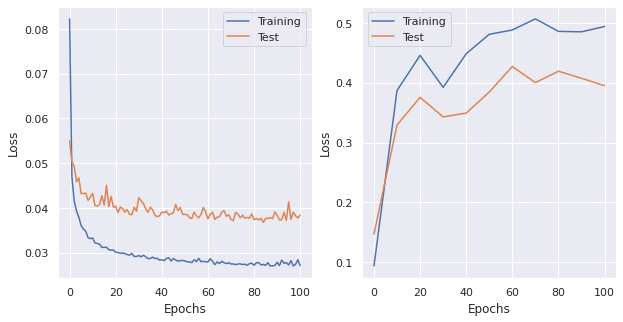

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0941. Test R^2: 0.1209. Loss Train: 0.0842. Loss Val: 0.0550. Time: 7.5348
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4051. Test R^2: 0.3380. Loss Train: 0.0329. Loss Val: 0.0425. Time: 7.3658
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4331. Test R^2: 0.3593. Loss Train: 0.0307. Loss Val: 0.0418. Time: 7.3144
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4399. Test R^2: 0.3953. Loss Train: 0.0300. Loss Val: 0.0389. Time: 7.5749
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4350. Test R^2: 0.4065. Loss Train: 0.0289. Loss Val: 0.0387. Time: 7.2

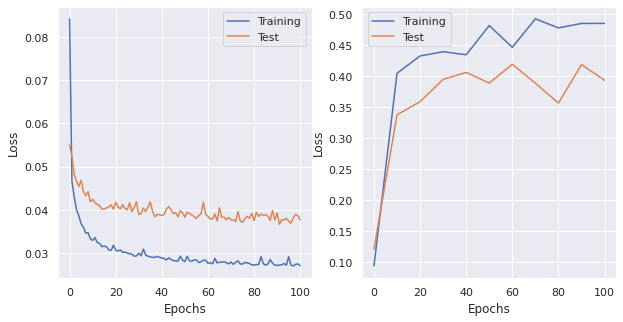

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1172. Test R^2: 0.1598. Loss Train: 0.0809. Loss Val: 0.0549. Time: 7.0937
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3948. Test R^2: 0.3420. Loss Train: 0.0327. Loss Val: 0.0423. Time: 7.6448
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4182. Test R^2: 0.3425. Loss Train: 0.0320. Loss Val: 0.0401. Time: 7.6289
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4652. Test R^2: 0.3317. Loss Train: 0.0295. Loss Val: 0.0411. Time: 7.3763
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4587. Test R^2: 0.3403. Loss Train: 0.0283. Loss Val: 0.0394. Time:

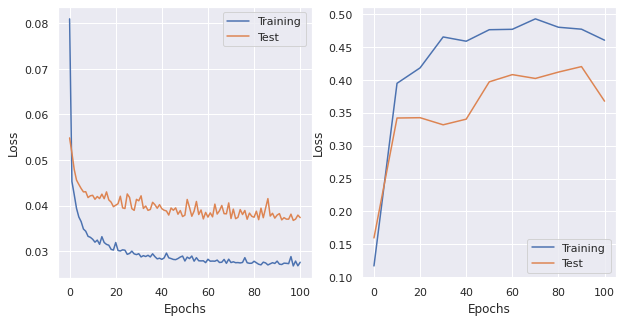

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0769. Test R^2: 0.1815. Loss Train: 0.0823. Loss Val: 0.0548. Time: 7.3326
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3955. Test R^2: 0.3394. Loss Train: 0.0335. Loss Val: 0.0422. Time: 7.4134
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4324. Test R^2: 0.3639. Loss Train: 0.0302. Loss Val: 0.0398. Time: 7.3431
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4467. Test R^2: 0.3270. Loss Train: 0.0290. Loss Val: 0.0391. Time: 7.4292
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4550. Test R^2: 0.3865. Loss Train: 0.0286. Loss Val: 0.0390. Ti

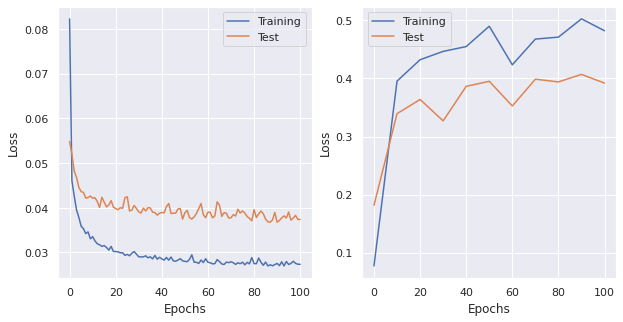

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0950. Test R^2: 0.1356. Loss Train: 0.0829. Loss Val: 0.0535. Time: 7.7392
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3935. Test R^2: 0.3350. Loss Train: 0.0323. Loss Val: 0.0420. Time: 7.2564
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4507. Test R^2: 0.3896. Loss Train: 0.0310. Loss Val: 0.0411. Time: 7.4484
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4563. Test R^2: 0.3639. Loss Train: 0.0296. Loss Val: 0.0399. Time: 7.3882
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4684. Test R^2: 0.3258. Loss Train: 0.0287. Loss Val: 0.0390. Time: 7.655

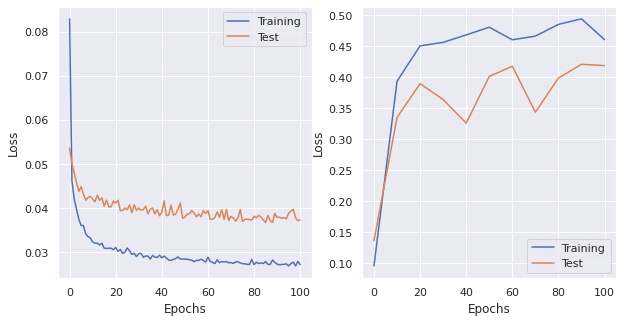

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0856. Test R^2: 0.1764. Loss Train: 0.0826. Loss Val: 0.0543. Time: 7.30

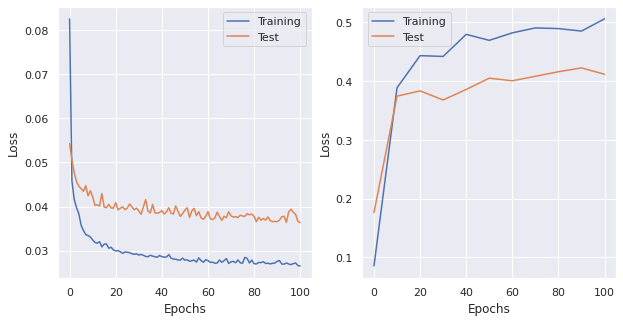

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0993. Test R^2: 0.1252. Loss Train: 0.0849. Loss Val: 0.0542. Time: 7.5801
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3877. Test R^2: 0.3519. Loss Train: 0.0328. Loss Val: 0.0423. Time: 7.4023
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4328. Test R^2: 0.3768. Loss Train: 0.0303. Loss Val: 0.0400. Time: 7.4700
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4318. Test R^2: 0.3613. Loss Train: 0.0291. Loss Val: 0.0392. Time: 7.5404
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4573. Test R^2: 0.3407. Loss Train: 0.0285. Loss Val: 0.0391. Time: 

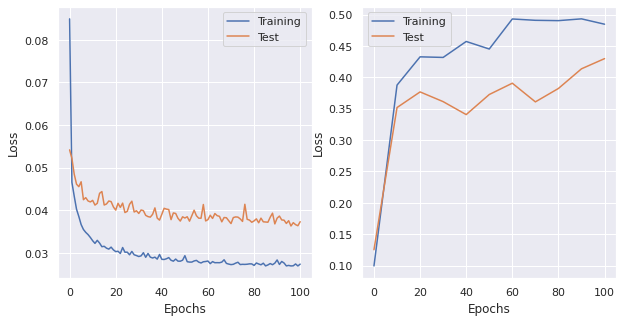

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1021. Test R^2: 0.1560. Loss Train: 0.0825. Loss Val: 0.0546. Time: 7.4198
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.4067. Test R^2: 0.3392. Loss Train: 0.0328. Loss Val: 0.0416. Time: 7.1445
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4435. Test R^2: 0.3529. Loss Train: 0.0300. Loss Val: 0.0406. Time: 7.1335
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4538. Test R^2: 0.3711. Loss Train: 0.0294. Loss Val: 0.0392. Time: 7.3006
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4701. Test R^2: 0.3545. Loss Train: 0.0282. Loss Val: 0.0387. Ti

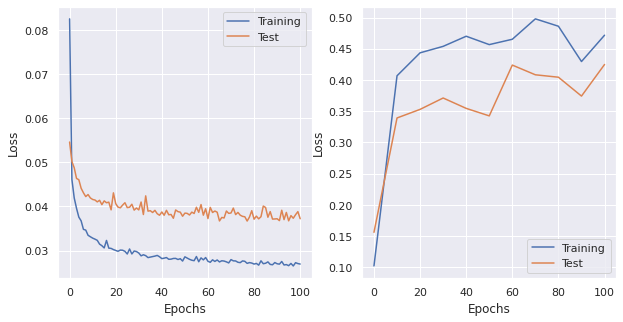

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.01
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1108. Test R^2: 0.1529. Loss Train: 0.0820. Loss Val: 0.0564. Time: 7.3441
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3680. Test R^2: 0.3064. Loss Train: 0.0326. Loss Val: 0.0436. Time: 7.2991
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4322. Test R^2: 0.3761. Loss Train: 0.0300. Loss Val: 0.0408. Time: 7.3095
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4677. Test R^2: 0.3734. Loss Train: 0.0293. Loss Val: 0.0393. Time: 7.5495
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4769. Test R^2: 0.3767. Loss Train: 0.0293. Loss Val: 0.0376.

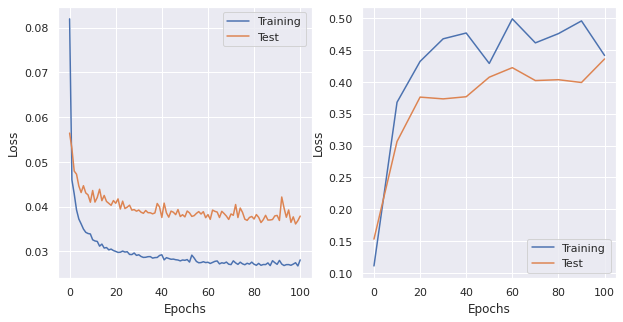

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.001
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0922. Test R^2: 0.1115. Loss Train: 0.0805. Loss Val: 0.0553. Time: 7.8488
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.3949. Test R^2: 0.3588. Loss Train: 0.0328. Loss Val: 0.0421. Time: 7.5222
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.4212. Test R^2: 0.3822. Loss Train: 0.0300. Loss Val: 0.0402. Time: 7.3607
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.4607. Test R^2: 0.3889. Loss Train: 0.0298. Loss Val: 0.0404. Time: 7.6657
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.4652. Test R^2: 0.3904. Loss Train: 0.0287. Loss Val: 0.0377. Time: 7.

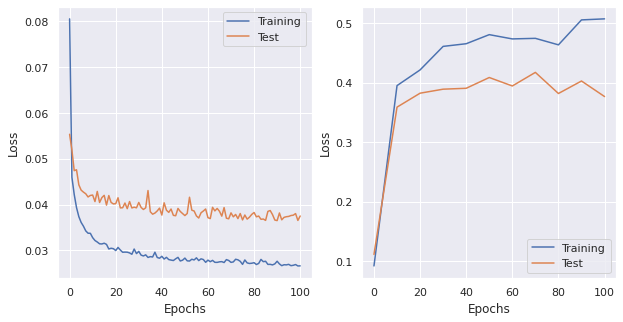

saving  ./plots/LogisticReg_lr0.01_momentum0.001_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.01, momentum: 0.001, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0014. Test R^2: -1.3711. Loss Train: 0.2343. Loss Val: 0.1461. Time: 7.6503
 EPOC

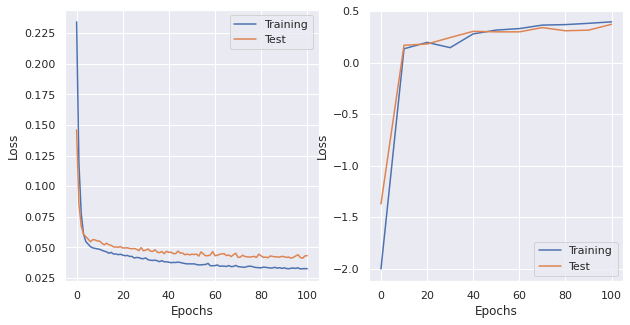

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9567. Test R^2: -1.3600. Loss Train: 0.2322. Loss Val: 0.1433. Time: 7.8623
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1269. Test R^2: 0.1536. Loss Train: 0.0484. Loss Val: 0.0529. Time: 7.3509
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1915. Test R^2: 0.1970. Loss Train: 0.0436. Loss Val: 0.0494. Time: 7.3558
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2656. Test R^2: 0.2650. Loss Train: 0.0399. Loss Val: 0.0470. Time: 7.5445
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2934. Test R^2: 0.3073. Loss Train: 0.0377. Loss Val: 0.0466. Time: 7.1990
 EPOCH 50. P

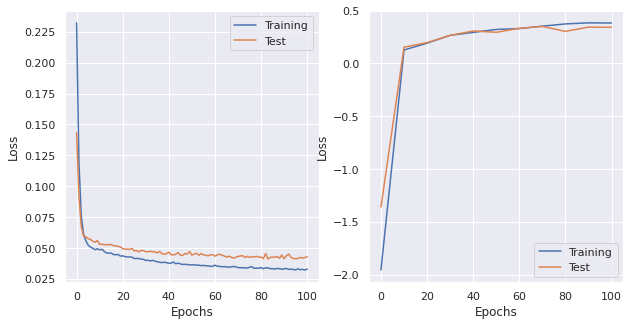

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9358. Test R^2: -1.3260. Loss Train: 0.2321. Loss Val: 0.1451. Time: 7.4155
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1176. Test R^2: 0.1383. Loss Train: 0.0487. Loss Val: 0.0555. Time: 7.3661
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2096. Test R^2: 0.2232. Loss Train: 0.0438. Loss Val: 0.0518. Time: 7.7323
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2739. Test R^2: 0.2572. Loss Train: 0.0403. Loss Val: 0.0467. Time: 7.4444
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3014. Test R^2: 0.2832. Loss Train: 0.0378. Loss Val: 0.0457. Time: 7.7845
 EPOCH 5

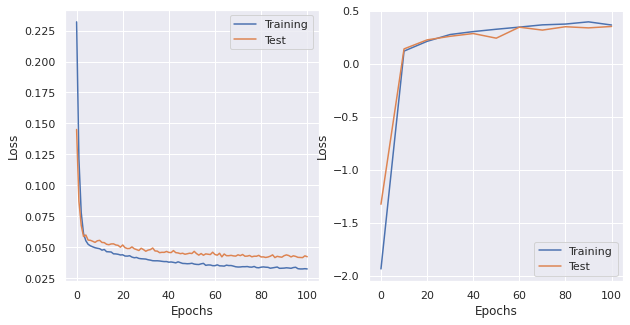

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8964. Test R^2: -1.2726. Loss Train: 0.2327. Loss Val: 0.1461. Time: 7.6415
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1150. Test R^2: 0.1556. Loss Train: 0.0487. Loss Val: 0.0549. Time: 7.0800
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1799. Test R^2: 0.2297. Loss Train: 0.0433. Loss Val: 0.0500. Time: 7.4651
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2411. Test R^2: 0.2385. Loss Train: 0.0403. Loss Val: 0.0463. Time: 7.6538
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2922. Test R^2: 0.3004. Loss Train: 0.0379. Loss Val: 0.0456. Time: 7.3166
 EPOC

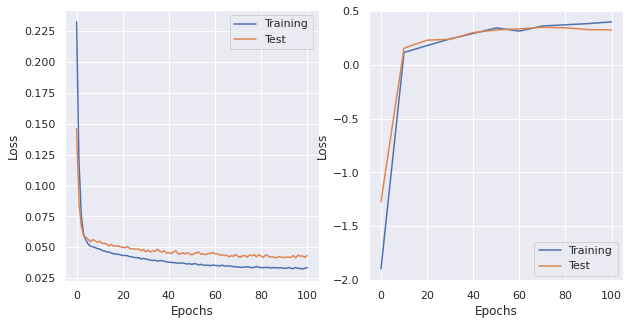

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epoc

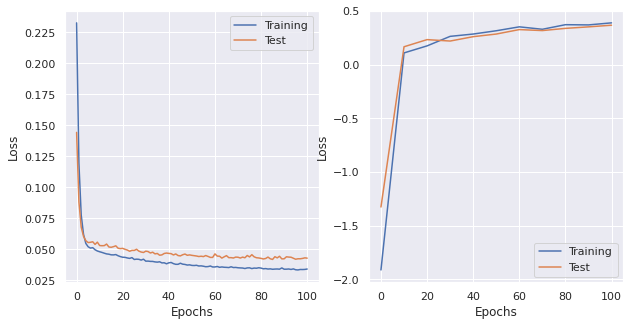

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9496. Test R^2: -1.5689. Loss Train: 0.2335. Loss Val: 0.1467. Time: 7.5363
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1284. Test R^2: 0.1685. Loss Train: 0.0479. Loss Val: 0.0538. Time: 7.5793
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1905. Test R^2: 0.2314. Loss Train: 0.0437. Loss Val: 0.0512. Time: 7.3354
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2568. Test R^2: 0.2731. Loss Train: 0.0414. Loss Val: 0.0491. Time: 7.6643
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2749. Test R^2: 0.2754. Loss Train: 0.0388. Loss Val: 0.0464. Time: 7.1314
 EPOCH

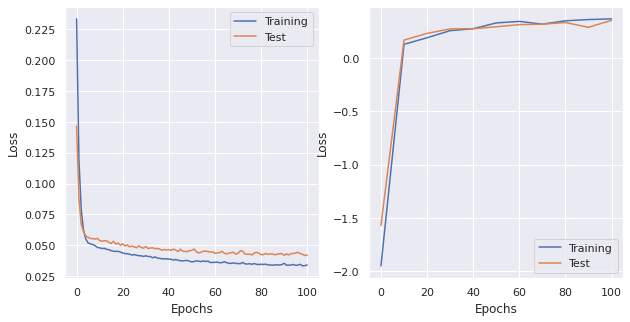

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9689. Test R^2: -1.4949. Loss Train: 0.2326. Loss Val: 0.1473. Time: 7.4299
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1037. Test R^2: 0.1774. Loss Train: 0.0479. Loss Val: 0.0536. Time: 7.2246
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1734. Test R^2: 0.2181. Loss Train: 0.0441. Loss Val: 0.0497. Time: 7.4395
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2565. Test R^2: 0.2524. Loss Train: 0.0410. Loss Val: 0.0477. Time: 7.3555
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2777. Test R^2: 0.2607. Loss Train: 0.0391. Loss Val: 0.0450. Time: 7.2734
 E

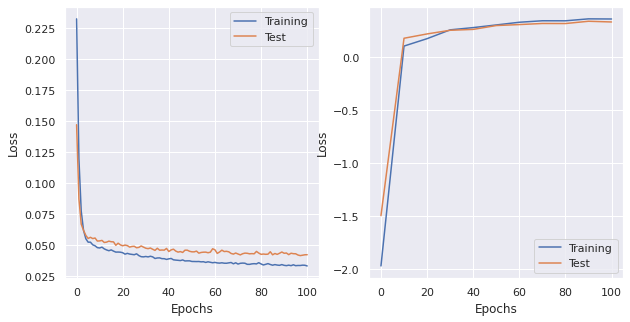

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9184. Test R^2: -1.2371. Loss Train: 0.2352. Loss Val: 0.1454. Time: 7.3713
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1049. Test R^2: 0.1656. Loss Train: 0.0479. Loss Val: 0.0529. Time: 7.4463
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1794. Test R^2: 0.2378. Loss Train: 0.0434. Loss Val: 0.0507. Time: 7.5910
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2672. Test R^2: 0.2678. Loss Train: 0.0408. Loss Val: 0.0481. Time: 7.3538
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2769. Test R^2: 0.2597. Loss Train: 0.0397. Loss Val: 0.0461. Time: 7.4921

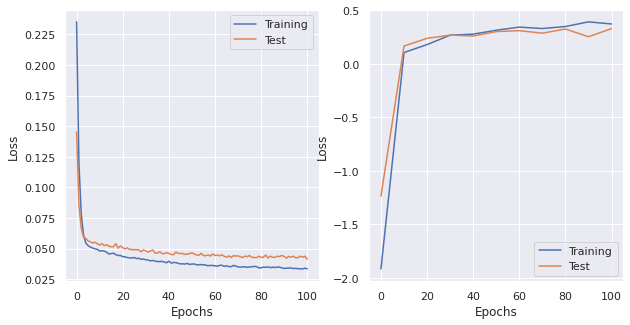

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.01


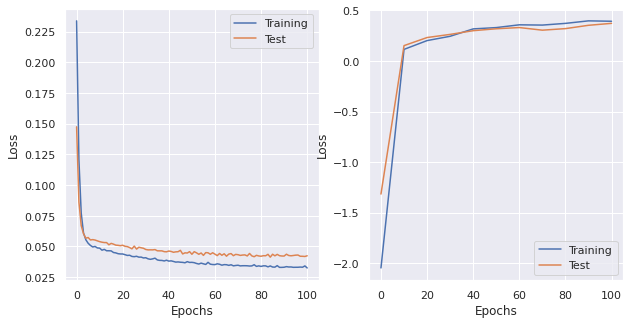

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0509. Test R^2: -1.4705. Loss Train: 0.2330. Loss Val: 0.1450. Time: 7.4104
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1175. Test R^2: 0.1469. Loss Train: 0.0484. Loss Val: 0.0542. Time: 7.4326
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2061. Test R^2: 0.2068. Loss Train: 0.0435. Loss Val: 0.0499. Time: 7.4596
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2407. Test R^2: 0.2857. Loss Train: 0.0402. Loss Val: 0.0471. Time: 7.6410
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2876. Test R^2: 0.2533. Loss Train: 0.0377. Loss Val: 0.0454. Time: 7.5796
 EP

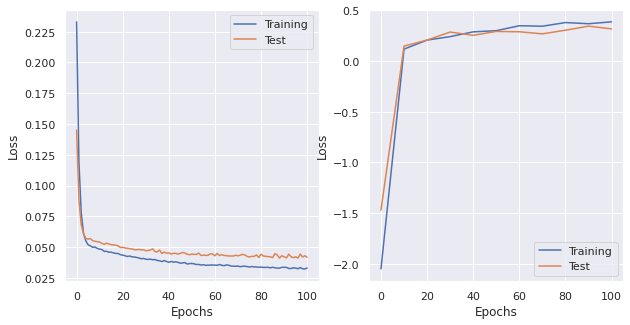

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8985. Test R^2: -1.3139. Loss Train: 0.2332. Loss Val: 0.1424. Time: 7.0175
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1184. Test R^2: 0.0824. Loss Train: 0.0484. Loss Val: 0.0536. Time: 7.7546
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1343. Test R^2: 0.2036. Loss Train: 0.0435. Loss Val: 0.0508. Time: 7.5749
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2620. Test R^2: 0.2663. Loss Train: 0.0402. Loss Val: 0.0471. Time: 7.5604
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3125. Test R^2: 0.2424. Loss Train: 0.0379. Loss Val: 0.0454. Time: 7.3771

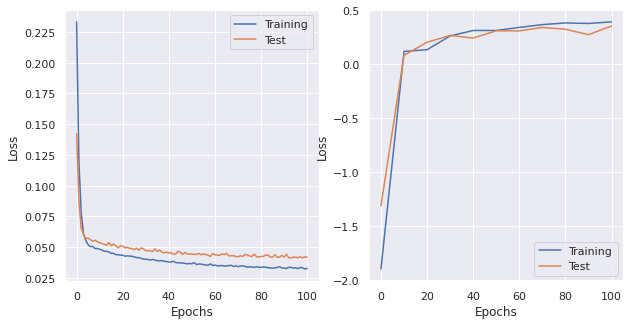

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8437. Test R^2: -1.4186. Loss Train: 0.2342. Loss Val: 0.1456. Time: 7.6095
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1225. Test R^2: 0.1632. Loss Train: 0.0486. Loss Val: 0.0543. Time: 7.2797
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2039. Test R^2: 0.2195. Loss Train: 0.0439. Loss Val: 0.0511. Time: 7.6227
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2600. Test R^2: 0.2608. Loss Train: 0.0401. Loss Val: 0.0465. Time: 7.4152
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2898. Test R^2: 0.2994. Loss Train: 0.0387. Loss Val: 0.0461. Time: 7.4

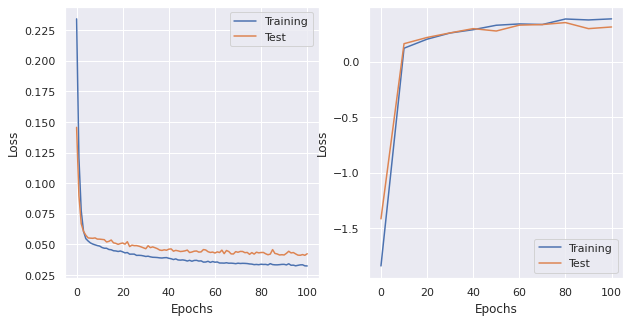

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay:

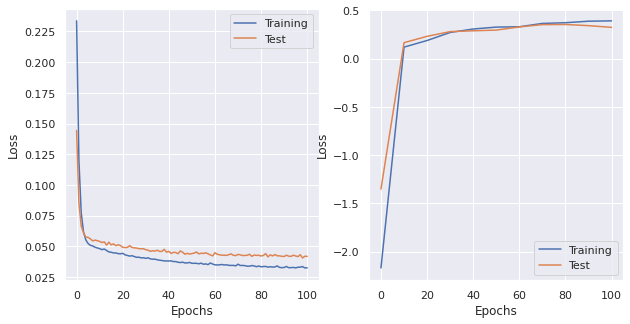

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8774. Test R^2: -1.3918. Loss Train: 0.2336. Loss Val: 0.1461. Time: 7.4619
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1049. Test R^2: 0.1666. Loss Train: 0.0484. Loss Val: 0.0546. Time: 7.3726
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1968. Test R^2: 0.2134. Loss Train: 0.0440. Loss Val: 0.0507. Time: 7.6344
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2659. Test R^2: 0.2582. Loss Train: 0.0398. Loss Val: 0.0468. Time: 7.4582
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2992. Test R^2: 0.2441. Loss Train: 0.0385. Loss Val: 0.0449. Time: 7.5246


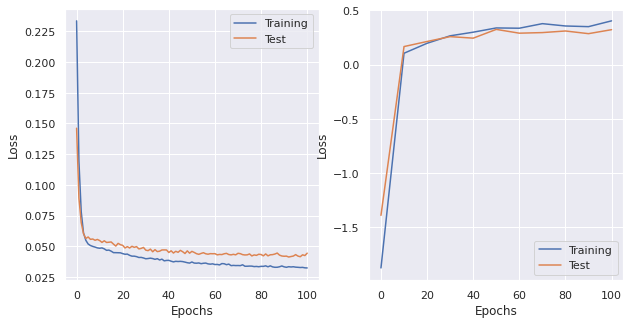

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0079. Test R^2: -1.3211. Loss Train: 0.2352. Loss Val: 0.1433. Time: 7.4683
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1235. Test R^2: 0.0498. Loss Train: 0.0485. Loss Val: 0.0545. Time: 7.6758
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2082. Test R^2: 0.2035. Loss Train: 0.0435. Loss Val: 0.0509. Time: 7.5203
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2682. Test R^2: 0.2463. Loss Train: 0.0402. Loss Val: 0.0481. Time: 7.4324
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3077. Test R^2: 0.2904. Loss Train: 0.0382. Loss Val: 0.0464. Time: 7.7

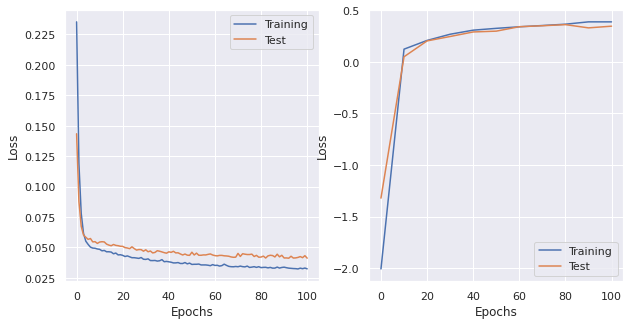

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9626. Test R^2: -1.2513. Loss Train: 0.2352. Loss Val: 0.1470. Time: 7.1655
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1232. Test R^2: 0.1775. Loss Train: 0.0484. Loss Val: 0.0551. Time: 7.2924
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1958. Test R^2: 0.2249. Loss Train: 0.0432. Loss Val: 0.0496. Time: 7.5027
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2415. Test R^2: 0.2650. Loss Train: 0.0397. Loss Val: 0.0470. Time: 7.4145
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2845. Test R^2: 0.2913. Loss Train: 0.0376. Loss Val: 0.0452. Time: 

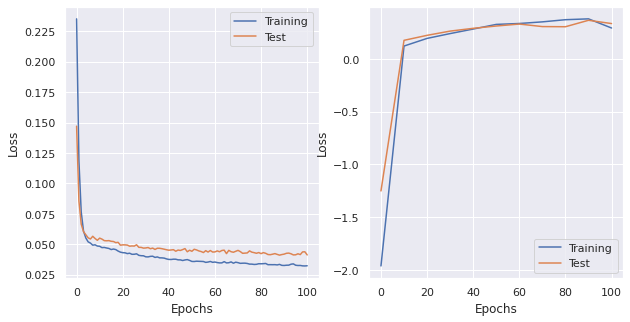

saving  ./plots/LogisticReg_lr0.001_momentum0_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_d

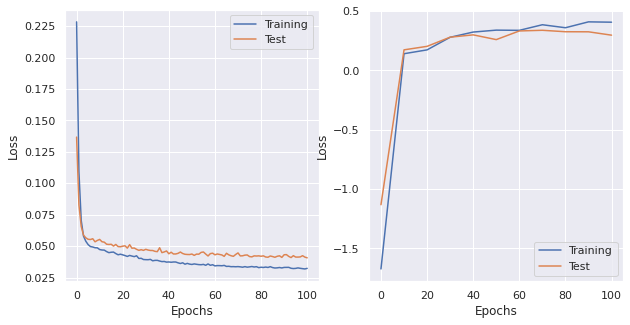

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9871. Test R^2: -1.3547. Loss Train: 0.2317. Loss Val: 0.1449. Time: 7.2402
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1201. Test R^2: 0.1489. Loss Train: 0.0486. Loss Val: 0.0551. Time: 7.8747
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1824. Test R^2: 0.2325. Loss Train: 0.0431. Loss Val: 0.0516. Time: 7.4874
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2580. Test R^2: 0.2617. Loss Train: 0.0404. Loss Val: 0.0477. Time: 7.5536
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2845. Test R^2: 0.3000. Loss Train: 0.0382. Loss Val: 0.0470. Time: 7.4189
 EPOCH

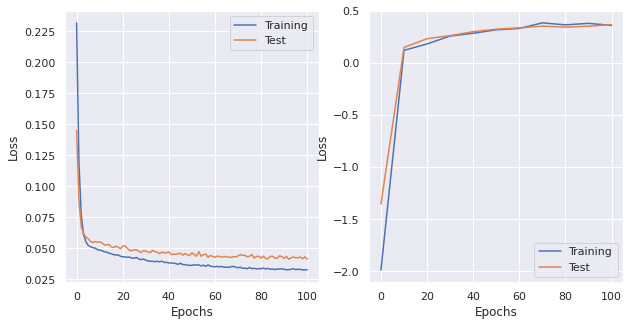

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8491. Test R^2: -1.0990. Loss Train: 0.2276. Loss Val: 0.1348. Time: 7.3346
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1225. Test R^2: 0.1608. Loss Train: 0.0480. Loss Val: 0.0529. Time: 7.2581
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2177. Test R^2: 0.1899. Loss Train: 0.0423. Loss Val: 0.0497. Time: 7.6700
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2709. Test R^2: 0.2231. Loss Train: 0.0400. Loss Val: 0.0485. Time: 7.3837
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2946. Test R^2: 0.2959. Loss Train: 0.0375. Loss Val: 0.0446. Time: 7.6426
 E

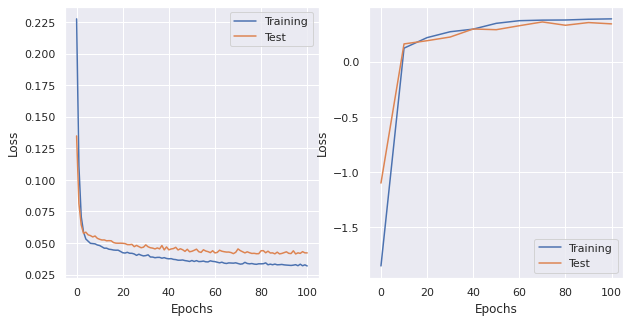

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.7804. Test R^2: -1.0868. Loss Train: 0.2269. Loss Val: 0.1315. Time: 7.6355
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1454. Test R^2: 0.1420. Loss Train: 0.0471. Loss Val: 0.0538. Time: 7.3001
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2211. Test R^2: 0.1947. Loss Train: 0.0436. Loss Val: 0.0485. Time: 7.6651
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2691. Test R^2: 0.2261. Loss Train: 0.0392. Loss Val: 0.0483. Time: 7.3424
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3093. Test R^2: 0.2891. Loss Train: 0.0371. Loss Val: 0.0439. Time: 7.7514

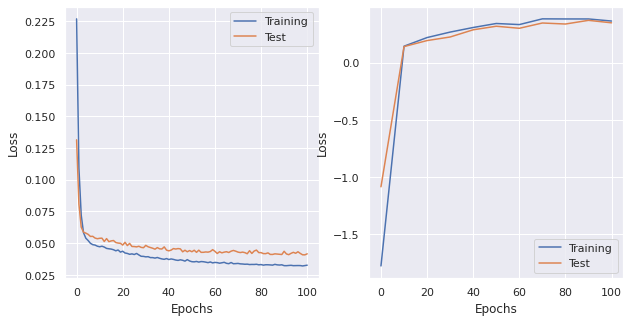

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8518. Test R^2: -1.1059. Loss Train: 0.2248. Loss Val: 0.1384. Time: 7.2813
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1121. Test R^2: 0.0643. Loss Train: 0.0472. Loss Val: 0.0540. Time: 7.4171
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2177. Test R^2: 0.2390. Loss Train: 0.0430. Loss Val: 0.0507. Time: 7.3972
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2676. Test R^2: 0.2987. Loss Train: 0.0397. Loss Val: 0.0470. Time: 7.5833
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2940. Test R^2: 0.3171. Loss Train: 0.0372. Loss Val: 0.0436. Time: 7.6694
 EPOCH 5

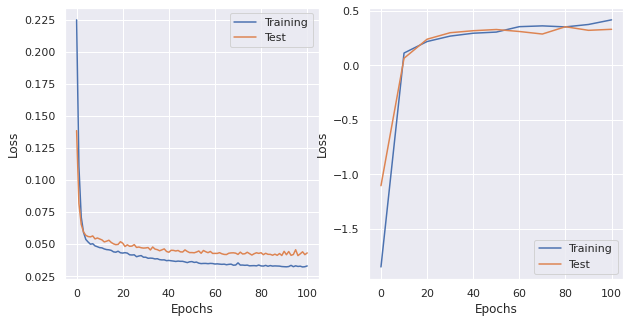

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.7460. Test R^2: -1.1900. Loss Train: 0.2257. Loss Val: 0.1347. Time: 7.2605
 EPOCH 10. Progre

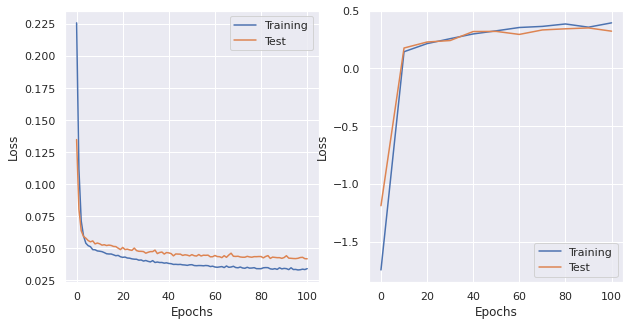

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8462. Test R^2: -1.2231. Loss Train: 0.2376. Loss Val: 0.1431. Time: 7.3946
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1171. Test R^2: 0.1327. Loss Train: 0.0488. Loss Val: 0.0548. Time: 7.3988
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1878. Test R^2: 0.1993. Loss Train: 0.0438. Loss Val: 0.0511. Time: 7.5088
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2552. Test R^2: 0.2629. Loss Train: 0.0409. Loss Val: 0.0473. Time: 7.5583
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2789. Test R^2: 0.2914. Loss Train: 0.0384. Loss Val: 0.0459. Time: 7.2446


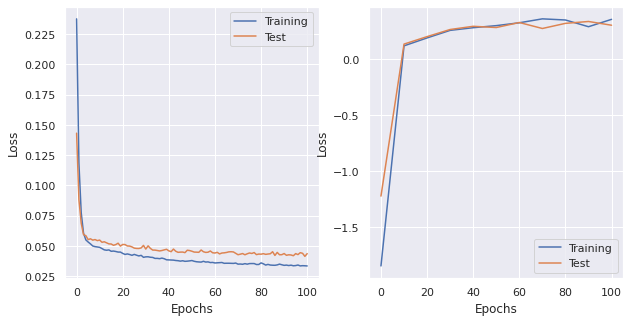

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8020. Test R^2: -1.6227. Loss Train: 0.2308. Loss Val: 0.1339. Time: 7.3287
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1157. Test R^2: 0.1281. Loss Train: 0.0482. Loss Val: 0.0532. Time: 7.5072
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1990. Test R^2: 0.2362. Loss Train: 0.0433. Loss Val: 0.0502. Time: 7.5697
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2660. Test R^2: 0.2377. Loss Train: 0.0395. Loss Val: 0.0466. Time: 7.5390
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2967. Test R^2: 0.2821. Loss Train: 0.0381. Loss Val: 0.0449. Time: 7.6

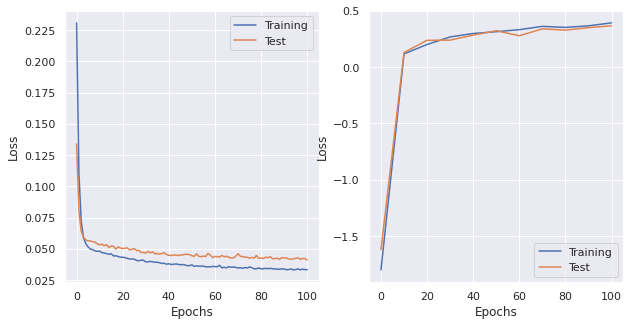

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9684. Test R^2: -1.4359. Loss Train: 0.2270. Loss Val: 0.1363. Time: 7.5205
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1433. Test R^2: 0.1012. Loss Train: 0.0480. Loss Val: 0.0546. Time: 7.2739
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2113. Test R^2: 0.2033. Loss Train: 0.0429. Loss Val: 0.0499. Time: 7.4589
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2378. Test R^2: 0.2667. Loss Train: 0.0400. Loss Val: 0.0472. Time: 7.3439
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2847. Test R^2: 0.2872. Loss Train: 0.0384. Loss Val: 0.0448. Time: 

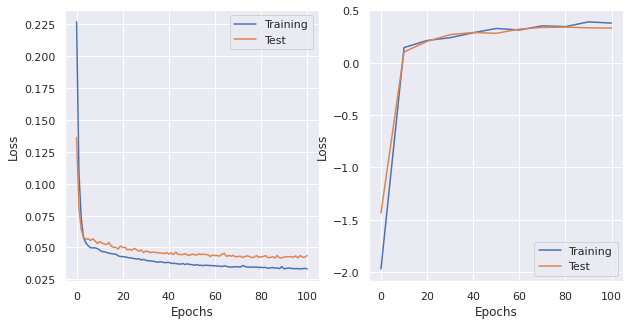

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.7393. Test R^2: -1.2564. Loss Train: 0.2260. Loss Val: 0.1346. Time: 7.2891
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1248. Test R^2: 0.1667. Loss Train: 0.0475. Loss Val: 0.0533. Time: 7.7691
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2022. Test R^2: 0.2315. Loss Train: 0.0429. Loss Val: 0.0496. Time: 7.2893
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2622. Test R^2: 0.2283. Loss Train: 0.0399. Loss Val: 0.0465. Time: 7.5838
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3142. Test R^2: 0.2766. Loss Train: 0.0379. Loss Val: 0.0472. Time: 7.5894
 E

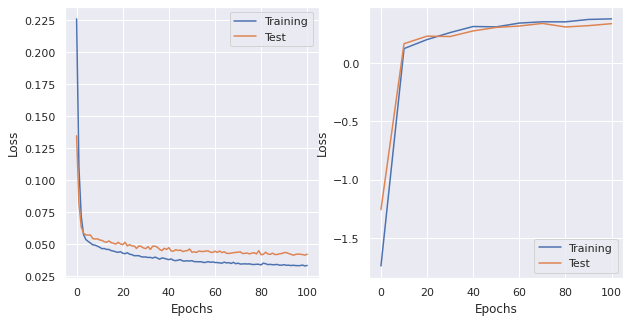

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.7720. Test R^2: -1.2731. Loss Train: 0.2265. Loss Val: 0.1363. Time: 7.2298
 EPOCH 

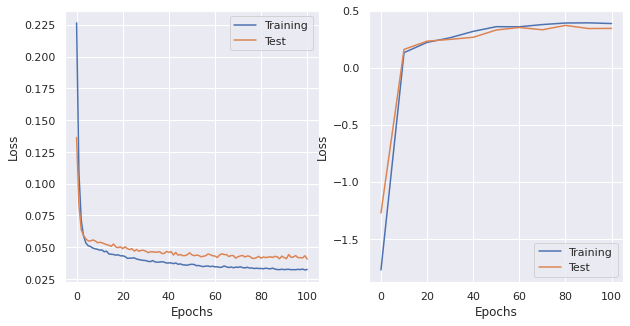

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1430. Test R^2: -1.4710. Loss Train: 0.2331. Loss Val: 0.1468. Time: 7.4736
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1210. Test R^2: 0.1545. Loss Train: 0.0482. Loss Val: 0.0541. Time: 7.5712
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1953. Test R^2: 0.2305. Loss Train: 0.0432. Loss Val: 0.0505. Time: 7.4093
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2373. Test R^2: 0.2538. Loss Train: 0.0413. Loss Val: 0.0462. Time: 7.6298
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3018. Test R^2: 0.2900. Loss Train: 0.0383. Loss Val: 0.0466. Time: 7.38

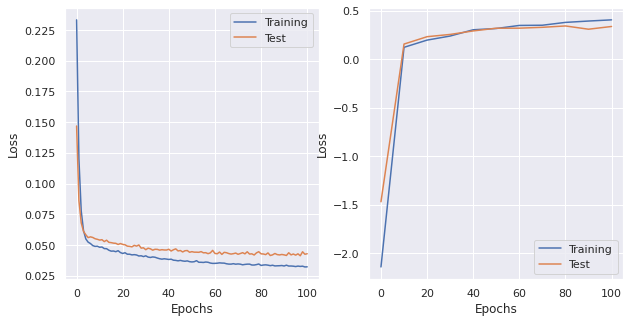

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9311. Test R^2: -1.1977. Loss Train: 0.2254. Loss Val: 0.1378. Time: 7.0010
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1421. Test R^2: 0.1395. Loss Train: 0.0478. Loss Val: 0.0539. Time: 7.3249
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2051. Test R^2: 0.2459. Loss Train: 0.0439. Loss Val: 0.0497. Time: 7.5056
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2593. Test R^2: 0.2240. Loss Train: 0.0397. Loss Val: 0.0472. Time: 7.5662
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3142. Test R^2: 0.3006. Loss Train: 0.0376. Loss Val: 0.0456. Time: 

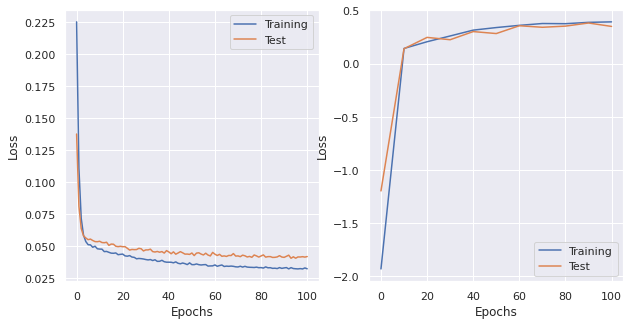

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.7380. Test R^2: -1.1077. Loss Train: 0.2275. Loss Val: 0.1368. Time: 7.6960
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1064. Test R^2: 0.1785. Loss Train: 0.0479. Loss Val: 0.0525. Time: 7.3958
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2032. Test R^2: 0.2330. Loss Train: 0.0423. Loss Val: 0.0508. Time: 7.2211
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2676. Test R^2: 0.2681. Loss Train: 0.0392. Loss Val: 0.0469. Time: 7.6983
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3094. Test R^2: 0.3004. Loss Train: 0.0384. Loss Val: 0.0442. Tim

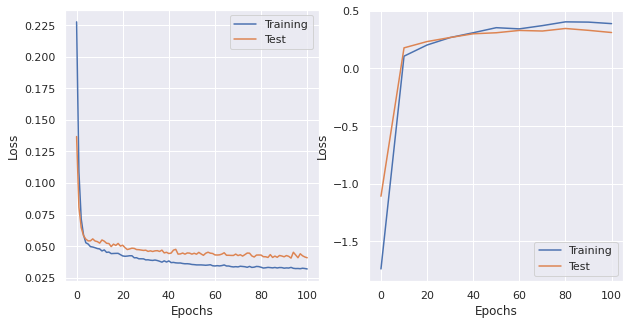

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.6661. Test R^2: -1.1754. Loss Train: 0.2264. Loss Val: 0.1360. Time: 7.4566
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.0909. Test R^2: 0.1602. Loss Train: 0.0472. Loss Val: 0.0530. Time: 7.5347
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2156. Test R^2: 0.2049. Loss Train: 0.0425. Loss Val: 0.0491. Time: 7.5541
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2736. Test R^2: 0.2725. Loss Train: 0.0400. Loss Val: 0.0469. Time: 7.4626
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2994. Test R^2: 0.2893. Loss Train: 0.0375. Loss Val: 0.0454. Time: 7.4911

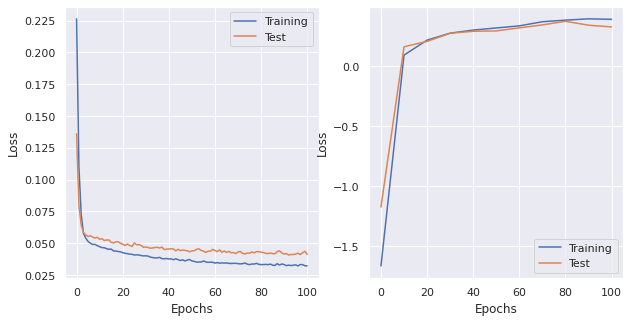

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.6986. Test R^2: -1.1039. Loss Train: 0.2261. Loss Val: 0.1330. Time: 7.2742
 

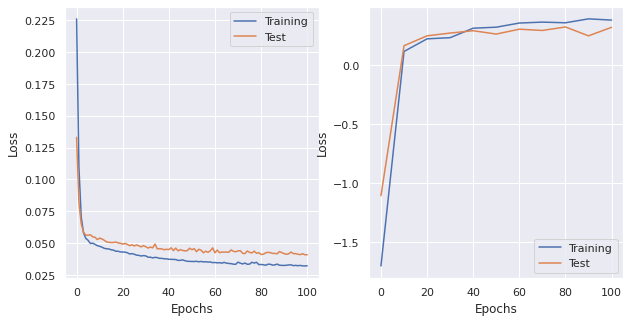

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1180. Test R^2: -1.3709. Loss Train: 0.2334. Loss Val: 0.1455. Time: 7.4193
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1258. Test R^2: 0.1719. Loss Train: 0.0485. Loss Val: 0.0549. Time: 7.4435
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1799. Test R^2: 0.2282. Loss Train: 0.0431. Loss Val: 0.0498. Time: 7.7561
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2595. Test R^2: 0.2496. Loss Train: 0.0400. Loss Val: 0.0482. Time: 7.5640
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2760. Test R^2: 0.2771. Loss Train: 0.0377. Loss Val: 0.0448. Time: 7

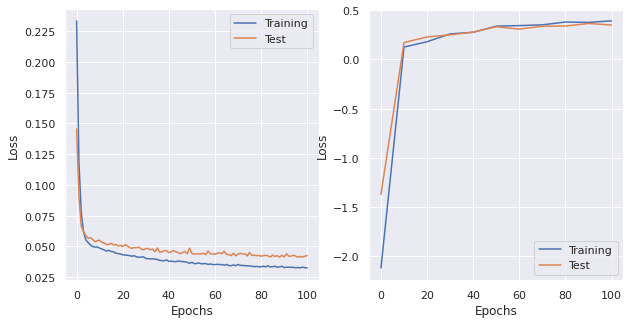

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.8735. Test R^2: -1.1490. Loss Train: 0.2269. Loss Val: 0.1333. Time: 7.4282
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1161. Test R^2: 0.1647. Loss Train: 0.0472. Loss Val: 0.0542. Time: 7.5896
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2097. Test R^2: 0.2068. Loss Train: 0.0430. Loss Val: 0.0497. Time: 7.5582
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2860. Test R^2: 0.2937. Loss Train: 0.0394. Loss Val: 0.0461. Time: 7.5240
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3081. Test R^2: 0.2442. Loss Train: 0.0377. Loss Val: 0.0455. Tim

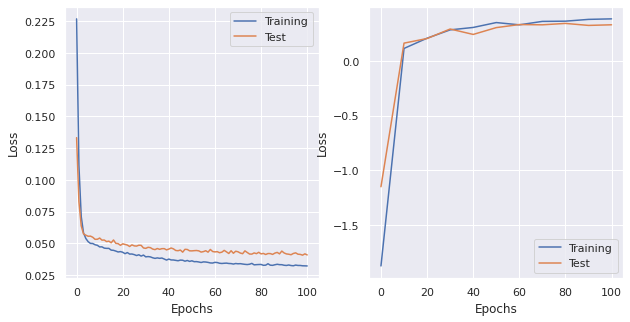

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.7796. Test R^2: -1.3081. Loss Train: 0.2250. Loss Val: 0.1344. Time: 7.5870
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.0916. Test R^2: 0.1855. Loss Train: 0.0475. Loss Val: 0.0530. Time: 7.1532
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2159. Test R^2: 0.2449. Loss Train: 0.0432. Loss Val: 0.0492. Time: 7.7271
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2813. Test R^2: 0.2752. Loss Train: 0.0393. Loss Val: 0.0471. Time: 7.4254
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3201. Test R^2: 0.2899. Loss Train: 0.0373. Loss Val: 0.0449. 

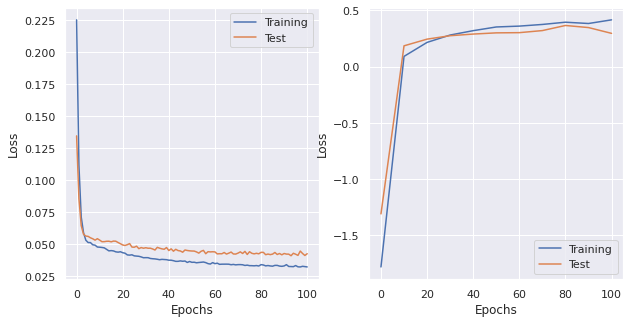

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.1
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.7505. Test R^2: -1.2612. Loss Train: 0.2264. Loss Val: 0.1336. Time: 7.2771
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1434. Test R^2: 0.1719. Loss Train: 0.0475. Loss Val: 0.0542. Time: 7.3818
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2349. Test R^2: 0.2148. Loss Train: 0.0431. Loss Val: 0.0490. Time: 7.5834
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2683. Test R^2: 0.2660. Loss Train: 0.0396. Loss Val: 0.0471. Time: 7.3670
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3216. Test R^2: 0.2648. Loss Train: 0.0371. Loss Val: 0.0445. Time: 7.7

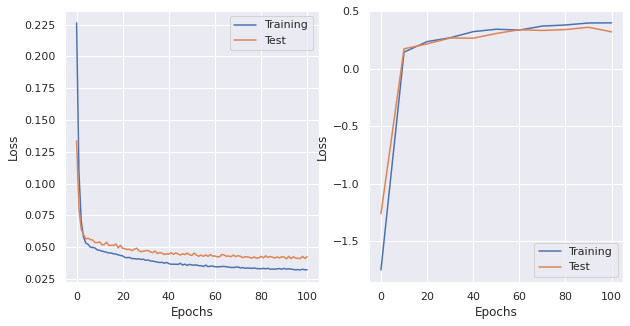

saving  ./plots/LogisticReg_lr0.001_momentum0.1_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.1, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9394. Test R^2: -1.4344. Loss Train: 0.2327. Loss Val: 0.1429. Time: 7.4445
 EP

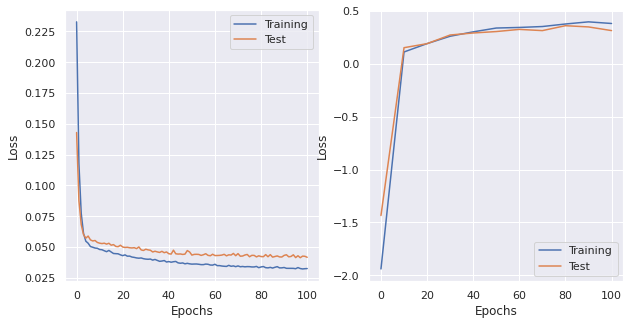

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.2519. Test R^2: -1.5613. Loss Train: 0.2407. Loss Val: 0.1533. Time: 7.3875
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.0937. Test R^2: 0.1699. Loss Train: 0.0484. Loss Val: 0.0547. Time: 7.4326
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1979. Test R^2: 0.2139. Loss Train: 0.0442. Loss Val: 0.0520. Time: 7.2803
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2491. Test R^2: 0.2577. Loss Train: 0.0416. Loss Val: 0.0482. Time: 7.6247
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2817. Test R^2: 0.2742. Loss Train: 0.0388. Loss Val: 0.0464. Time: 7.4660
 EP

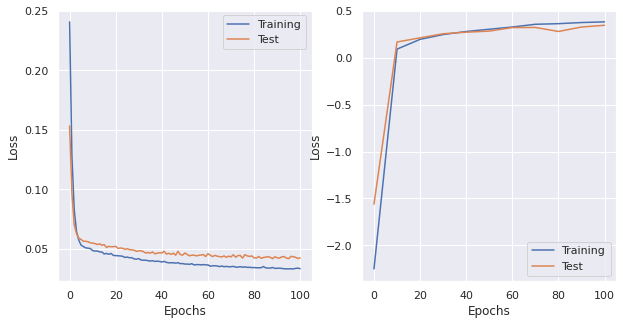

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.7087. Test R^2: -1.4024. Loss Train: 0.2346. Loss Val: 0.1454. Time: 7.5238
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1298. Test R^2: 0.1287. Loss Train: 0.0482. Loss Val: 0.0538. Time: 7.4815
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2103. Test R^2: 0.2026. Loss Train: 0.0436. Loss Val: 0.0501. Time: 7.4012
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2707. Test R^2: 0.2483. Loss Train: 0.0400. Loss Val: 0.0480. Time: 7.1321
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2944. Test R^2: 0.2505. Loss Train: 0.0388. Loss Val: 0.0448. Time: 7.3475

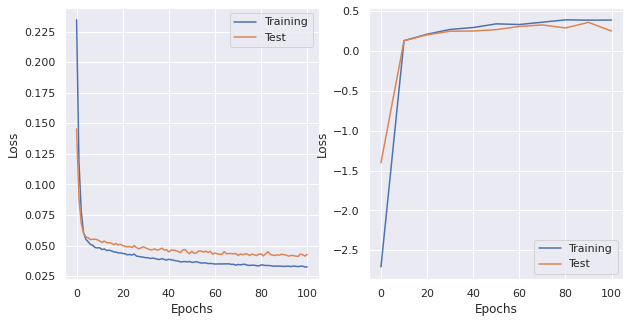

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9554. Test R^2: -1.2727. Loss Train: 0.2319. Loss Val: 0.1436. Time: 7.6618
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1330. Test R^2: 0.1435. Loss Train: 0.0478. Loss Val: 0.0535. Time: 7.5480
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2069. Test R^2: 0.2038. Loss Train: 0.0441. Loss Val: 0.0508. Time: 7.4992
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2811. Test R^2: 0.2591. Loss Train: 0.0404. Loss Val: 0.0472. Time: 7.3976
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2663. Test R^2: 0.3003. Loss Train: 0.0378. Loss Val: 0.0460. Time: 7.4

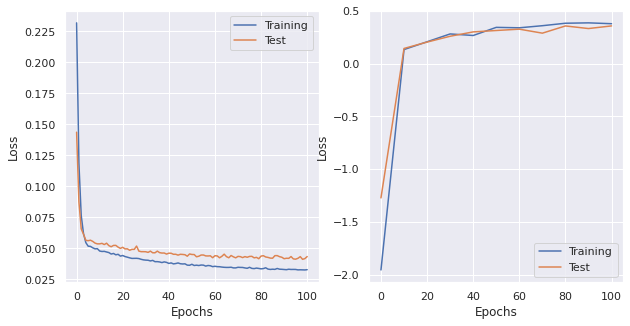

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9794. Test R^2: -1.3449. Loss Train: 0.2340. Loss Val: 0.1458. Time: 7.3057
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1017. Test R^2: 0.1758. Loss Train: 0.0478. Loss Val: 0.0551. Time: 7.3862
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1927. Test R^2: 0.2149. Loss Train: 0.0436. Loss Val: 0.0494. Time: 7.5007
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2708. Test R^2: 0.2535. Loss Train: 0.0406. Loss Val: 0.0475. Time: 7.1739
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2730. Test R^2: 0.2612. Loss Train: 0.0390. Loss Val: 0.0465. Time: 7.3501
 EPOC

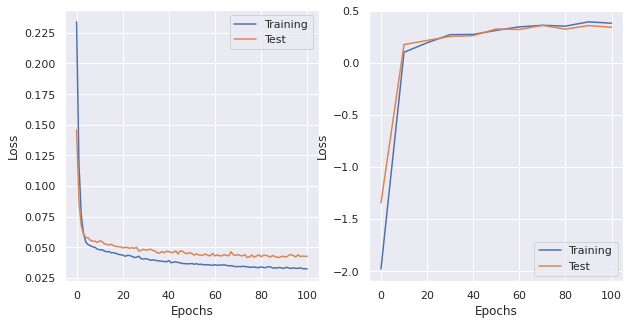

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0178. Test R^2: -1.3532. Loss Train: 0.2359. Loss Val: 0.1437. Time: 7.3980
 EPOCH 10. 

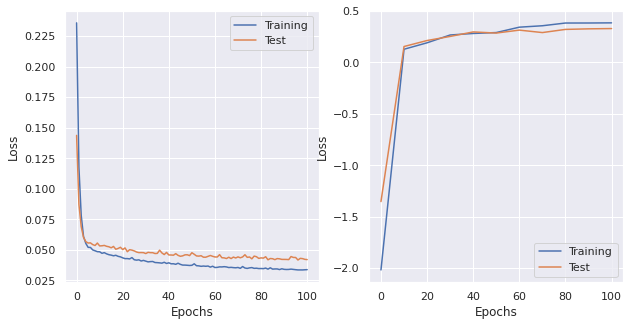

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1473. Test R^2: -1.5300. Loss Train: 0.2397. Loss Val: 0.1518. Time: 7.4717
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1274. Test R^2: 0.1654. Loss Train: 0.0490. Loss Val: 0.0544. Time: 7.6170
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1872. Test R^2: 0.1945. Loss Train: 0.0441. Loss Val: 0.0508. Time: 7.4151
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2386. Test R^2: 0.2190. Loss Train: 0.0414. Loss Val: 0.0476. Time: 7.7894
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2781. Test R^2: 0.2599. Loss Train: 0.0392. Loss Val: 0.0462. Time: 7.37

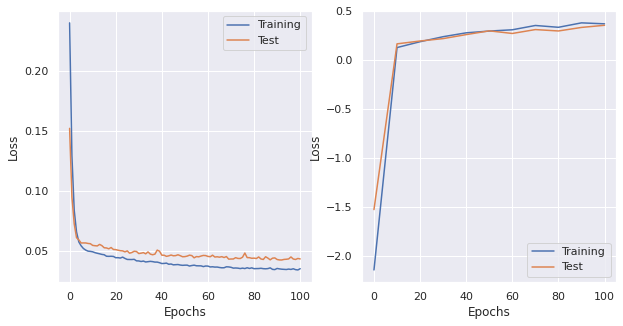

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.2692. Test R^2: -1.3516. Loss Train: 0.2337. Loss Val: 0.1455. Time: 7.4168
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1104. Test R^2: 0.1709. Loss Train: 0.0480. Loss Val: 0.0544. Time: 7.5457
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1319. Test R^2: 0.2257. Loss Train: 0.0434. Loss Val: 0.0488. Time: 7.3895
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2598. Test R^2: 0.2280. Loss Train: 0.0412. Loss Val: 0.0479. Time: 7.1810
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2691. Test R^2: 0.3019. Loss Train: 0.0383. Loss Val: 0.0463. Time: 

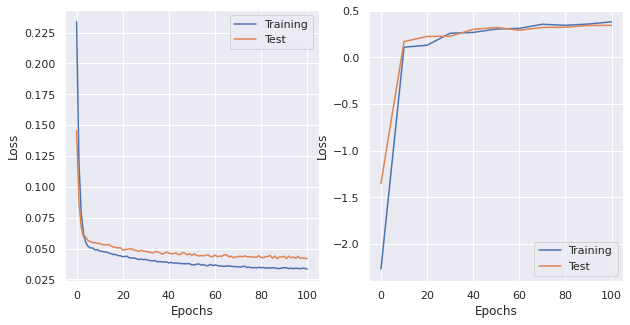

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0165. Test R^2: -1.5361. Loss Train: 0.2316. Loss Val: 0.1425. Time: 7.7000
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1028. Test R^2: 0.1070. Loss Train: 0.0484. Loss Val: 0.0534. Time: 7.3400
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2134. Test R^2: 0.2084. Loss Train: 0.0442. Loss Val: 0.0485. Time: 7.4060
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2531. Test R^2: 0.2750. Loss Train: 0.0409. Loss Val: 0.0486. Time: 7.5490
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2718. Test R^2: 0.2679. Loss Train: 0.0382. Loss Val: 0.0470. Tim

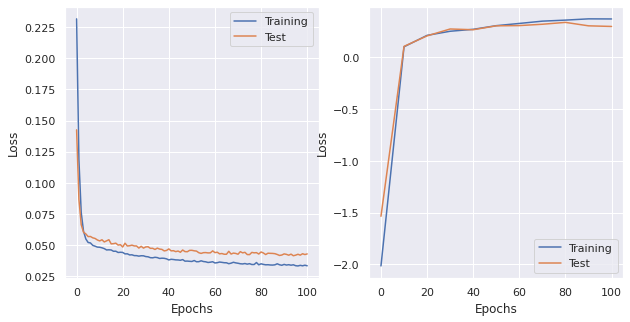

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9353. Test R^2: -1.4445. Loss Train: 0.2336. Loss Val: 0.1410. Time: 7.5861
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1122. Test R^2: 0.1558. Loss Train: 0.0478. Loss Val: 0.0550. Time: 7.3794
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1858. Test R^2: 0.2280. Loss Train: 0.0436. Loss Val: 0.0498. Time: 7.5192
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2483. Test R^2: 0.2684. Loss Train: 0.0409. Loss Val: 0.0484. Time: 7.4142
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2901. Test R^2: 0.2760. Loss Train: 0.0382. Loss Val: 0.0459. Time: 7.5142

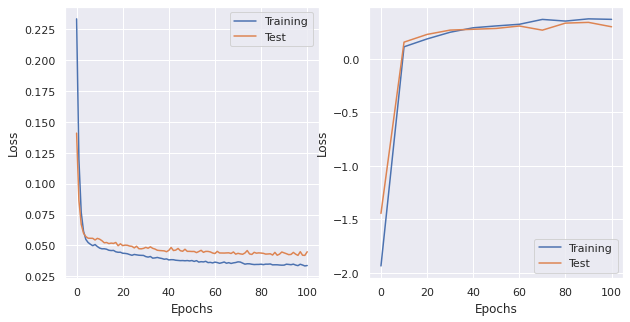

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0025. Test R^2: -1.3735. Loss Train: 0.2334. Loss Val: 0.1434. Time: 7.3886
 

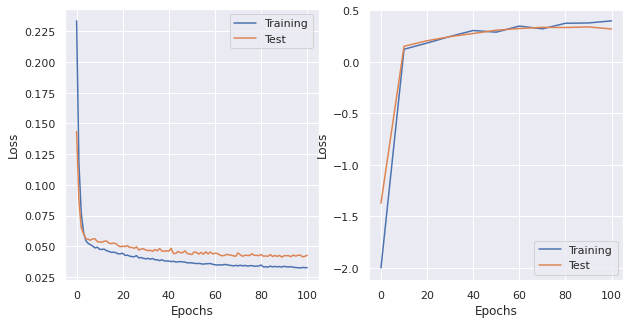

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1395. Test R^2: -1.4171. Loss Train: 0.2383. Loss Val: 0.1506. Time: 7.5261
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1194. Test R^2: 0.1552. Loss Train: 0.0482. Loss Val: 0.0546. Time: 7.8028
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1866. Test R^2: 0.1460. Loss Train: 0.0445. Loss Val: 0.0502. Time: 7.3540
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2026. Test R^2: 0.2668. Loss Train: 0.0411. Loss Val: 0.0481. Time: 7.5127
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3014. Test R^2: 0.2668. Loss Train: 0.0388. Loss Val: 0.0466. Time: 7

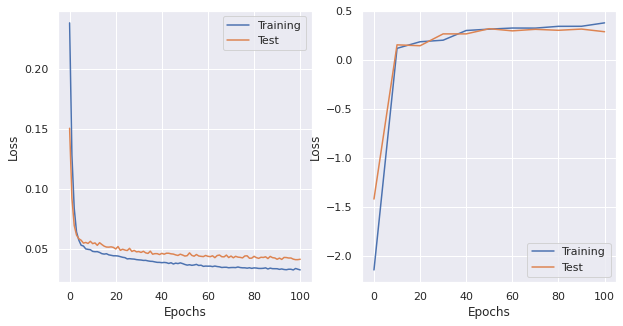

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9921. Test R^2: -1.2177. Loss Train: 0.2366. Loss Val: 0.1457. Time: 7.6873
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1198. Test R^2: 0.1622. Loss Train: 0.0481. Loss Val: 0.0538. Time: 7.8295
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1937. Test R^2: 0.2141. Loss Train: 0.0436. Loss Val: 0.0507. Time: 7.6124
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2567. Test R^2: 0.2521. Loss Train: 0.0401. Loss Val: 0.0483. Time: 7.7251
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2992. Test R^2: 0.2854. Loss Train: 0.0384. Loss Val: 0.0460. Tim

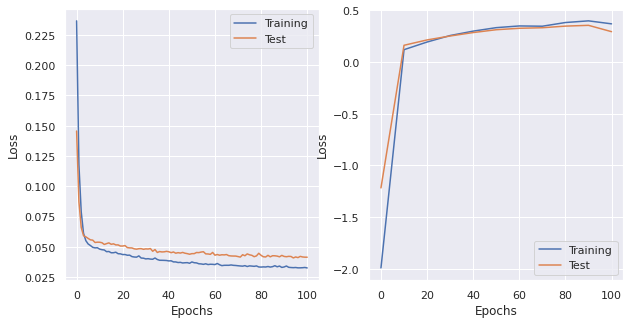

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1181. Test R^2: -1.2812. Loss Train: 0.2317. Loss Val: 0.1433. Time: 7.5324
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1120. Test R^2: 0.1552. Loss Train: 0.0482. Loss Val: 0.0548. Time: 7.3675
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2263. Test R^2: 0.1812. Loss Train: 0.0433. Loss Val: 0.0494. Time: 7.2435
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2464. Test R^2: 0.2840. Loss Train: 0.0404. Loss Val: 0.0488. Time: 7.2464
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2835. Test R^2: 0.2664. Loss Train: 0.0388. Loss Val: 0.0450. 

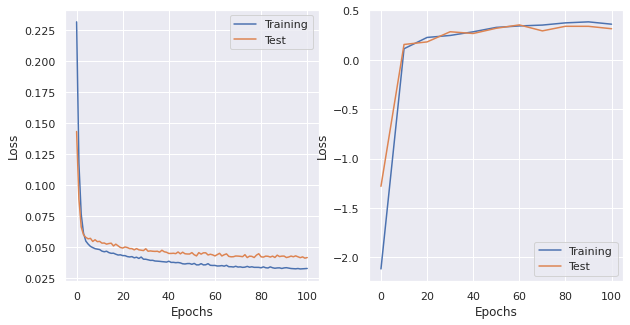

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9685. Test R^2: -1.4708. Loss Train: 0.2325. Loss Val: 0.1407. Time: 7.3760
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1278. Test R^2: 0.1731. Loss Train: 0.0476. Loss Val: 0.0541. Time: 7.6051
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2176. Test R^2: 0.2099. Loss Train: 0.0432. Loss Val: 0.0517. Time: 7.7154
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2610. Test R^2: 0.2646. Loss Train: 0.0398. Loss Val: 0.0482. Time: 7.0005
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2959. Test R^2: 0.2945. Loss Train: 0.0386. Loss Val: 0.0451. Time: 7.2

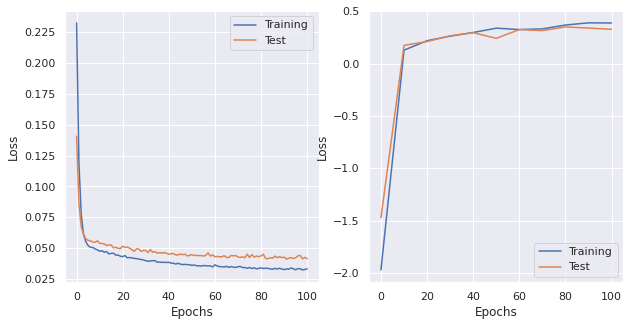

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9658. Test R^2: -1.3731. Loss Train: 0.2322. Loss Val: 0.1456. Time: 7.

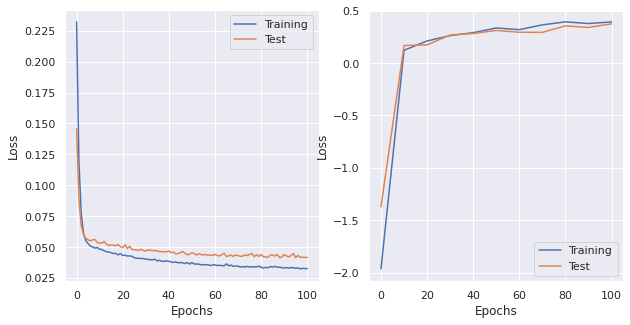

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1657. Test R^2: -1.5064. Loss Train: 0.2405. Loss Val: 0.1511. Time: 7.4553
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1103. Test R^2: 0.1617. Loss Train: 0.0488. Loss Val: 0.0549. Time: 7.0629
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1789. Test R^2: 0.1882. Loss Train: 0.0444. Loss Val: 0.0527. Time: 7.4491
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2278. Test R^2: 0.2396. Loss Train: 0.0412. Loss Val: 0.0468. Time: 7.5382
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3021. Test R^2: 0.2712. Loss Train: 0.0389. Loss Val: 0.0483. Time

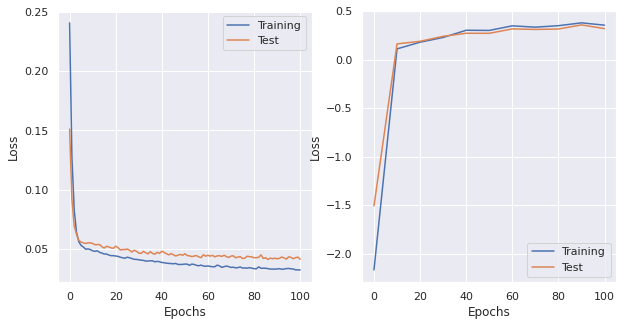

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0750. Test R^2: -1.3528. Loss Train: 0.2339. Loss Val: 0.1481. Time: 7.3463
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1152. Test R^2: 0.1657. Loss Train: 0.0490. Loss Val: 0.0551. Time: 7.6000
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2065. Test R^2: 0.2284. Loss Train: 0.0429. Loss Val: 0.0509. Time: 7.1320
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2585. Test R^2: 0.2706. Loss Train: 0.0402. Loss Val: 0.0484. Time: 7.3004
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2980. Test R^2: 0.2827. Loss Train: 0.0383. Loss Val: 0.0456. 

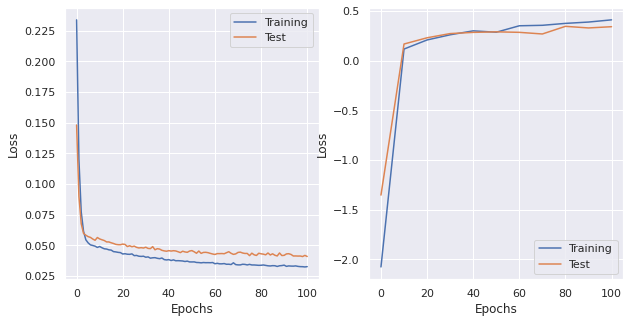

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1095. Test R^2: -1.3778. Loss Train: 0.2336. Loss Val: 0.1434. Time: 7.8211
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1232. Test R^2: 0.1381. Loss Train: 0.0486. Loss Val: 0.0548. Time: 7.2972
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2092. Test R^2: 0.2183. Loss Train: 0.0441. Loss Val: 0.0507. Time: 7.3994
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2422. Test R^2: 0.2370. Loss Train: 0.0404. Loss Val: 0.0459. Time: 7.4336
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3140. Test R^2: 0.2698. Loss Train: 0.0379. Loss Val: 0.044

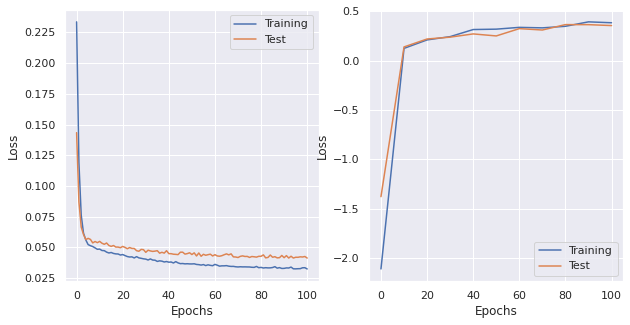

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.01
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0625. Test R^2: -1.2321. Loss Train: 0.2339. Loss Val: 0.1424. Time: 7.6947
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1402. Test R^2: 0.1299. Loss Train: 0.0481. Loss Val: 0.0552. Time: 7.4076
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2075. Test R^2: 0.2267. Loss Train: 0.0433. Loss Val: 0.0500. Time: 7.3338
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2594. Test R^2: 0.2572. Loss Train: 0.0408. Loss Val: 0.0476. Time: 7.9305
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3011. Test R^2: 0.3080. Loss Train: 0.0379. Loss Val: 0.0455. Time: 

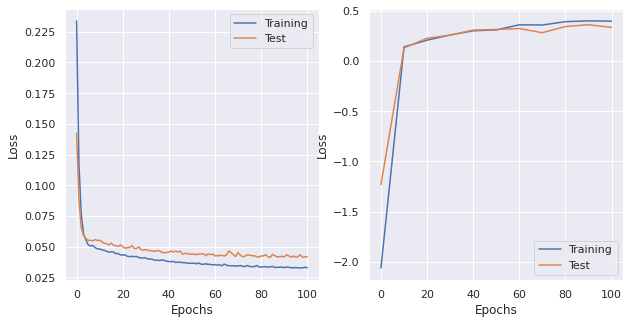

saving  ./plots/LogisticReg_lr0.001_momentum0.01_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.01, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9747. Test R^2: -1.3828. Loss Train: 0.2322. Loss Val: 0.1448. Time: 7.38

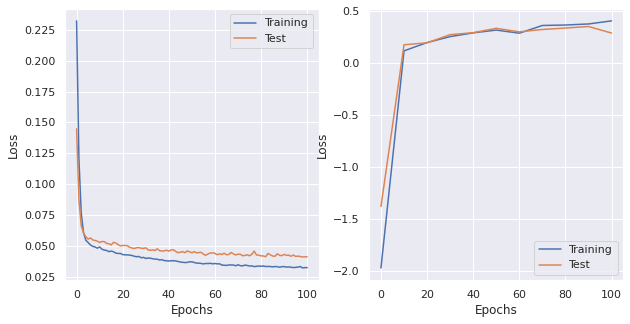

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1596. Test R^2: -1.3867. Loss Train: 0.2408. Loss Val: 0.1500. Time: 7.4338
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1032. Test R^2: 0.1586. Loss Train: 0.0485. Loss Val: 0.0555. Time: 7.6280
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1923. Test R^2: 0.2103. Loss Train: 0.0449. Loss Val: 0.0512. Time: 7.5693
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2392. Test R^2: 0.2398. Loss Train: 0.0419. Loss Val: 0.0471. Time: 7.5301
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2726. Test R^2: 0.2793. Loss Train: 0.0393. Loss Val: 0.0458. Time: 7.4460


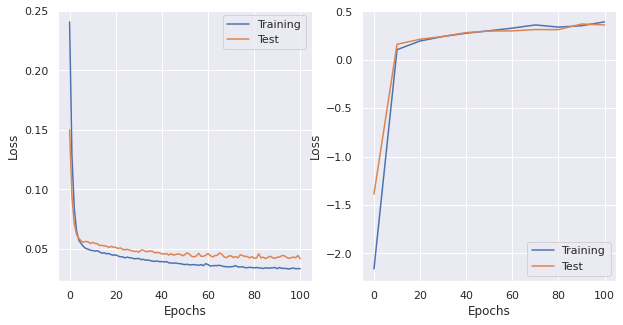

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0192. Test R^2: -1.3217. Loss Train: 0.2349. Loss Val: 0.1460. Time: 7.4505
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1101. Test R^2: 0.1660. Loss Train: 0.0479. Loss Val: 0.0559. Time: 7.4541
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1859. Test R^2: 0.2247. Loss Train: 0.0435. Loss Val: 0.0490. Time: 7.4706
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2384. Test R^2: 0.2429. Loss Train: 0.0408. Loss Val: 0.0477. Time: 7.4634
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2983. Test R^2: 0.3008. Loss Train: 0.0385. Loss Val: 0.0455. Time: 7.5

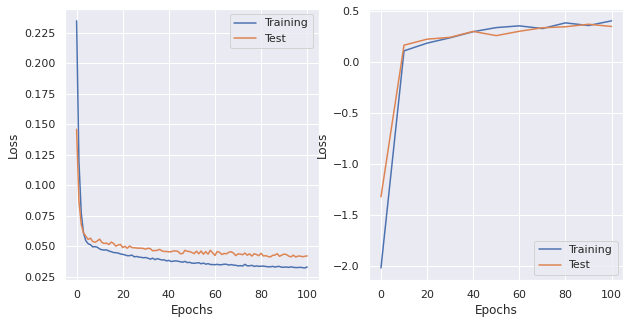

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9651. Test R^2: -1.2374. Loss Train: 0.2325. Loss Val: 0.1449. Time: 7.3670
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1177. Test R^2: 0.1607. Loss Train: 0.0483. Loss Val: 0.0534. Time: 7.4315
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1976. Test R^2: 0.2135. Loss Train: 0.0433. Loss Val: 0.0500. Time: 7.1910
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2544. Test R^2: 0.2512. Loss Train: 0.0404. Loss Val: 0.0475. Time: 7.3041
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3216. Test R^2: 0.2795. Loss Train: 0.0378. Loss Val: 0.0455. Time: 

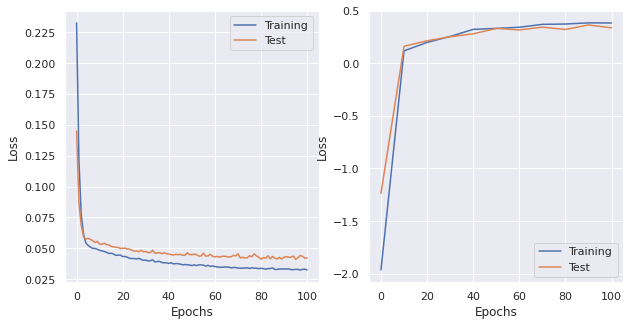

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0514. Test R^2: -1.1969. Loss Train: 0.2350. Loss Val: 0.1446. Time: 7.2098
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1079. Test R^2: 0.1476. Loss Train: 0.0482. Loss Val: 0.0536. Time: 7.3690
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2070. Test R^2: 0.2069. Loss Train: 0.0441. Loss Val: 0.0500. Time: 7.5644
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2497. Test R^2: 0.2692. Loss Train: 0.0401. Loss Val: 0.0484. Time: 7.5040
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2921. Test R^2: 0.2756. Loss Train: 0.0379. Loss Val: 0.0446. Time: 7.3929
 E

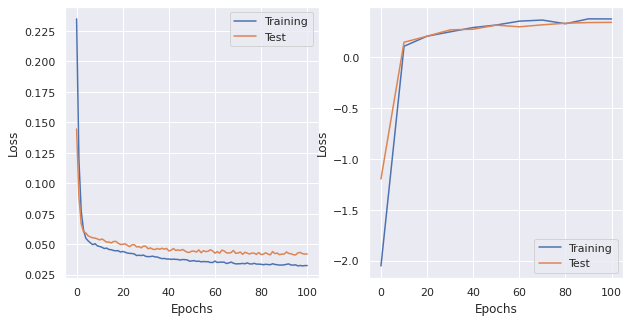

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9582. Test R^2: -1.2872. Loss Train: 0.2342. Loss Val: 0.1492. Time: 7.5844
 EPOC

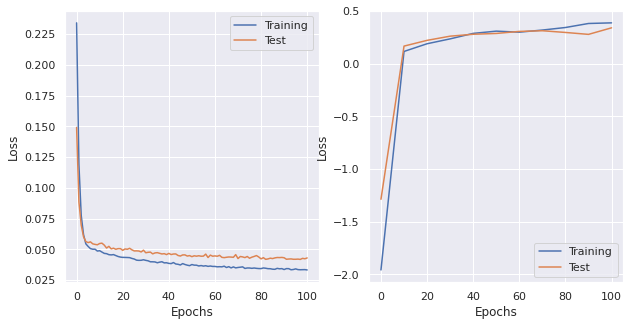

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1066. Test R^2: -1.4377. Loss Train: 0.2410. Loss Val: 0.1547. Time: 7.3964
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1033. Test R^2: 0.1634. Loss Train: 0.0490. Loss Val: 0.0539. Time: 7.2447
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1965. Test R^2: 0.2085. Loss Train: 0.0448. Loss Val: 0.0520. Time: 7.4146
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2532. Test R^2: 0.2502. Loss Train: 0.0421. Loss Val: 0.0477. Time: 7.7258
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2807. Test R^2: 0.2615. Loss Train: 0.0397. Loss Val: 0.0463. Time: 7

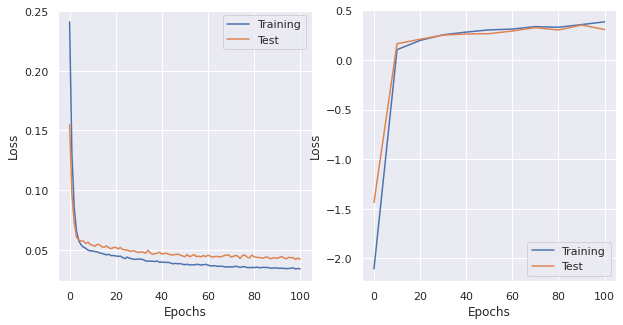

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0321. Test R^2: -1.2360. Loss Train: 0.2346. Loss Val: 0.1496. Time: 7.6580
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1355. Test R^2: 0.1566. Loss Train: 0.0483. Loss Val: 0.0537. Time: 7.3396
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1950. Test R^2: 0.1747. Loss Train: 0.0441. Loss Val: 0.0499. Time: 7.6143
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2080. Test R^2: 0.2575. Loss Train: 0.0415. Loss Val: 0.0482. Time: 7.3219
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2938. Test R^2: 0.2826. Loss Train: 0.0387. Loss Val: 0.0459. Tim

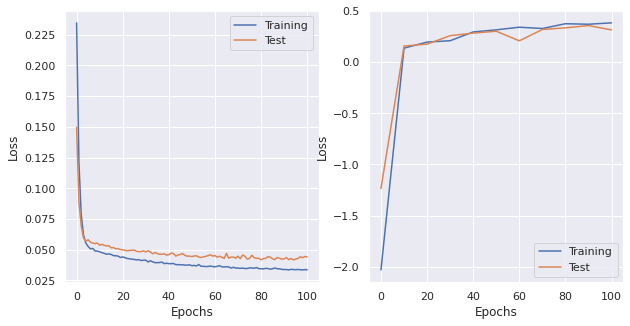

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0894. Test R^2: -1.2595. Loss Train: 0.2328. Loss Val: 0.1457. Time: 7.2080
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.0965. Test R^2: 0.1448. Loss Train: 0.0482. Loss Val: 0.0540. Time: 7.6915
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1871. Test R^2: 0.2042. Loss Train: 0.0436. Loss Val: 0.0492. Time: 7.3523
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2538. Test R^2: 0.2150. Loss Train: 0.0412. Loss Val: 0.0480. Time: 7.3437
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2930. Test R^2: 0.2523. Loss Train: 0.0391. Loss Val: 0.0458. 

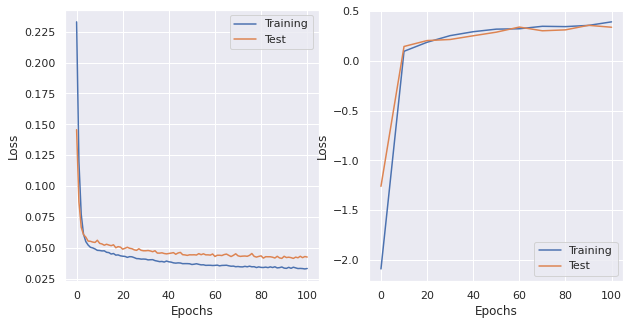

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9107. Test R^2: -1.2563. Loss Train: 0.2351. Loss Val: 0.1438. Time: 7.5652
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1026. Test R^2: 0.1859. Loss Train: 0.0489. Loss Val: 0.0528. Time: 7.2953
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1023. Test R^2: 0.1812. Loss Train: 0.0436. Loss Val: 0.0503. Time: 7.4727
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2299. Test R^2: 0.2525. Loss Train: 0.0410. Loss Val: 0.0484. Time: 7.5665
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2466. Test R^2: 0.1497. Loss Train: 0.0392. Loss Val: 0.0456. Time: 7.4

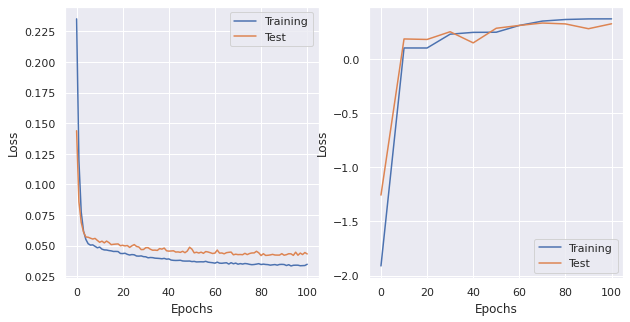

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0043. Test R^2: -1.2448. Loss Train: 0.2342. Loss Val: 0.1445. Time: 7.

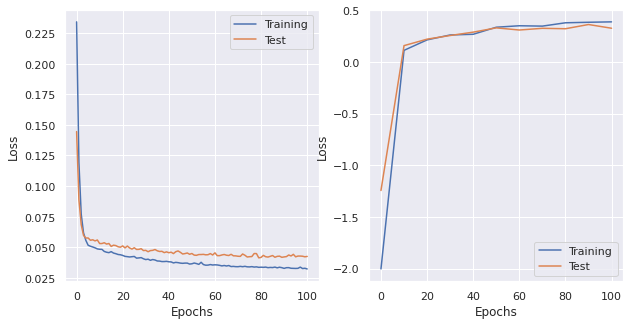

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1457. Test R^2: -1.4156. Loss Train: 0.2396. Loss Val: 0.1541. Time: 7.2450
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1034. Test R^2: 0.1484. Loss Train: 0.0493. Loss Val: 0.0548. Time: 7.5284
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1781. Test R^2: 0.2037. Loss Train: 0.0448. Loss Val: 0.0516. Time: 7.4210
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2363. Test R^2: 0.2554. Loss Train: 0.0420. Loss Val: 0.0481. Time: 7.1512
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2621. Test R^2: 0.2942. Loss Train: 0.0391. Loss Val: 0.0473. Time

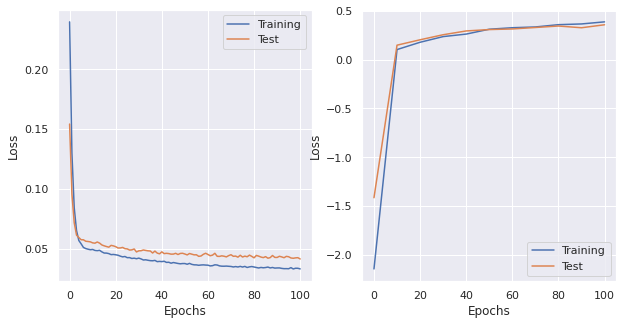

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9976. Test R^2: -1.6374. Loss Train: 0.2342. Loss Val: 0.1446. Time: 7.5835
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1302. Test R^2: 0.1715. Loss Train: 0.0480. Loss Val: 0.0532. Time: 7.2665
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1802. Test R^2: 0.2258. Loss Train: 0.0439. Loss Val: 0.0491. Time: 7.0769
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2679. Test R^2: 0.2686. Loss Train: 0.0406. Loss Val: 0.0479. Time: 7.7797
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2810. Test R^2: 0.3021. Loss Train: 0.0386. Loss Val: 0.0479. 

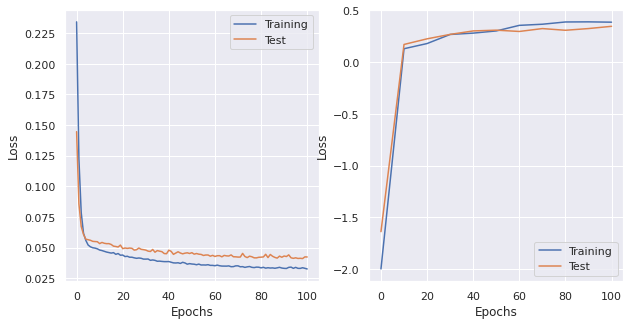

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9582. Test R^2: -1.2876. Loss Train: 0.2335. Loss Val: 0.1445. Time: 7.5422
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1093. Test R^2: 0.1667. Loss Train: 0.0483. Loss Val: 0.0545. Time: 7.8824
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2003. Test R^2: 0.2346. Loss Train: 0.0437. Loss Val: 0.0504. Time: 7.6886
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2508. Test R^2: 0.2606. Loss Train: 0.0403. Loss Val: 0.0474. Time: 7.1515
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2920. Test R^2: 0.2619. Loss Train: 0.0379. Loss Val: 0.045

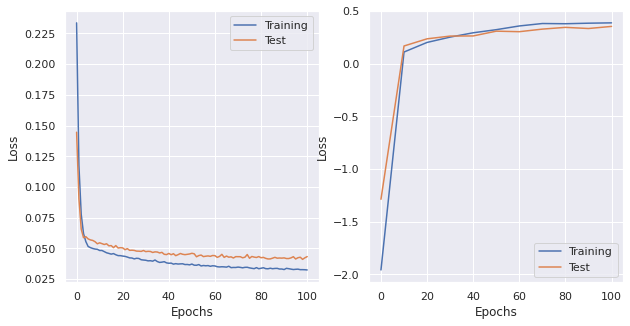

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9821. Test R^2: -1.3747. Loss Train: 0.2341. Loss Val: 0.1475. Time: 7.3503
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1192. Test R^2: 0.1746. Loss Train: 0.0482. Loss Val: 0.0557. Time: 7.4914
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1961. Test R^2: 0.2377. Loss Train: 0.0437. Loss Val: 0.0507. Time: 7.3987
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2549. Test R^2: 0.2733. Loss Train: 0.0399. Loss Val: 0.0476. Time: 7.3275
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2858. Test R^2: 0.2967. Loss Train: 0.0378. Loss Val: 0.0455. Time: 

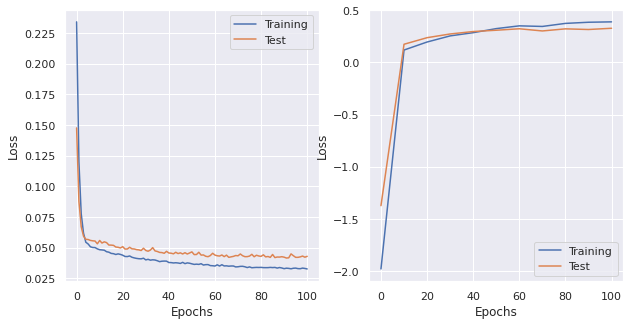

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.9940. Test R^2: -1.2395. Loss Train: 0.2322. Loss Val: 0.1425. Ti

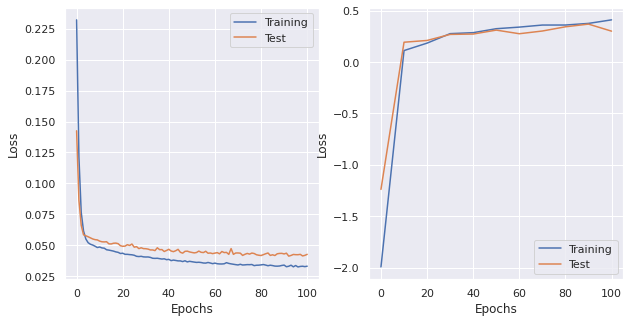

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.1468. Test R^2: -1.4212. Loss Train: 0.2400. Loss Val: 0.1526. Time: 7.6876
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1091. Test R^2: 0.1791. Loss Train: 0.0488. Loss Val: 0.0544. Time: 7.5615
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1909. Test R^2: 0.1659. Loss Train: 0.0444. Loss Val: 0.0507. Time: 7.3554
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2513. Test R^2: 0.2457. Loss Train: 0.0413. Loss Val: 0.0473. Time: 7.6142
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2711. Test R^2: 0.2678. Loss Train: 0.0389. Loss Val: 0.0465. T

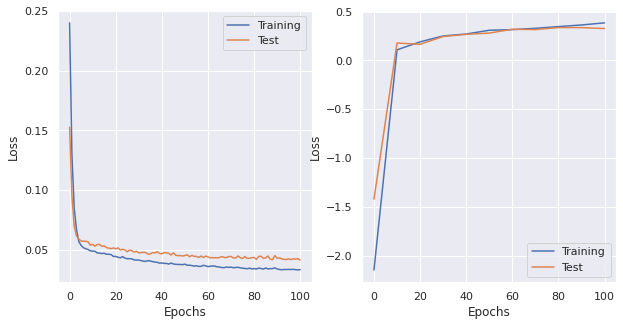

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0261. Test R^2: -1.2985. Loss Train: 0.2344. Loss Val: 0.1476. Time: 7.4670
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1053. Test R^2: 0.1710. Loss Train: 0.0478. Loss Val: 0.0550. Time: 7.6269
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2122. Test R^2: 0.2425. Loss Train: 0.0432. Loss Val: 0.0507. Time: 7.6817
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2359. Test R^2: 0.2570. Loss Train: 0.0410. Loss Val: 0.0479. Time: 7.3938
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3027. Test R^2: 0.2785. Loss Train: 0.0378. Loss Val: 0.046

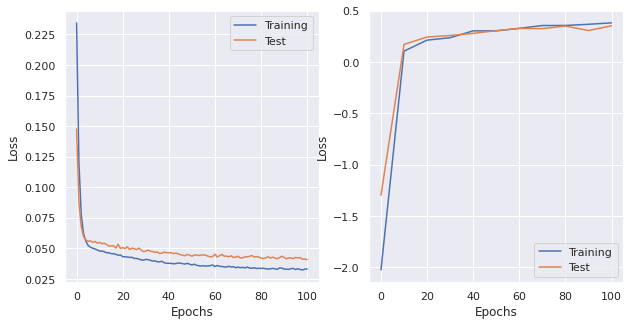

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0545. Test R^2: -1.2220. Loss Train: 0.2327. Loss Val: 0.1478. Time: 7.5202
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1175. Test R^2: 0.1768. Loss Train: 0.0478. Loss Val: 0.0550. Time: 7.4609
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.2115. Test R^2: 0.2034. Loss Train: 0.0444. Loss Val: 0.0507. Time: 7.5201
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2481. Test R^2: 0.2359. Loss Train: 0.0400. Loss Val: 0.0486. Time: 7.5604
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.2895. Test R^2: 0.2693. Loss Train: 0.0379. Loss Val: 0.

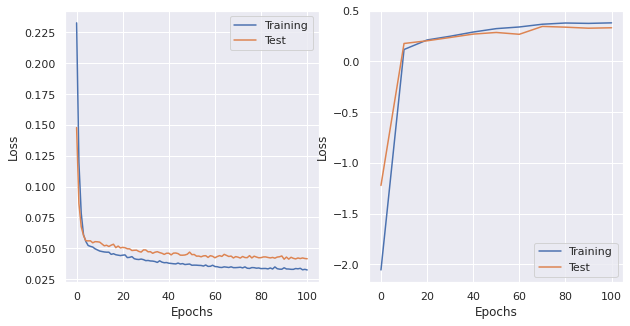

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.001
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -2.0048. Test R^2: -1.3466. Loss Train: 0.2332. Loss Val: 0.1471. Time: 7.3614
 EPOCH 10. Progress: 10.0%. 
 Training R^2: 0.1124. Test R^2: 0.1696. Loss Train: 0.0487. Loss Val: 0.0533. Time: 7.4508
 EPOCH 20. Progress: 20.0%. 
 Training R^2: 0.1853. Test R^2: 0.2103. Loss Train: 0.0436. Loss Val: 0.0497. Time: 7.6032
 EPOCH 30. Progress: 30.0%. 
 Training R^2: 0.2704. Test R^2: 0.2701. Loss Train: 0.0404. Loss Val: 0.0469. Time: 7.5321
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.3149. Test R^2: 0.2844. Loss Train: 0.0381. Loss Val: 0.0456. Tim

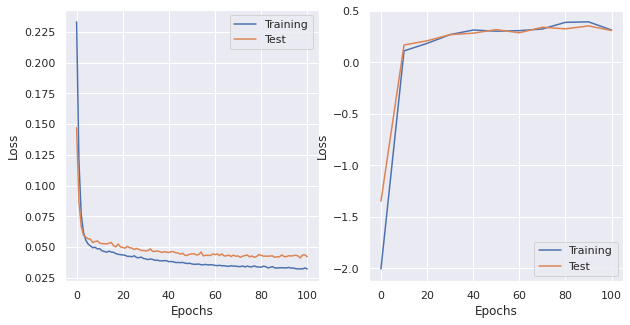

saving  ./plots/LogisticReg_lr0.001_momentum0.001_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.001, momentum: 0.001, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9461. Test R^2: -3.4169. Loss Train: 0.3193. Loss Val: 0.2829. Time: 7.4301

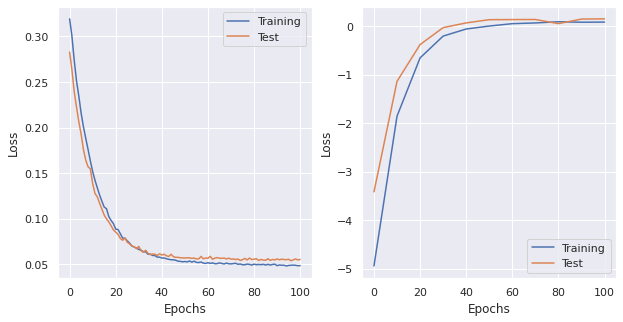

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0754. Test R^2: -3.7148. Loss Train: 0.3218. Loss Val: 0.2812. Time: 7.3953
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8065. Test R^2: -1.5098. Loss Train: 0.1526. Loss Val: 0.1367. Time: 7.4428
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6613. Test R^2: -0.3671. Loss Train: 0.0898. Loss Val: 0.0847. Time: 7.3077
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2237. Test R^2: -0.0296. Loss Train: 0.0670. Loss Val: 0.0660. Time: 7.5643
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0483. Test R^2: 0.0706. Loss Train: 0.0560. Loss Val: 0.0602. Time: 7.3735
 E

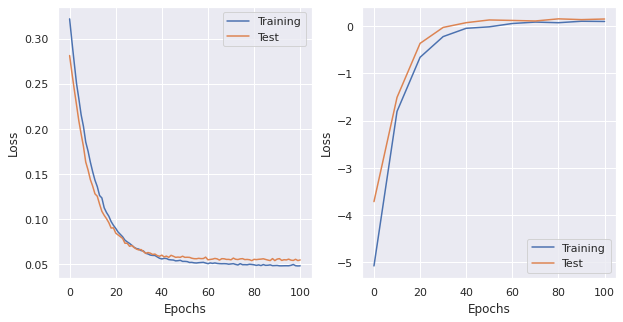

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8021. Test R^2: -3.4246. Loss Train: 0.3242. Loss Val: 0.2827. Time: 7.6005
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8887. Test R^2: -1.1945. Loss Train: 0.1511. Loss Val: 0.1380. Time: 7.9505
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6261. Test R^2: -0.3206. Loss Train: 0.0905. Loss Val: 0.0857. Time: 7.4265
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1986. Test R^2: -0.0207. Loss Train: 0.0663. Loss Val: 0.0675. Time: 7.8396
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0501. Test R^2: 0.0723. Loss Train: 0.0575. Loss Val: 0.0595. Time: 7.465

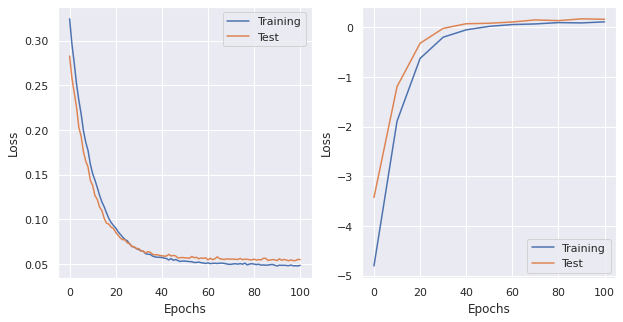

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.2769. Test R^2: -3.7363. Loss Train: 0.3232. Loss Val: 0.2770. Time: 7.4019
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7902. Test R^2: -1.3022. Loss Train: 0.1516. Loss Val: 0.1376. Time: 7.3838
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6526. Test R^2: -0.2791. Loss Train: 0.0896. Loss Val: 0.0839. Time: 7.7430
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2116. Test R^2: -0.0225. Loss Train: 0.0665. Loss Val: 0.0664. Time: 7.5588
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0261. Test R^2: 0.0645. Loss Train: 0.0567. Loss Val: 0.0597. Time: 7.

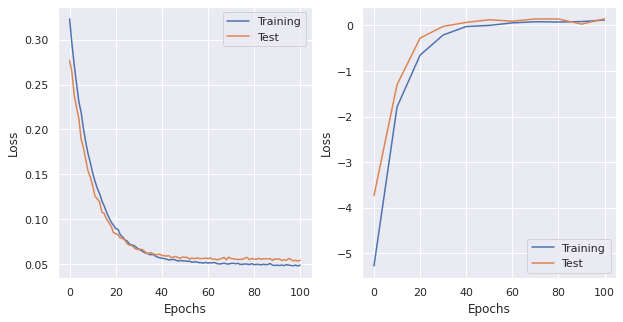

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. 

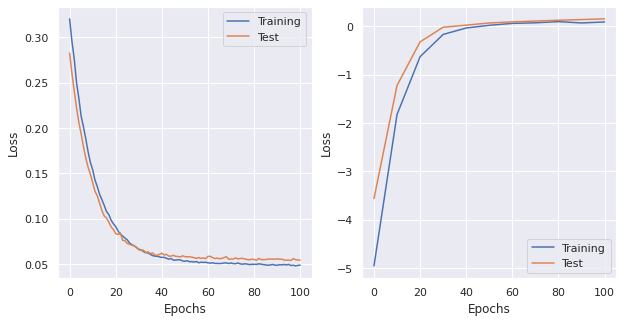

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0670. Test R^2: -3.5148. Loss Train: 0.3228. Loss Val: 0.2862. Time: 7.3098
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8649. Test R^2: -1.1814. Loss Train: 0.1516. Loss Val: 0.1352. Time: 7.4930
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6649. Test R^2: -0.3407. Loss Train: 0.0910. Loss Val: 0.0839. Time: 7.5069
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2534. Test R^2: -0.0376. Loss Train: 0.0659. Loss Val: 0.0660. Time: 7.3517
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1016. Test R^2: 0.0946. Loss Train: 0.0581. Loss Val: 0.0610. Time: 7.7

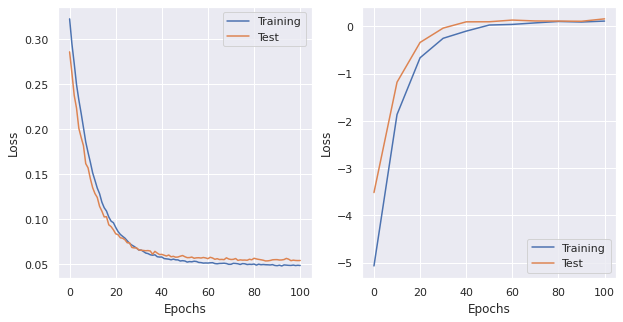

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8333. Test R^2: -3.4488. Loss Train: 0.3213. Loss Val: 0.2867. Time: 7.4351
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8338. Test R^2: -1.1863. Loss Train: 0.1520. Loss Val: 0.1359. Time: 7.4909
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6938. Test R^2: -0.3143. Loss Train: 0.0900. Loss Val: 0.0885. Time: 7.7527
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2064. Test R^2: -0.0644. Loss Train: 0.0669. Loss Val: 0.0659. Time: 7.1590
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0791. Test R^2: 0.0589. Loss Train: 0.0579. Loss Val: 0.0603. Time:

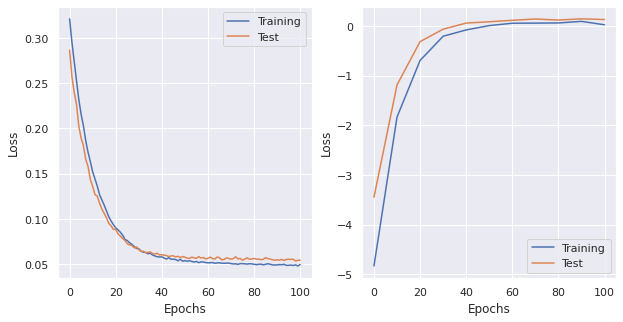

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.1217. Test R^2: -3.6233. Loss Train: 0.3193. Loss Val: 0.2833. Time: 7.4883
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7499. Test R^2: -1.1663. Loss Train: 0.1525. Loss Val: 0.1374. Time: 7.4580
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6451. Test R^2: -0.3932. Loss Train: 0.0896. Loss Val: 0.0862. Time: 7.6236
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2362. Test R^2: -0.0763. Loss Train: 0.0659. Loss Val: 0.0660. Time: 7.2727
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0225. Test R^2: 0.0481. Loss Train: 0.0576. Loss Val: 0.0599. Ti

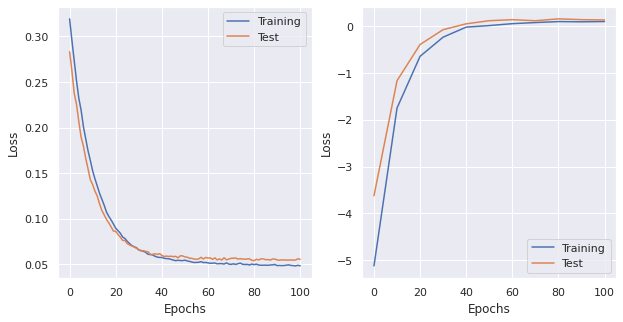

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay

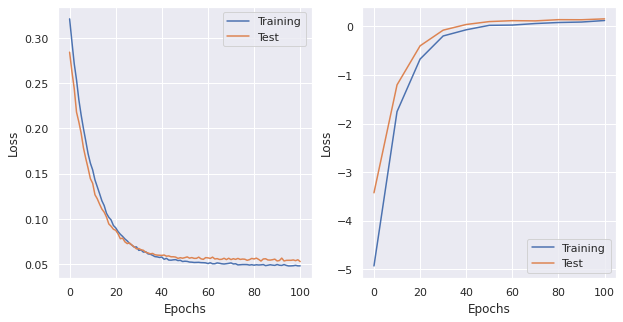

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7746. Test R^2: -3.5386. Loss Train: 0.3235. Loss Val: 0.2830. Time: 7.4791
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8187. Test R^2: -1.1230. Loss Train: 0.1530. Loss Val: 0.1355. Time: 7.5978
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6228. Test R^2: -0.3171. Loss Train: 0.0904. Loss Val: 0.0835. Time: 7.5530
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1916. Test R^2: -0.0307. Loss Train: 0.0664. Loss Val: 0.0660. Time: 7.1646
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0501. Test R^2: 0.0563. Loss Train: 0.0563. Loss Val: 0.0610. Time: 

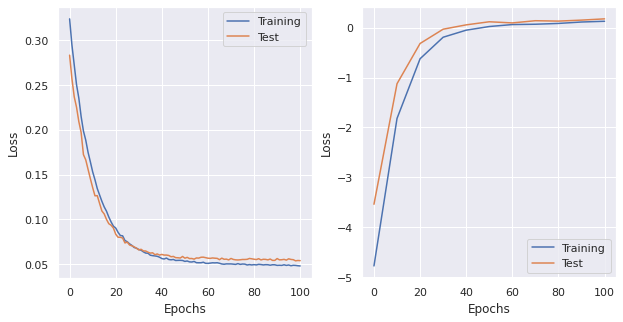

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7284. Test R^2: -3.8160. Loss Train: 0.3217. Loss Val: 0.2850. Time: 7.6821
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7115. Test R^2: -1.2452. Loss Train: 0.1534. Loss Val: 0.1370. Time: 7.0050
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7241. Test R^2: -0.3241. Loss Train: 0.0898. Loss Val: 0.0842. Time: 7.6996
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2189. Test R^2: -0.0641. Loss Train: 0.0660. Loss Val: 0.0669. Time: 7.5865
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0251. Test R^2: 0.0419. Loss Train: 0.0579. Loss Val: 0.0600. Ti

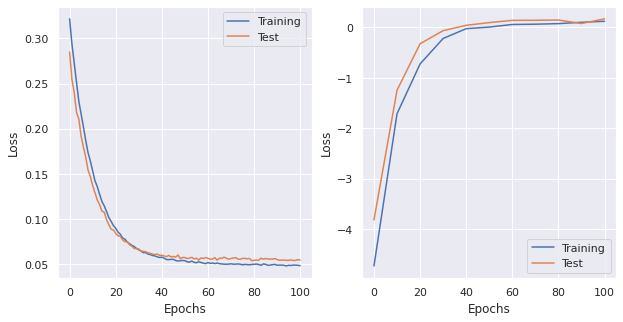

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8409. Test R^2: -3.3450. Loss Train: 0.3214. Loss Val: 0.2886. Time: 7.4601
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7622. Test R^2: -1.2505. Loss Train: 0.1534. Loss Val: 0.1401. Time: 7.3851
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6579. Test R^2: -0.3496. Loss Train: 0.0893. Loss Val: 0.0833. Time: 7.7175
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2047. Test R^2: -0.0461. Loss Train: 0.0654. Loss Val: 0.0675. Time: 7.2776
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0535. Test R^2: 0.0807. Loss Train: 0.0573. Loss Val: 0.0607.

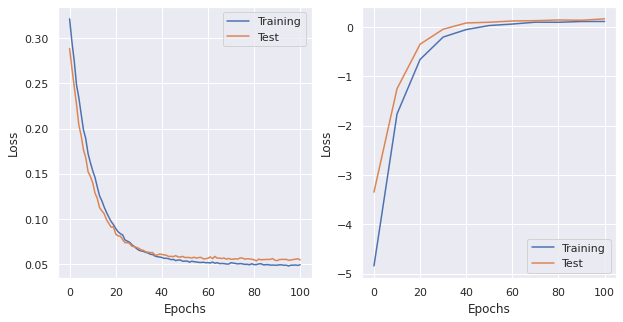

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight

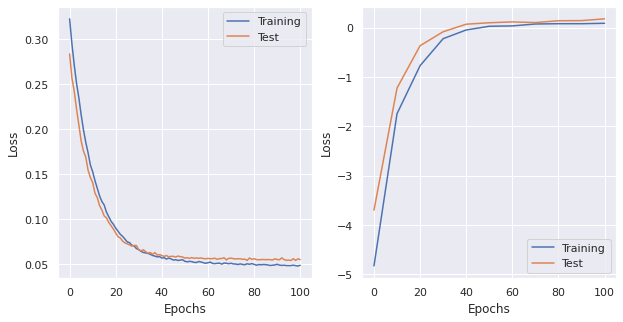

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7975. Test R^2: -3.4683. Loss Train: 0.3188. Loss Val: 0.2814. Time: 7.6136
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8145. Test R^2: -1.3326. Loss Train: 0.1536. Loss Val: 0.1383. Time: 7.4893
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6738. Test R^2: -0.3216. Loss Train: 0.0894. Loss Val: 0.0873. Time: 7.8171
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2278. Test R^2: -0.0174. Loss Train: 0.0656. Loss Val: 0.0659. Time: 7.3894
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1973. Test R^2: 0.0299. Loss Train: 0.0571. Loss Val: 0.0594. Tim

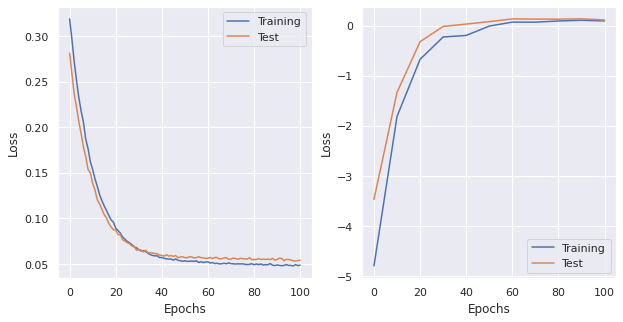

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0052. Test R^2: -3.4019. Loss Train: 0.3262. Loss Val: 0.2811. Time: 7.4975
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7222. Test R^2: -1.0858. Loss Train: 0.1524. Loss Val: 0.1389. Time: 7.4538
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7274. Test R^2: -0.3716. Loss Train: 0.0895. Loss Val: 0.0834. Time: 7.7218
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2608. Test R^2: -0.0668. Loss Train: 0.0671. Loss Val: 0.0662. Time: 7.4809
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0575. Test R^2: 0.0568. Loss Train: 0.0566. Loss Val: 0.0599.

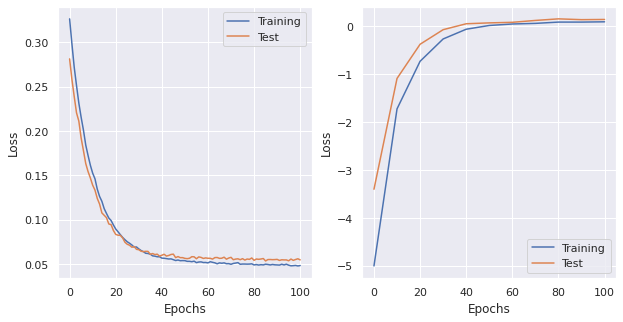

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8853. Test R^2: -3.5247. Loss Train: 0.3207. Loss Val: 0.2840. Time: 7.4438
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7475. Test R^2: -1.1427. Loss Train: 0.1518. Loss Val: 0.1349. Time: 7.2826
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6657. Test R^2: -0.3258. Loss Train: 0.0891. Loss Val: 0.0860. Time: 7.5786
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2423. Test R^2: -0.0435. Loss Train: 0.0660. Loss Val: 0.0662. Time: 7.3138
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0541. Test R^2: 0.0525. Loss Train: 0.0566. Loss Val: 0.06

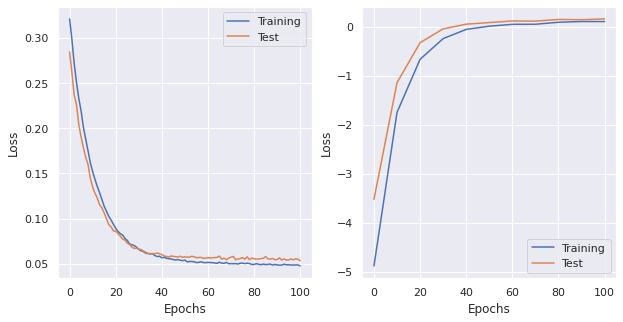

saving  ./plots/LogisticReg_lr0.0001_momentum0_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    w

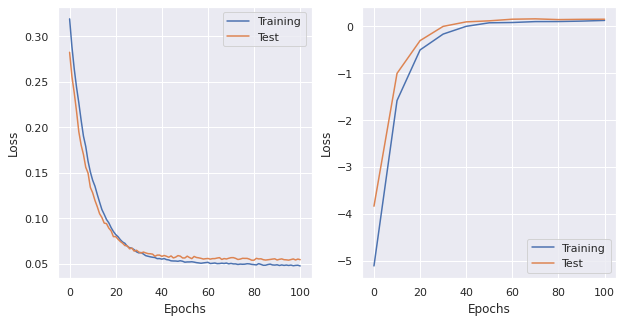

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9648. Test R^2: -3.5667. Loss Train: 0.3199. Loss Val: 0.2835. Time: 7.3528
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8174. Test R^2: -1.2900. Loss Train: 0.1523. Loss Val: 0.1406. Time: 7.2330
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6748. Test R^2: -0.3728. Loss Train: 0.0896. Loss Val: 0.0844. Time: 7.5172
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2056. Test R^2: -0.0191. Loss Train: 0.0663. Loss Val: 0.0667. Time: 7.5934
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0564. Test R^2: 0.0491. Loss Train: 0.0567. Loss Val: 0.0579. Time: 7.5

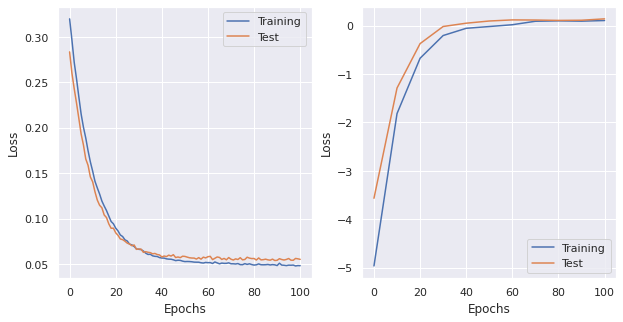

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8293. Test R^2: -4.0404. Loss Train: 0.3210. Loss Val: 0.2852. Time: 7.3577
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.6436. Test R^2: -0.9935. Loss Train: 0.1428. Loss Val: 0.1255. Time: 7.4913
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5103. Test R^2: -0.2183. Loss Train: 0.0831. Loss Val: 0.0792. Time: 7.6051
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1542. Test R^2: 0.0138. Loss Train: 0.0628. Loss Val: 0.0633. Time: 7.6891
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0202. Test R^2: 0.0742. Loss Train: 0.0552. Loss Val: 0.0587. Time: 

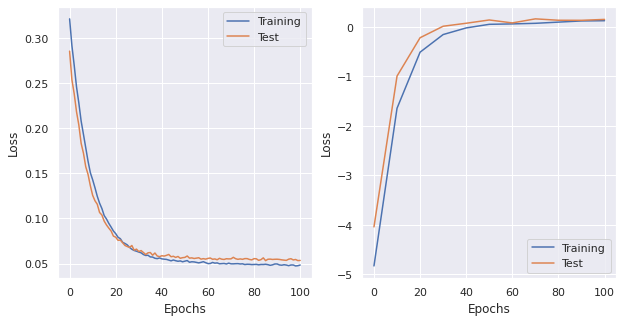

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9588. Test R^2: -3.4000. Loss Train: 0.3199. Loss Val: 0.2782. Time: 7.2880
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.5591. Test R^2: -1.0261. Loss Train: 0.1413. Loss Val: 0.1273. Time: 7.4636
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.4846. Test R^2: -0.2350. Loss Train: 0.0824. Loss Val: 0.0780. Time: 7.2199
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1521. Test R^2: 0.0379. Loss Train: 0.0620. Loss Val: 0.0641. Time: 7.5406
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.0062. Test R^2: 0.1129. Loss Train: 0.0551. Loss Val: 0.0589. Time

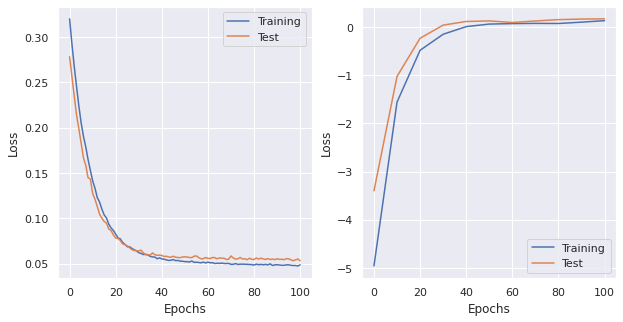

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8349. Test R^2: -3.8203. Loss Train: 0.3203. Loss Val: 0.2793. Time: 7.6631
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.5754. Test R^2: -1.0055. Loss Train: 0.1414. Loss Val: 0.1255. Time: 7.4494
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5393. Test R^2: -0.2366. Loss Train: 0.0832. Loss Val: 0.0806. Time: 7.3139
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1588. Test R^2: -0.0003. Loss Train: 0.0627. Loss Val: 0.0618. Time: 7.4977
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0142. Test R^2: 0.0872. Loss Train: 0.0550. Loss Val: 0.0606. Time: 7.965

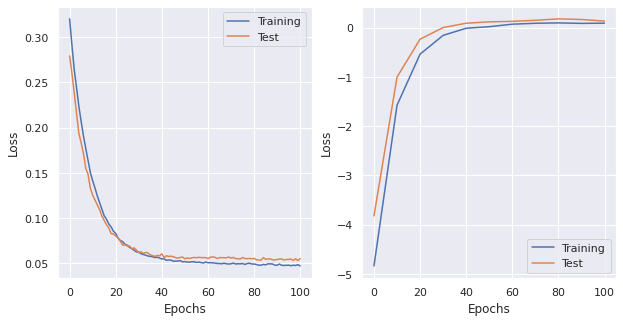

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0154. Test R^2: -4.0023. Loss Train: 0.3168. Loss Val: 0.2846. Time: 7.5656
 EPOCH 10. 

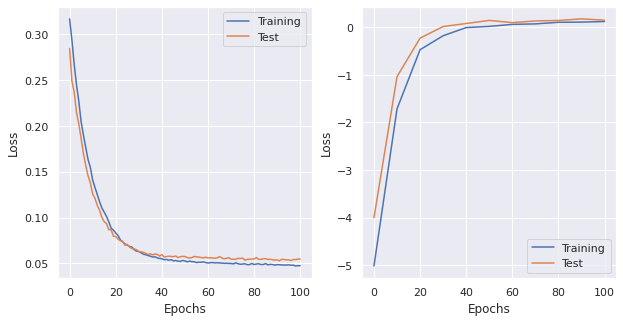

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7959. Test R^2: -3.4821. Loss Train: 0.3264. Loss Val: 0.2809. Time: 7.5082
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8014. Test R^2: -1.0988. Loss Train: 0.1527. Loss Val: 0.1377. Time: 7.5252
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6993. Test R^2: -0.3450. Loss Train: 0.0892. Loss Val: 0.0845. Time: 7.5980
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1960. Test R^2: -0.0291. Loss Train: 0.0669. Loss Val: 0.0668. Time: 7.3137
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0580. Test R^2: 0.0599. Loss Train: 0.0570. Loss Val: 0.0606. Tim

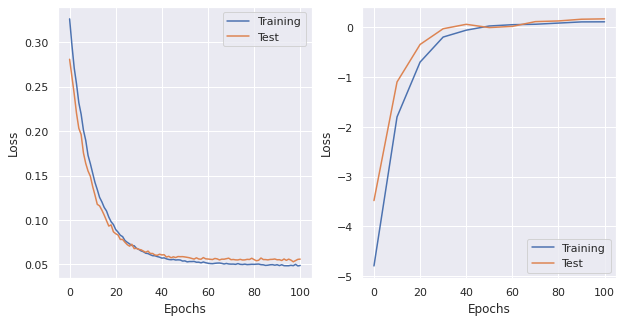

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8907. Test R^2: -3.4598. Loss Train: 0.3184. Loss Val: 0.2822. Time: 7.1138
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.5498. Test R^2: -1.1335. Loss Train: 0.1416. Loss Val: 0.1288. Time: 7.3006
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5214. Test R^2: -0.3538. Loss Train: 0.0836. Loss Val: 0.0798. Time: 7.4746
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1884. Test R^2: 0.0027. Loss Train: 0.0643. Loss Val: 0.0653. Time: 7.4957
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0256. Test R^2: 0.0322. Loss Train: 0.0559. Loss Val: 0.0597. 

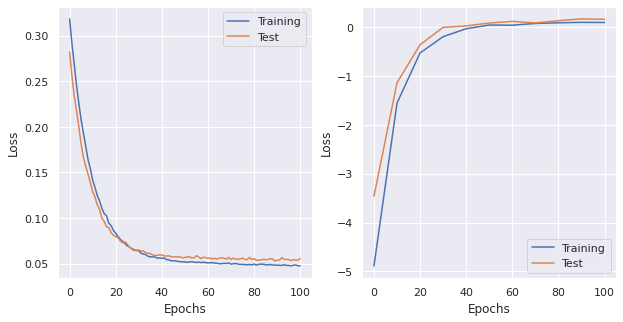

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7997. Test R^2: -3.7014. Loss Train: 0.3198. Loss Val: 0.2825. Time: 7.3023
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.6201. Test R^2: -1.0433. Loss Train: 0.1411. Loss Val: 0.1257. Time: 7.5800
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5893. Test R^2: -0.3255. Loss Train: 0.0818. Loss Val: 0.0804. Time: 7.9121
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1409. Test R^2: 0.0256. Loss Train: 0.0632. Loss Val: 0.0647. Time: 7.8207
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0363. Test R^2: 0.0796. Loss Train: 0.0552. Loss Val: 0.059

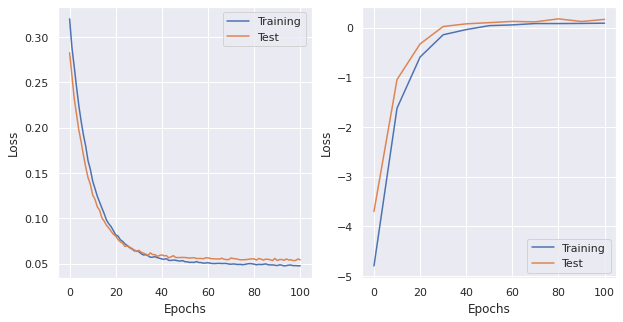

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.2030. Test R^2: -3.6777. Loss Train: 0.3160. Loss Val: 0.2777. Time: 7.5253
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.6496. Test R^2: -0.9815. Loss Train: 0.1422. Loss Val: 0.1266. Time: 7.4657
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5311. Test R^2: -0.2325. Loss Train: 0.0818. Loss Val: 0.0792. Time: 7.7174
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1490. Test R^2: -0.0402. Loss Train: 0.0626. Loss Val: 0.0630. Time: 7.7809
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0223. Test R^2: 0.0914. Loss Train: 0.0555. Loss Val: 0.0583. Time:

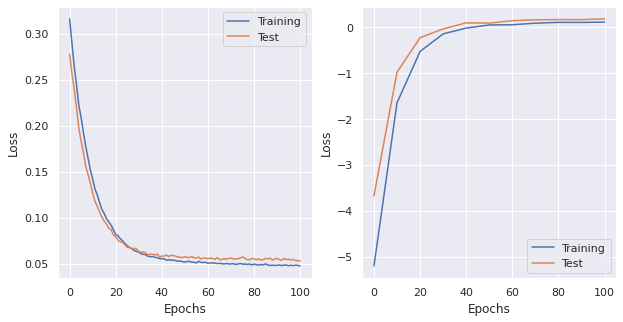

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9265. Test R^2: -3.4566. Loss Train: 0.3181. Loss Val: 0.2796. Time: 7.4653
 

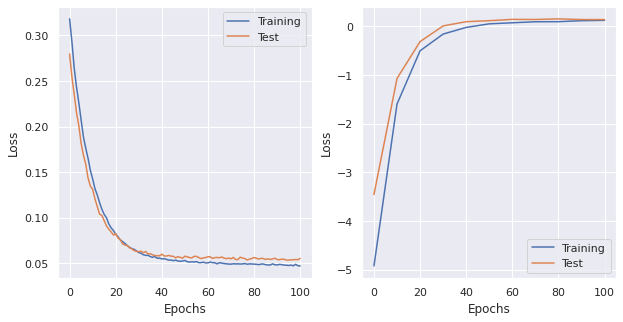

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9424. Test R^2: -3.3878. Loss Train: 0.3208. Loss Val: 0.2797. Time: 7.5161
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -2.0363. Test R^2: -1.2190. Loss Train: 0.1527. Loss Val: 0.1363. Time: 7.3160
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6503. Test R^2: -0.3658. Loss Train: 0.0903. Loss Val: 0.0857. Time: 7.5459
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1944. Test R^2: -0.0760. Loss Train: 0.0686. Loss Val: 0.0679. Time: 7.5618
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0562. Test R^2: 0.0892. Loss Train: 0.0564. Loss Val: 0.0608. 

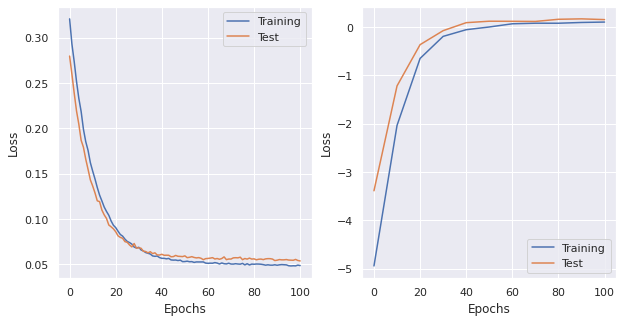

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.1120. Test R^2: -3.7937. Loss Train: 0.3194. Loss Val: 0.2824. Time: 7.4407
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.6302. Test R^2: -1.0523. Loss Train: 0.1423. Loss Val: 0.1311. Time: 7.2280
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5486. Test R^2: -0.2151. Loss Train: 0.0838. Loss Val: 0.0796. Time: 7.2557
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1603. Test R^2: -0.0022. Loss Train: 0.0622. Loss Val: 0.0641. Time: 7.4053
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.0018. Test R^2: 0.0909. Loss Train: 0.0555. Loss Val: 0.058

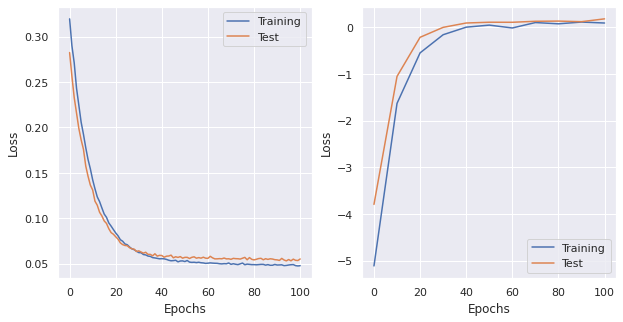

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.3414. Test R^2: -3.3870. Loss Train: 0.3163. Loss Val: 0.2833. Time: 7.2006
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.5960. Test R^2: -1.1546. Loss Train: 0.1437. Loss Val: 0.1278. Time: 7.7498
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5278. Test R^2: -0.2244. Loss Train: 0.0826. Loss Val: 0.0785. Time: 7.7162
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1428. Test R^2: 0.0088. Loss Train: 0.0634. Loss Val: 0.0633. Time: 7.6225
 EPOCH 40. Progress: 40.0%. 
 Training R^2: 0.0016. Test R^2: 0.0739. Loss Train: 0.0549. Loss Val: 0.0

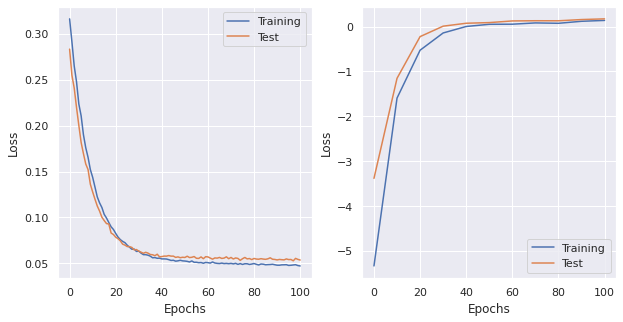

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9061. Test R^2: -3.3583. Loss Train: 0.3194. Loss Val: 0.2801. Time: 7.5309
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.6343. Test R^2: -1.0579. Loss Train: 0.1417. Loss Val: 0.1282. Time: 7.6850
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.4994. Test R^2: -0.2465. Loss Train: 0.0834. Loss Val: 0.0779. Time: 7.5264
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1384. Test R^2: 0.0180. Loss Train: 0.0620. Loss Val: 0.0623. Time: 7.6623
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0031. Test R^2: 0.0558. Loss Train: 0.0541. Loss Val: 0.0582. Tim

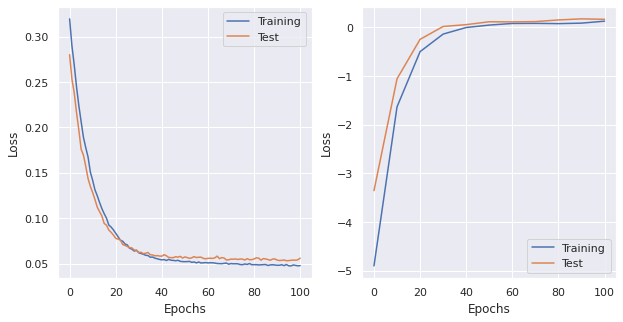

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.1547. Test R^2: -3.8167. Loss Train: 0.3207. Loss Val: 0.2829. Time: 7.

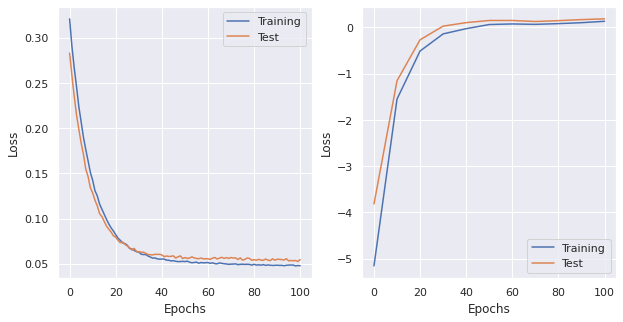

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8922. Test R^2: -3.6808. Loss Train: 0.3198. Loss Val: 0.2845. Time: 7.3724
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8150. Test R^2: -1.2958. Loss Train: 0.1533. Loss Val: 0.1384. Time: 7.3588
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6329. Test R^2: -0.3118. Loss Train: 0.0894. Loss Val: 0.0856. Time: 7.5875
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2253. Test R^2: -0.0363. Loss Train: 0.0669. Loss Val: 0.0656. Time: 7.4006
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0407. Test R^2: 0.0586. Loss Train: 0.0577. Loss Val: 0.059

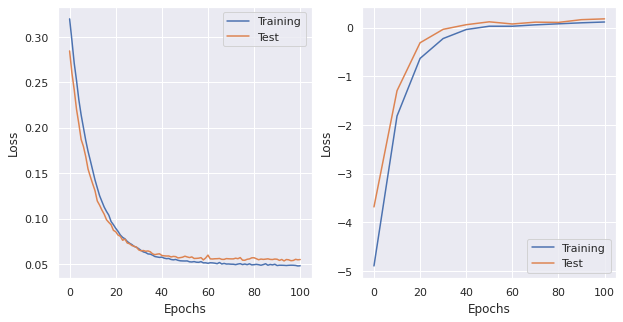

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7431. Test R^2: -3.8016. Loss Train: 0.3175. Loss Val: 0.2795. Time: 7.3185
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.6384. Test R^2: -1.0974. Loss Train: 0.1416. Loss Val: 0.1246. Time: 7.5011
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5594. Test R^2: -0.2568. Loss Train: 0.0829. Loss Val: 0.0831. Time: 7.4306
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1708. Test R^2: 0.0261. Loss Train: 0.0626. Loss Val: 0.0635. Time: 7.7690
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0142. Test R^2: 0.0650. Loss Train: 0.0548. Loss Val: 0.

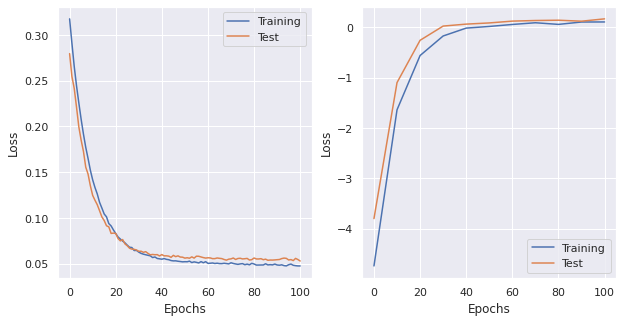

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8150. Test R^2: -3.4795. Loss Train: 0.3199. Loss Val: 0.2803. Time: 7.3604
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.5909. Test R^2: -1.0405. Loss Train: 0.1417. Loss Val: 0.1285. Time: 7.4102
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5385. Test R^2: -0.2451. Loss Train: 0.0837. Loss Val: 0.0803. Time: 7.6624
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1411. Test R^2: 0.0031. Loss Train: 0.0625. Loss Val: 0.0660. Time: 7.4539
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0043. Test R^2: 0.0827. Loss Train: 0.0553. Loss Val:

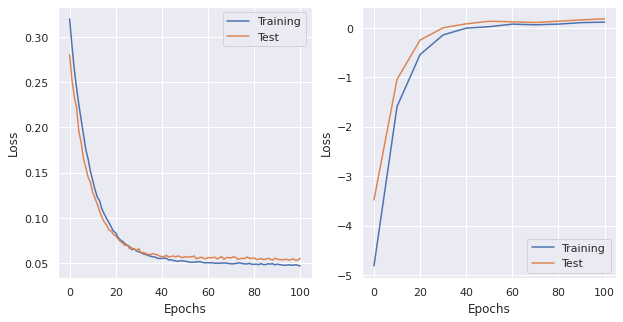

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.1
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7362. Test R^2: -3.4811. Loss Train: 0.3199. Loss Val: 0.2788. Time: 7.3909
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7231. Test R^2: -1.0249. Loss Train: 0.1426. Loss Val: 0.1287. Time: 7.3111
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5191. Test R^2: -0.1842. Loss Train: 0.0832. Loss Val: 0.0775. Time: 7.3747
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1651. Test R^2: 0.0003. Loss Train: 0.0631. Loss Val: 0.0623. Time: 7.3542
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0408. Test R^2: 0.0891. Loss Train: 0.0554. Loss Val: 0.0582. 

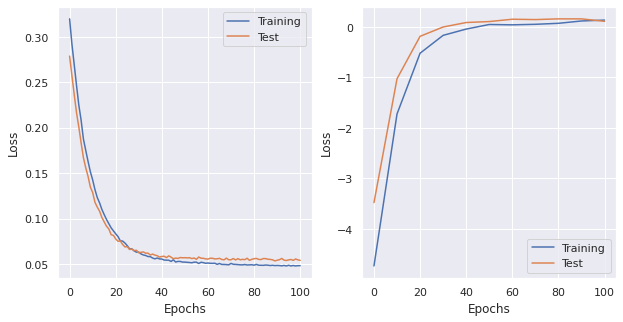

saving  ./plots/LogisticReg_lr0.0001_momentum0.1_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.1, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8111. Test R^2: -3.5986. Loss Train: 0.3210. Loss Val: 0.2807. Time: 7.48

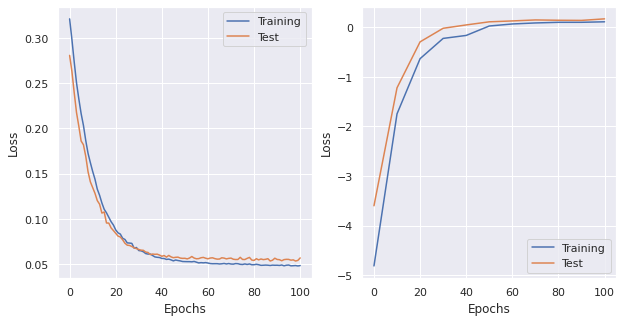

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9411. Test R^2: -3.4852. Loss Train: 0.3248. Loss Val: 0.2949. Time: 7.1371
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.9056. Test R^2: -1.2799. Loss Train: 0.1606. Loss Val: 0.1467. Time: 7.5399
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.8121. Test R^2: -0.4127. Loss Train: 0.0974. Loss Val: 0.0920. Time: 7.5364
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2915. Test R^2: -0.0726. Loss Train: 0.0696. Loss Val: 0.0693. Time: 7.4407
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0986. Test R^2: 0.0390. Loss Train: 0.0593. Loss Val: 0.0616. Time: 

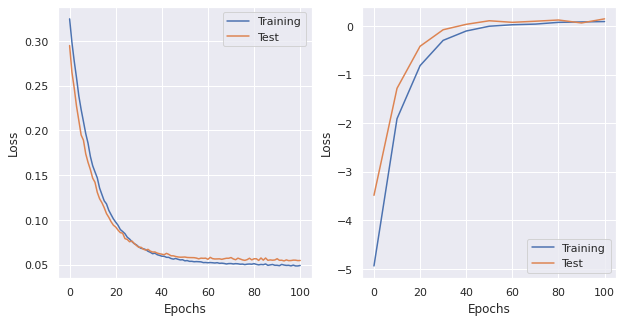

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9756. Test R^2: -4.1511. Loss Train: 0.3229. Loss Val: 0.2795. Time: 7.4124
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7873. Test R^2: -1.1583. Loss Train: 0.1506. Loss Val: 0.1387. Time: 7.4637
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7033. Test R^2: -0.3452. Loss Train: 0.0892. Loss Val: 0.0841. Time: 7.2079
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2447. Test R^2: 0.0067. Loss Train: 0.0657. Loss Val: 0.0647. Time: 7.1337
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0429. Test R^2: 0.0417. Loss Train: 0.0570. Loss Val: 0.0596. Tim

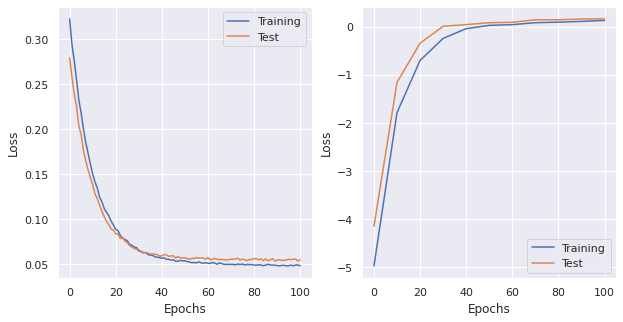

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9726. Test R^2: -3.7367. Loss Train: 0.3199. Loss Val: 0.2808. Time: 7.4030
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7684. Test R^2: -1.1476. Loss Train: 0.1525. Loss Val: 0.1402. Time: 7.3619
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6820. Test R^2: -0.3070. Loss Train: 0.0884. Loss Val: 0.0849. Time: 7.1994
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2819. Test R^2: -0.0745. Loss Train: 0.0655. Loss Val: 0.0654. Time: 7.3285
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0540. Test R^2: 0.0529. Loss Train: 0.0568. Loss Val: 0.0598.

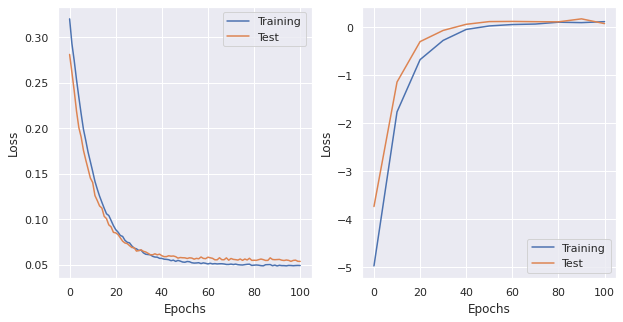

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9840. Test R^2: -3.5610. Loss Train: 0.3229. Loss Val: 0.2883. Time: 7.3886
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8328. Test R^2: -1.1485. Loss Train: 0.1508. Loss Val: 0.1363. Time: 7.5649
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6094. Test R^2: -0.3213. Loss Train: 0.0898. Loss Val: 0.0827. Time: 7.8055
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2191. Test R^2: -0.0245. Loss Train: 0.0650. Loss Val: 0.0663. Time: 7.6934
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0606. Test R^2: 0.0815. Loss Train: 0.0569. Loss Val: 0.0597. Time: 7.

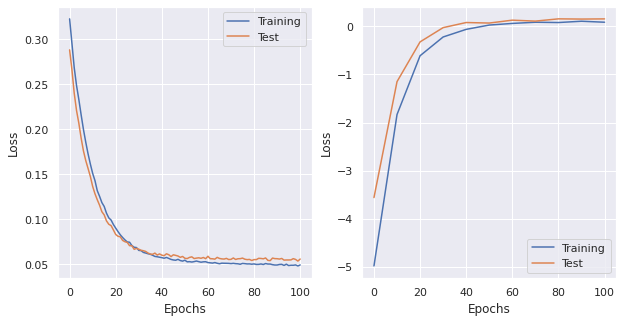

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8809. Test R^2: -3.6101. Loss Train: 0.3199. Loss Val: 0.2814. Time: 7.4124
 EPOC

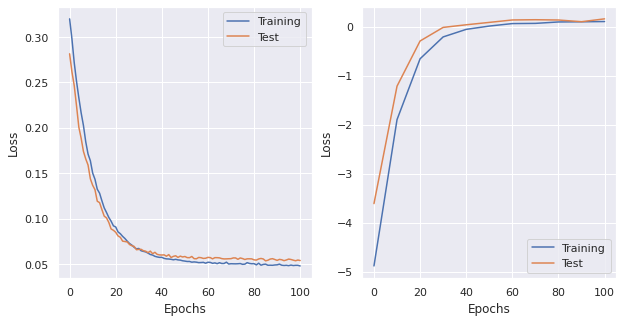

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7189. Test R^2: -3.4884. Loss Train: 0.3222. Loss Val: 0.2843. Time: 7.3416
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -2.0991. Test R^2: -1.3817. Loss Train: 0.1631. Loss Val: 0.1481. Time: 7.3701
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7892. Test R^2: -0.4224. Loss Train: 0.0984. Loss Val: 0.0893. Time: 7.2582
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2807. Test R^2: -0.0990. Loss Train: 0.0703. Loss Val: 0.0711. Time: 7.2506
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0986. Test R^2: 0.0338. Loss Train: 0.0597. Loss Val: 0.0622. 

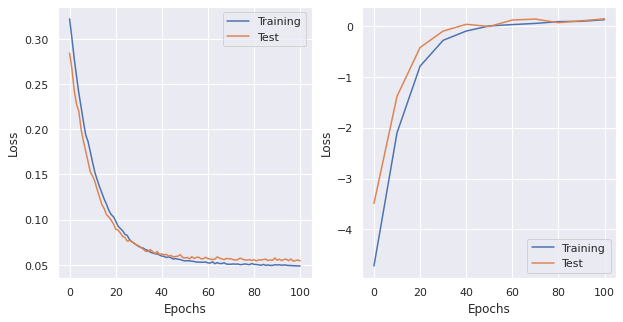

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.1074. Test R^2: -3.7557. Loss Train: 0.3182. Loss Val: 0.2856. Time: 7.3980
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8991. Test R^2: -1.1995. Loss Train: 0.1547. Loss Val: 0.1357. Time: 7.2990
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6601. Test R^2: -0.3364. Loss Train: 0.0899. Loss Val: 0.0851. Time: 7.4499
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2462. Test R^2: -0.0488. Loss Train: 0.0670. Loss Val: 0.0664. Time: 7.5826
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0605. Test R^2: 0.0408. Loss Train: 0.0575. Loss Val: 0.05

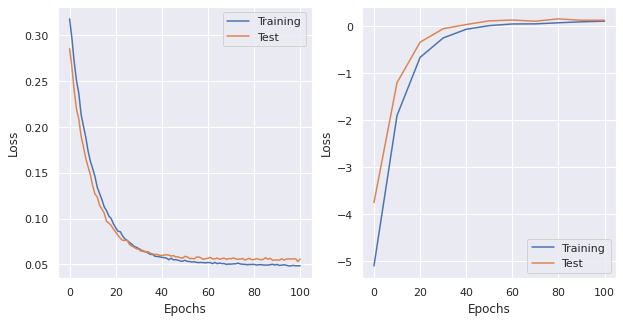

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.1352. Test R^2: -3.4239. Loss Train: 0.3253. Loss Val: 0.2817. Time: 7.1382
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7560. Test R^2: -1.2009. Loss Train: 0.1527. Loss Val: 0.1379. Time: 7.5347
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6658. Test R^2: -0.3213. Loss Train: 0.0901. Loss Val: 0.0835. Time: 7.3229
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2228. Test R^2: -0.0507. Loss Train: 0.0666. Loss Val: 0.0681. Time: 7.3536
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0352. Test R^2: 0.0626. Loss Train: 0.0573. Loss Val: 0

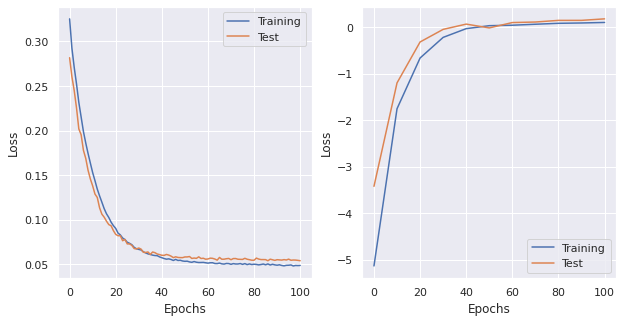

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8731. Test R^2: -3.8020. Loss Train: 0.3185. Loss Val: 0.2820. Time: 7.6358
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7373. Test R^2: -1.2561. Loss Train: 0.1506. Loss Val: 0.1328. Time: 7.4963
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6446. Test R^2: -0.3861. Loss Train: 0.0898. Loss Val: 0.0846. Time: 7.7015
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2091. Test R^2: -0.0083. Loss Train: 0.0670. Loss Val: 0.0653. Time: 7.3541
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0331. Test R^2: 0.0979. Loss Train: 0.0578. Loss Val: 0.0618. Ti

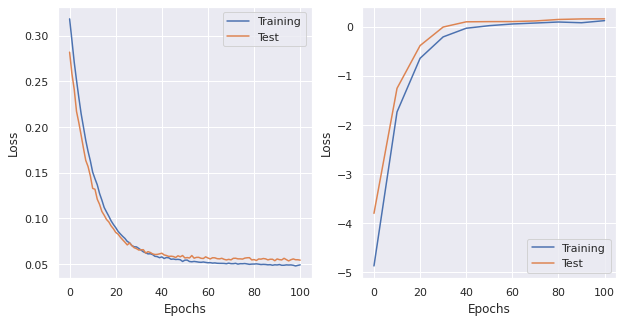

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9436. Test R^2: -3.6661. Loss Train: 0.3256. Loss Val: 0.2887. Time: 7.

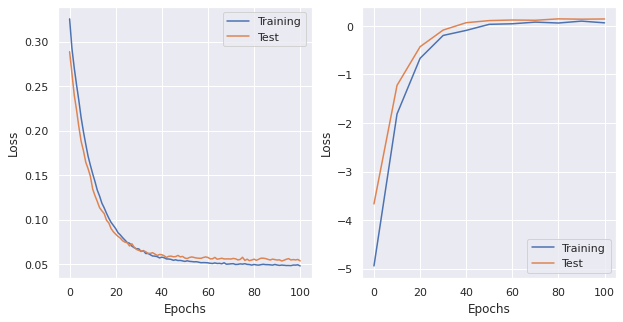

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8548. Test R^2: -3.5334. Loss Train: 0.3218. Loss Val: 0.2880. Time: 7.2801
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.9792. Test R^2: -1.3320. Loss Train: 0.1599. Loss Val: 0.1460. Time: 7.3193
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7861. Test R^2: -0.4547. Loss Train: 0.0979. Loss Val: 0.0905. Time: 7.0687
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.3234. Test R^2: -0.1316. Loss Train: 0.0710. Loss Val: 0.0705. Time: 7.4177
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0883. Test R^2: 0.0236. Loss Train: 0.0595. Loss Val: 0.061

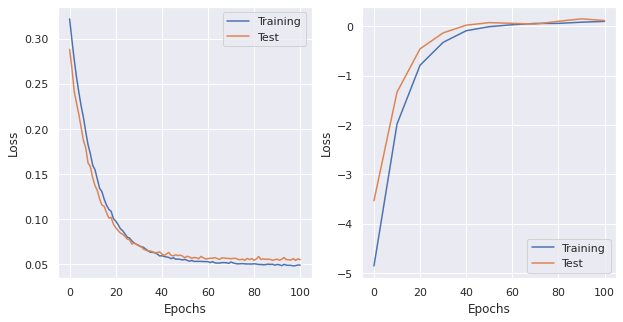

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9759. Test R^2: -4.3826. Loss Train: 0.3211. Loss Val: 0.2840. Time: 7.5928
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -2.0581. Test R^2: -1.1850. Loss Train: 0.1532. Loss Val: 0.1367. Time: 7.5680
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6408. Test R^2: -0.3302. Loss Train: 0.0895. Loss Val: 0.0869. Time: 7.5092
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2187. Test R^2: -0.0856. Loss Train: 0.0656. Loss Val: 0.0656. Time: 7.2291
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1127. Test R^2: 0.0626. Loss Train: 0.0567. Loss Val: 0

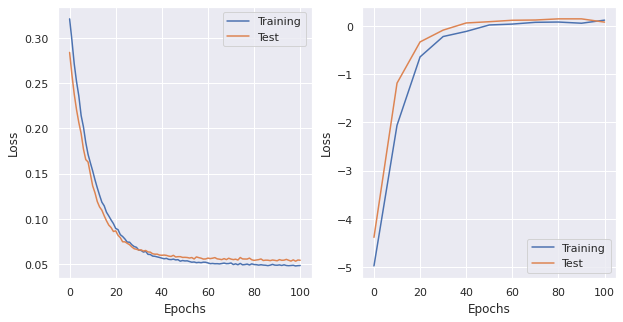

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0692. Test R^2: -3.6935. Loss Train: 0.3186. Loss Val: 0.2773. Time: 7.5738
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7374. Test R^2: -1.2346. Loss Train: 0.1509. Loss Val: 0.1373. Time: 7.6427
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7476. Test R^2: -0.3598. Loss Train: 0.0887. Loss Val: 0.0865. Time: 7.4685
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2032. Test R^2: -0.0356. Loss Train: 0.0663. Loss Val: 0.0659. Time: 7.3313
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1067. Test R^2: 0.0947. Loss Train: 0.0570. Loss Val

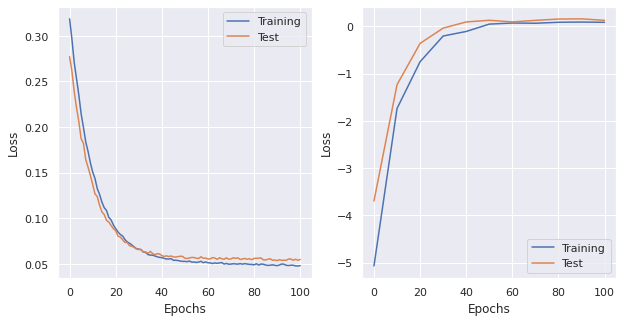

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8075. Test R^2: -3.8443. Loss Train: 0.3206. Loss Val: 0.2830. Time: 7.4384
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8532. Test R^2: -1.4621. Loss Train: 0.1503. Loss Val: 0.1370. Time: 7.5763
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6129. Test R^2: -0.3298. Loss Train: 0.0888. Loss Val: 0.0862. Time: 7.5485
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2311. Test R^2: -0.0158. Loss Train: 0.0660. Loss Val: 0.0651. Time: 7.5217
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0700. Test R^2: 0.0104. Loss Train: 0.0571. Loss Val: 0.0598.

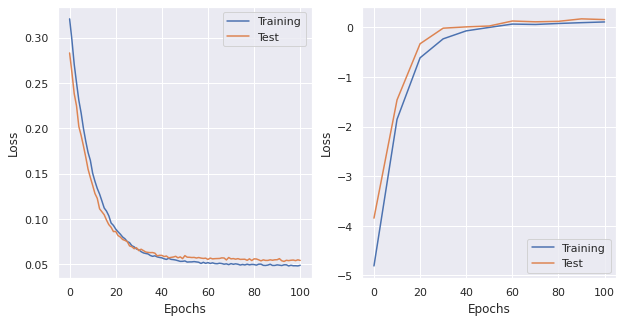

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8858. Test R^2: -3.4949. Loss Train: 0.3211. Loss Val: 0.2831. Ti

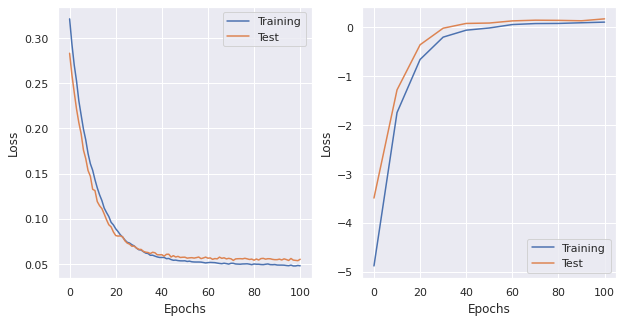

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8532. Test R^2: -3.5922. Loss Train: 0.3195. Loss Val: 0.2896. Time: 7.4659
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -2.0548. Test R^2: -1.3437. Loss Train: 0.1603. Loss Val: 0.1477. Time: 7.4860
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.8294. Test R^2: -0.5115. Loss Train: 0.0983. Loss Val: 0.0910. Time: 7.6204
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2956. Test R^2: -0.1115. Loss Train: 0.0709. Loss Val: 0.0705. Time: 7.2074
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1453. Test R^2: 0.0473. Loss Train: 0.0598. Loss Val: 0.

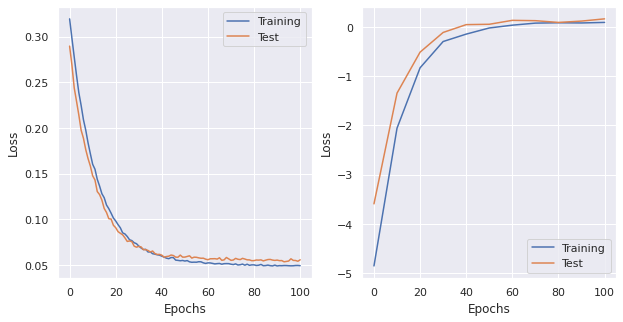

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0109. Test R^2: -3.3475. Loss Train: 0.3190. Loss Val: 0.2798. Time: 7.6917
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8241. Test R^2: -1.0987. Loss Train: 0.1557. Loss Val: 0.1373. Time: 7.5955
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6723. Test R^2: -0.3301. Loss Train: 0.0896. Loss Val: 0.0829. Time: 7.4053
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2104. Test R^2: -0.0225. Loss Train: 0.0660. Loss Val: 0.0681. Time: 7.6044
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0429. Test R^2: 0.0460. Loss Train: 0.0569. Loss Val

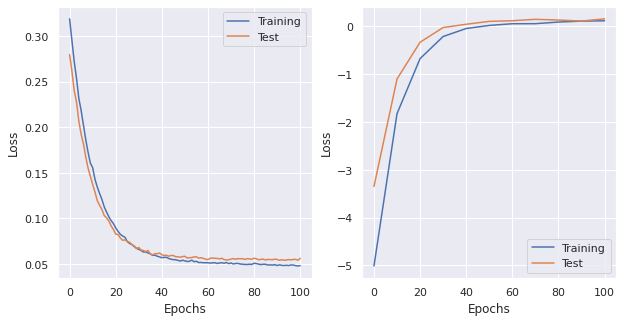

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.01
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.1386. Test R^2: -3.4866. Loss Train: 0.3208. Loss Val: 0.2786. Time: 7.2936
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7298. Test R^2: -1.2417. Loss Train: 0.1523. Loss Val: 0.1355. Time: 7.5138
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.5836. Test R^2: -0.3294. Loss Train: 0.0896. Loss Val: 0.0853. Time: 7.3663
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1977. Test R^2: -0.0287. Loss Train: 0.0662. Loss Val: 0.0646. Time: 7.2246
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0651. Test R^2: 0.0603. Loss Train: 0.0573. Loss 

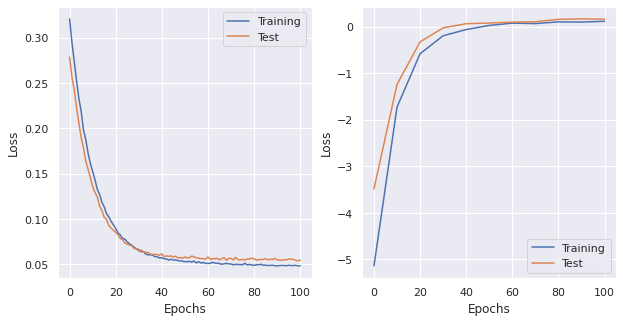

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.01
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8166. Test R^2: -3.4766. Loss Train: 0.3210. Loss Val: 0.2906. Time: 7.5267
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.9080. Test R^2: -1.3492. Loss Train: 0.1502. Loss Val: 0.1350. Time: 7.2141
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6318. Test R^2: -0.3928. Loss Train: 0.0896. Loss Val: 0.0838. Time: 7.5709
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2016. Test R^2: -0.0836. Loss Train: 0.0654. Loss Val: 0.0651. Time: 7.4261
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0931. Test R^2: 0.0727. Loss Train: 0.0569. Loss Val: 0.06

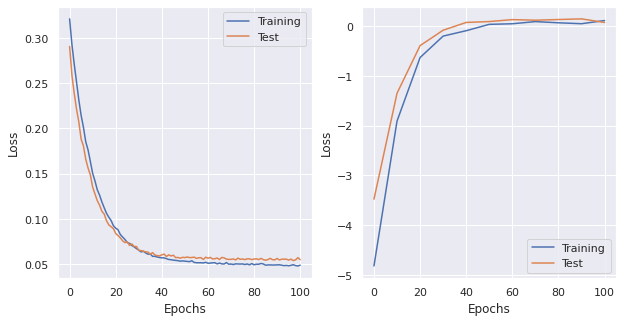

saving  ./plots/LogisticReg_lr0.0001_momentum0.01_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.01, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7449. Test R^2: -3.4384. Loss Train: 0.3214. Loss Val: 0.2826. Time

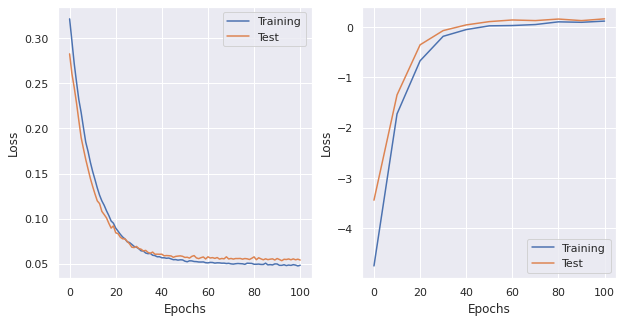

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8844. Test R^2: -3.5308. Loss Train: 0.3220. Loss Val: 0.2848. Time: 7.2868
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -2.0778. Test R^2: -1.4029. Loss Train: 0.1643. Loss Val: 0.1462. Time: 7.6619
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.8472. Test R^2: -0.5044. Loss Train: 0.0966. Loss Val: 0.0929. Time: 7.4926
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2791. Test R^2: -0.1524. Loss Train: 0.0716. Loss Val: 0.0696. Time: 7.5415
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1151. Test R^2: -0.0058. Loss Train: 0.0602. Loss Val: 0.0610. Ti

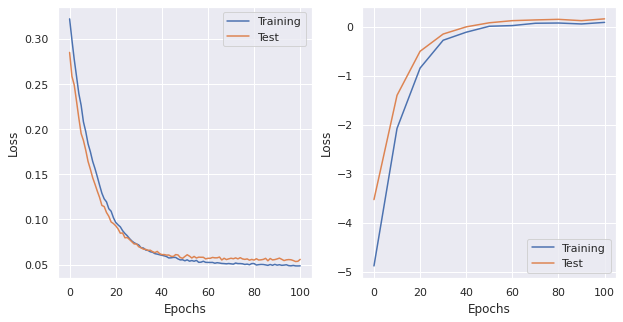

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8247. Test R^2: -3.4430. Loss Train: 0.3214. Loss Val: 0.2877. Time: 7.4936
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -2.0412. Test R^2: -1.2316. Loss Train: 0.1569. Loss Val: 0.1403. Time: 7.3046
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6948. Test R^2: -0.4220. Loss Train: 0.0920. Loss Val: 0.0854. Time: 7.5138
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2419. Test R^2: -0.0442. Loss Train: 0.0661. Loss Val: 0.0673. Time: 7.4225
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0721. Test R^2: 0.0710. Loss Train: 0.0566. Loss Val: 0.0587.

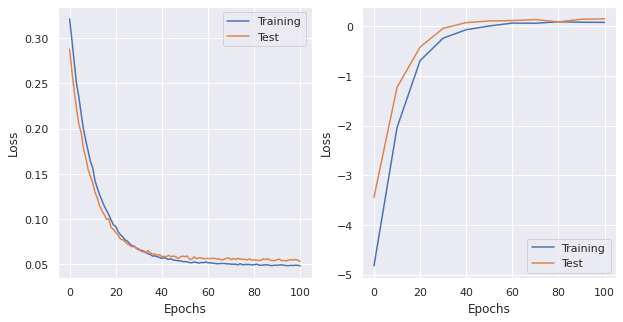

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.3381. Test R^2: -3.4779. Loss Train: 0.3198. Loss Val: 0.2822. Time: 7.4047
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.9779. Test R^2: -1.1158. Loss Train: 0.1533. Loss Val: 0.1376. Time: 7.5640
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6310. Test R^2: -0.3610. Loss Train: 0.0896. Loss Val: 0.0839. Time: 7.3032
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2161. Test R^2: -0.0674. Loss Train: 0.0677. Loss Val: 0.0688. Time: 7.4912
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0568. Test R^2: 0.0751. Loss Train: 0.0569. Loss Val: 0.05

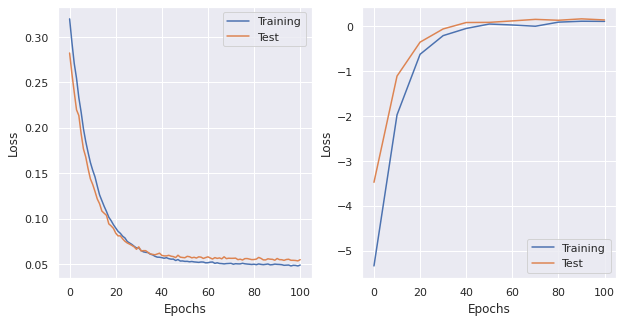

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: True
    weight_decay: 0
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9183. Test R^2: -3.6073. Loss Train: 0.3210. Loss Val: 0.2856. Time: 7.4594
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7325. Test R^2: -1.2010. Loss Train: 0.1524. Loss Val: 0.1368. Time: 7.2562
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7064. Test R^2: -0.3204. Loss Train: 0.0884. Loss Val: 0.0861. Time: 7.4795
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2113. Test R^2: -0.0772. Loss Train: 0.0662. Loss Val: 0.0663. Time: 7.6691
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0669. Test R^2: 0.0772. Loss Train: 0.0576. Loss Val: 0.0606. Time:

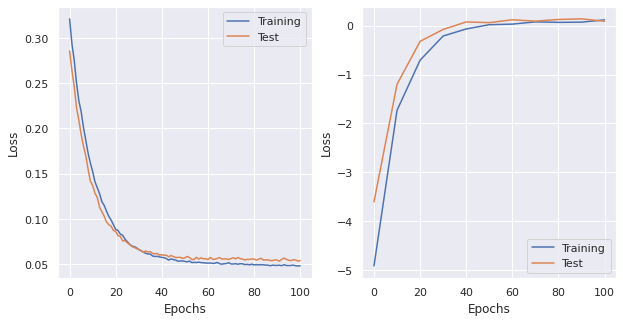

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9035. Test R^2: -3.3264. Loss Train: 0.3183. Loss Val: 0.2809. Time: 7.2246

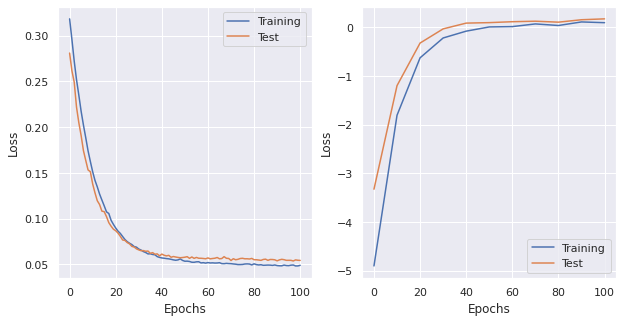

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.1_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7607. Test R^2: -3.4944. Loss Train: 0.3212. Loss Val: 0.2830. Time: 7.2492
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.9745. Test R^2: -1.3601. Loss Train: 0.1657. Loss Val: 0.1472. Time: 7.3774
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.8208. Test R^2: -0.4424. Loss Train: 0.0998. Loss Val: 0.0942. Time: 7.5220
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.3001. Test R^2: -0.1162. Loss Train: 0.0718. Loss Val: 0.0712. Time: 7.4479
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1111. Test R^2: 0.0584. Loss Train: 0.0604. Loss Val: 0.062

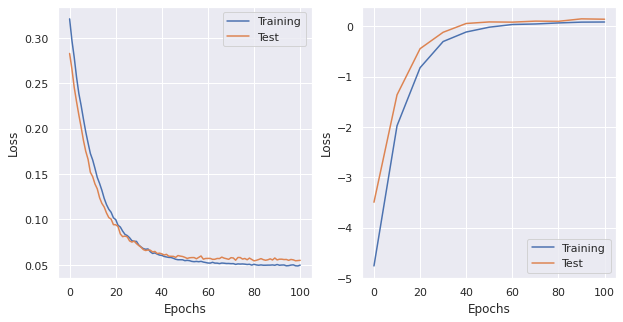

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.1_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8960. Test R^2: -3.5092. Loss Train: 0.3208. Loss Val: 0.2811. Time: 7.4286
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7587. Test R^2: -1.1459. Loss Train: 0.1538. Loss Val: 0.1379. Time: 7.4078
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6221. Test R^2: -0.3783. Loss Train: 0.0899. Loss Val: 0.0842. Time: 7.4946
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2200. Test R^2: -0.0519. Loss Train: 0.0670. Loss Val: 0.0679. Time: 7.5973
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0710. Test R^2: 0.0580. Loss Train: 0.0578. Loss Val: 0

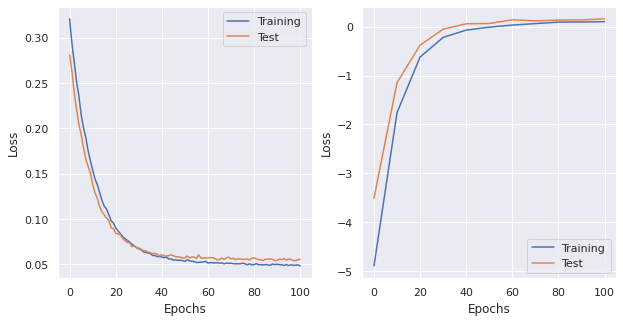

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.1_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9893. Test R^2: -3.9889. Loss Train: 0.3225. Loss Val: 0.2860. Time: 7.5243
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8042. Test R^2: -1.1016. Loss Train: 0.1520. Loss Val: 0.1365. Time: 7.4394
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6766. Test R^2: -0.3916. Loss Train: 0.0903. Loss Val: 0.0856. Time: 7.4406
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2149. Test R^2: -0.0419. Loss Train: 0.0681. Loss Val: 0.0661. Time: 7.6515
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0405. Test R^2: 0.0775. Loss Train: 0.0568. Loss Val

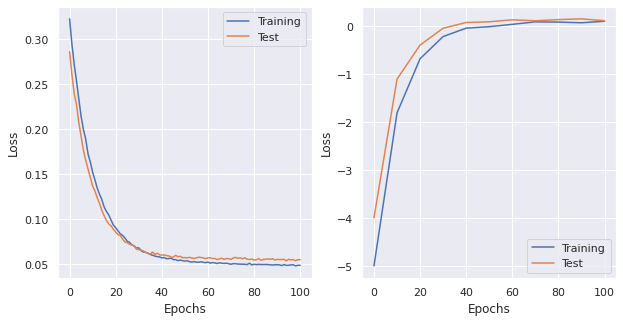

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.1_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: True
    weight_decay: 0.1
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9306. Test R^2: -3.6424. Loss Train: 0.3198. Loss Val: 0.2853. Time: 7.1618
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8155. Test R^2: -1.1683. Loss Train: 0.1532. Loss Val: 0.1390. Time: 7.6942
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6661. Test R^2: -0.3240. Loss Train: 0.0903. Loss Val: 0.0853. Time: 7.5055
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2430. Test R^2: -0.0276. Loss Train: 0.0669. Loss Val: 0.0660. Time: 7.7130
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0627. Test R^2: 0.0728. Loss Train: 0.0570. Loss Val: 0.0606.

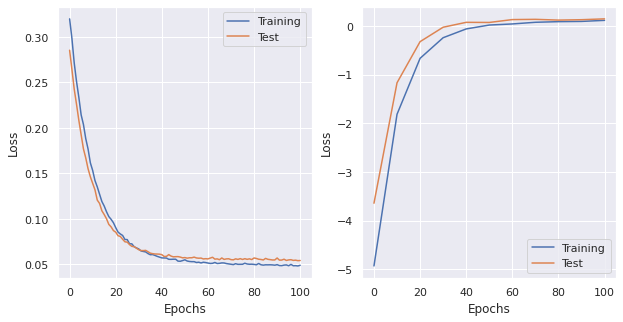

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.1_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.1, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9373. Test R^2: -3.5576. Loss Train: 0.3200. Loss Val: 0.2779. Ti

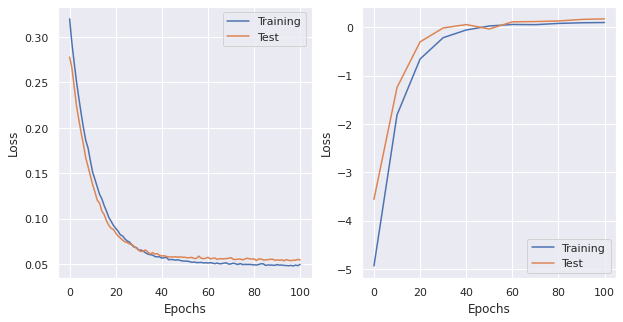

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.01_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8524. Test R^2: -4.1461. Loss Train: 0.3217. Loss Val: 0.2854. Time: 7.3499
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.9833. Test R^2: -1.4024. Loss Train: 0.1614. Loss Val: 0.1434. Time: 7.6136
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.8089. Test R^2: -0.4914. Loss Train: 0.0974. Loss Val: 0.0918. Time: 7.5879
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2736. Test R^2: -0.1213. Loss Train: 0.0725. Loss Val: 0.0722. Time: 7.6097
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0716. Test R^2: -0.0138. Loss Train: 0.0594. Loss Val: 0

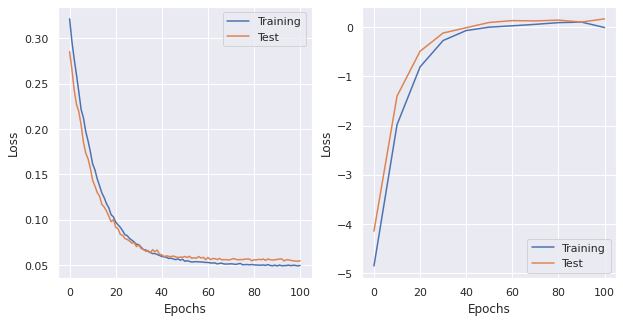

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.01_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.1389. Test R^2: -3.6769. Loss Train: 0.3201. Loss Val: 0.2878. Time: 7.2581
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7461. Test R^2: -1.2087. Loss Train: 0.1539. Loss Val: 0.1363. Time: 7.5776
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6426. Test R^2: -0.3230. Loss Train: 0.0904. Loss Val: 0.0861. Time: 7.5828
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2582. Test R^2: -0.0304. Loss Train: 0.0675. Loss Val: 0.0673. Time: 7.5298
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0392. Test R^2: 0.0855. Loss Train: 0.0568. Loss Val

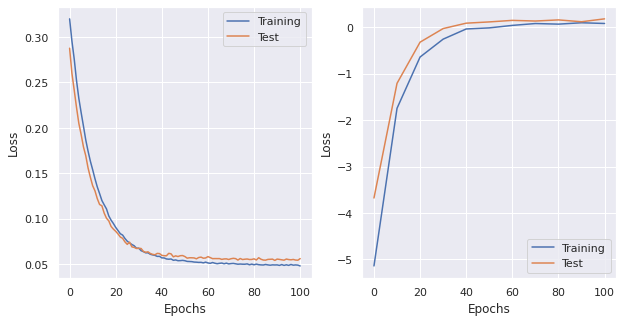

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.01_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9284. Test R^2: -3.5037. Loss Train: 0.3221. Loss Val: 0.2803. Time: 7.6882
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8970. Test R^2: -1.1196. Loss Train: 0.1526. Loss Val: 0.1354. Time: 7.1915
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6875. Test R^2: -0.4156. Loss Train: 0.0887. Loss Val: 0.0845. Time: 7.5446
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2192. Test R^2: -0.0319. Loss Train: 0.0654. Loss Val: 0.0656. Time: 7.3981
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0773. Test R^2: 0.0280. Loss Train: 0.0574. Loss 

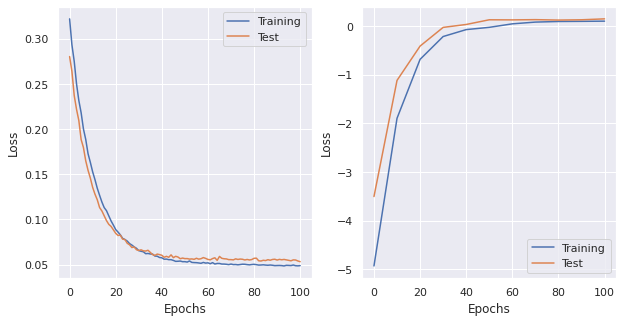

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.01_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: True
    weight_decay: 0.01
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.9206. Test R^2: -3.6115. Loss Train: 0.3196. Loss Val: 0.2873. Time: 7.6105
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8623. Test R^2: -1.2655. Loss Train: 0.1514. Loss Val: 0.1363. Time: 6.9648
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6679. Test R^2: -0.3579. Loss Train: 0.0908. Loss Val: 0.0848. Time: 7.4375
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.1956. Test R^2: -0.0219. Loss Train: 0.0659. Loss Val: 0.0672. Time: 7.4255
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0353. Test R^2: 0.0463. Loss Train: 0.0567. Loss Val: 0.05

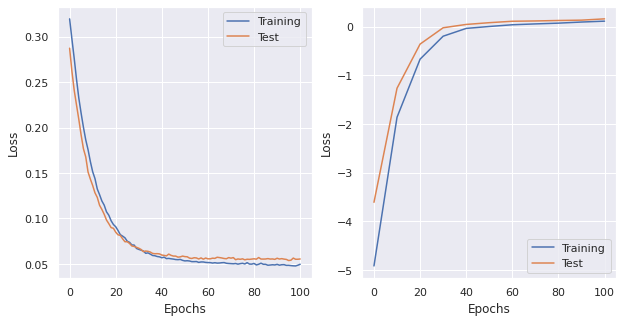

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.01_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.01, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.7753. Test R^2: -3.5028. Loss Train: 0.3212. Loss Val: 0.28

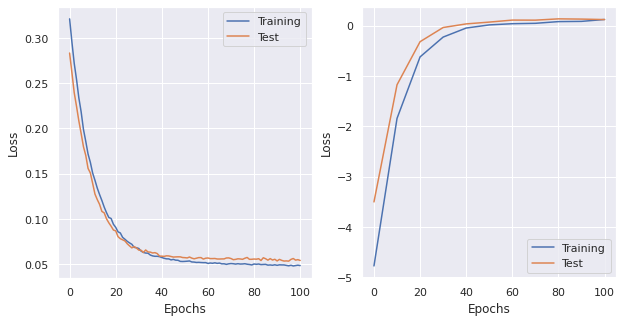

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0.1, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.1
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -4.8514. Test R^2: -3.7173. Loss Train: 0.3205. Loss Val: 0.2901. Time: 7.3930
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -2.2423. Test R^2: -1.3285. Loss Train: 0.1639. Loss Val: 0.1445. Time: 7.2203
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.7931. Test R^2: -0.5249. Loss Train: 0.0978. Loss Val: 0.0919. Time: 7.4192
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2925. Test R^2: -0.0811. Loss Train: 0.0708. Loss Val: 0.0716. Time: 7.5460
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.1090. Test R^2: 0.0015. Loss Train: 0.0596. Loss Val:

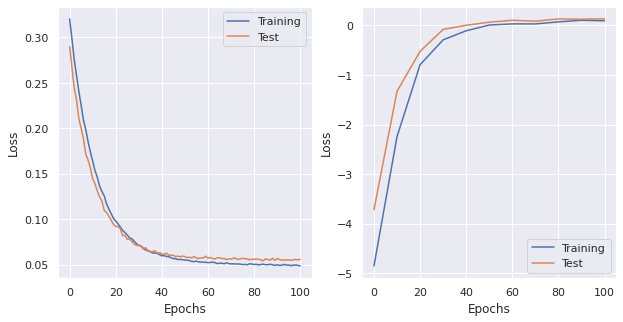

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.001_dampening0.1_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0.01, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.01
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.5433. Test R^2: -3.7115. Loss Train: 0.3206. Loss Val: 0.2772. Time: 7.7791
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8002. Test R^2: -1.1924. Loss Train: 0.1535. Loss Val: 0.1401. Time: 7.6297
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6730. Test R^2: -0.3550. Loss Train: 0.0904. Loss Val: 0.0842. Time: 7.3077
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2392. Test R^2: -0.0222. Loss Train: 0.0657. Loss Val: 0.0655. Time: 7.5399
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0616. Test R^2: 0.0659. Loss Train: 0.0575. Loss 

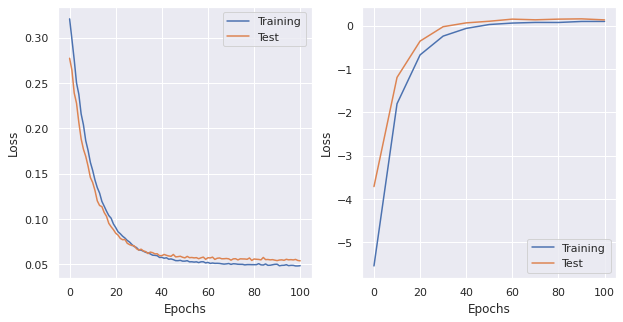

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.001_dampening0.01_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0.001, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0.001
    lr: 0.0001
    momentum: 0.001
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0334. Test R^2: -3.6719. Loss Train: 0.3204. Loss Val: 0.2876. Time: 7.7495
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.7992. Test R^2: -1.1482. Loss Train: 0.1527. Loss Val: 0.1379. Time: 7.3442
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6604. Test R^2: -0.3607. Loss Train: 0.0900. Loss Val: 0.0856. Time: 7.5273
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2660. Test R^2: -0.0449. Loss Train: 0.0662. Loss Val: 0.0651. Time: 7.7895
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0330. Test R^2: 0.0832. Loss Train: 0.0578. Lo

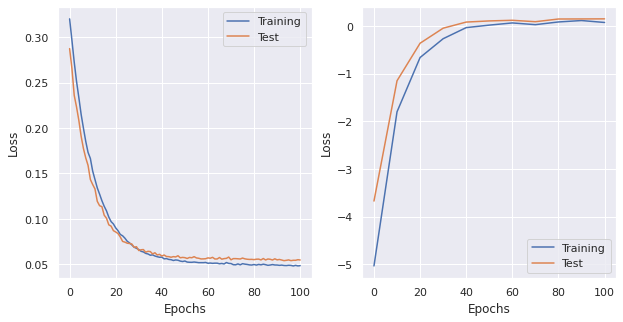

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.001_dampening0.001_nesterovFalse.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.0001
    momentum: 0.001
    nesterov: True
    weight_decay: 0.001
)
n. of epochs: 100
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -5.0363. Test R^2: -3.5296. Loss Train: 0.3191. Loss Val: 0.2883. Time: 7.6317
 EPOCH 10. Progress: 10.0%. 
 Training R^2: -1.8542. Test R^2: -1.2620. Loss Train: 0.1523. Loss Val: 0.1351. Time: 7.2565
 EPOCH 20. Progress: 20.0%. 
 Training R^2: -0.6857. Test R^2: -0.3411. Loss Train: 0.0890. Loss Val: 0.0844. Time: 7.4802
 EPOCH 30. Progress: 30.0%. 
 Training R^2: -0.2220. Test R^2: -0.0618. Loss Train: 0.0651. Loss Val: 0.0658. Time: 7.4721
 EPOCH 40. Progress: 40.0%. 
 Training R^2: -0.0314. Test R^2: 0.0851. Loss Train: 0.0568. Loss Val: 0

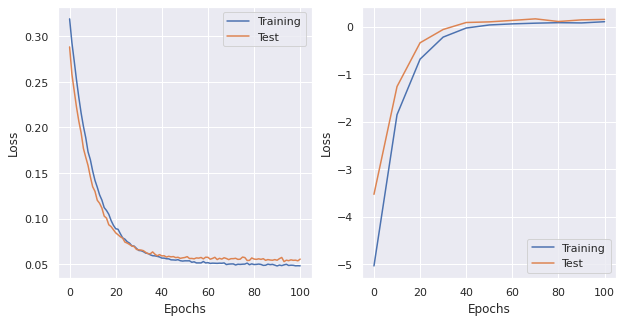

saving  ./plots/LogisticReg_lr0.0001_momentum0.001_wdecay0.001_dampening0_nesterovTrue.png

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0.1, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0.01, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)

lr: 0.0001, momentum: 0.001, weight_decay: 0.001, dampening: 0.001, nesterov: True 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)


In [56]:
lr_range = [0.01, 0.001,0.0001]
weight_decay_range = [0,0.1,0.01,0.001]
momentum_range = [0,0.1,0.01,0.001]
dampening_range = [0,0.1,0.01,0.001]
nesterov_range = [False, True]
for lr in lr_range:
    for momentum in momentum_range:
        for weight_decay in weight_decay_range:
            for nesterov in nesterov_range:
                for dampening in dampening_range:
                    try: 
                        print('\nlr: {}, momentum: {}, weight_decay: {}, dampening: {}, nesterov: {} '.format(lr, momentum, weight_decay, dampening, nesterov))
                        model = LogisticRegression(in_dim=47,out_dim=1, verbose=False).to(device)
                        print(model)
                        SGD = torch.optim.SGD(model.parameters(), lr = lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay, nesterov=nesterov) # This is absurdly high.
                        # initialize the loss function. You don't want to use this one, so change it accordingly
                        loss_fn = nn.MSELoss()
                        config_str = 'lr' + str(lr) + '_momentum' + str(momentum) + '_wdecay' + str(weight_decay) + '_dampening' + str(dampening) +'_nesterov' + str(nesterov)
                        train(model,loss_fn, SGD, dataloaders['train'], dataloaders['val'], config_str,num_epochs=100, verbose=False)
                    except:
                        pass


lr: 0.01, momentum: 0.1, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.1
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1192. Test R^2: 0.1438. Loss Train: 0.0798. Loss Val: 0.0551. Time: 7.6496
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.4092. Test R^2: 0.3113. Loss Train: 0.0323. Loss Val: 0.0415. Time: 7.6106
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.4245. Test R^2: 0.3666. Loss Train: 0.0301. Loss Val: 0.0406. Time: 7.5981
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.4684. Test R^2: 0.3743. Loss Train: 0.0286. Loss Val: 0.0399. Time: 7.6126
 EPOCH 40. Progress: 8.0%. 
 Training R^2: 0.4538. Test R^2: 0.4014. Loss Train: 0.0297. Loss Val: 0.0378. Time: 7.6407
 EPOCH 50. Progress: 10.0%. 
 Training R^2: 0.4973. Test R^2: 0.4148. Loss Train: 0.0279. Loss 

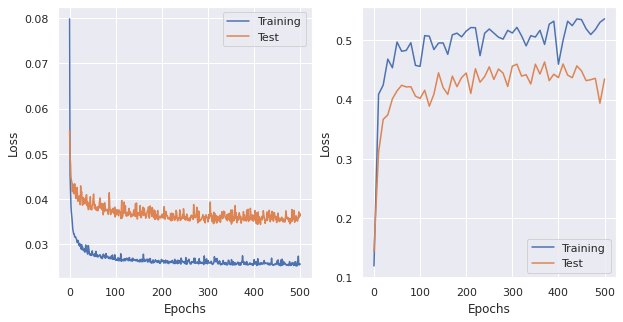

saving  ./plots/LogisticReg_lr0.01LONGER_momentum0.1_wdecay0.001_dampening0_nesterovFalse.png

lr: 0.01, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
LogisticRegression(
  (fc1): Linear(in_features=47, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1364. Test R^2: 0.0447. Loss Train: 0.0993. Loss Val: 0.0588. Time: 7.5962
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.4970. Test R^2: 0.4324. Loss Train: 0.0276. Loss Val: 0.0362. Time: 7.9951
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.5006. Test R^2: 0.4297. Loss Train: 0.0278. Loss Val: 0.0366. Time: 7.6117
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.5236. Test R^2: 0.4355. Loss Train: 0.0264. Loss Val: 0.0362. Time: 7.6831
 EPOCH 40. Progress: 8.0%. 
 Training R^2: 0.5114. Test R^2: 0.4015. Loss Train: 0.0261. Loss Val: 0.0363. Time: 7.5563
 

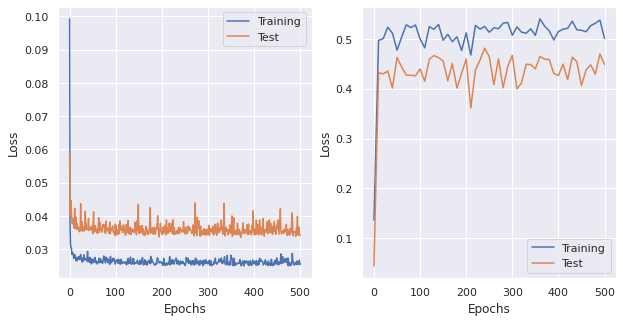

saving  ./plots/LogisticReg_lr0.01LONGER_momentum0.9_wdecay0.001_dampening0_nesterovFalse.png


In [11]:
# Best configuration for longer
lr_range = [0.01]
weight_decay_range = [0.001]
momentum_range = [0.1,0.9]
dampening_range = [0]
nesterov_range = [False]
for lr in lr_range:
    for momentum in momentum_range:
        for weight_decay in weight_decay_range:
            for nesterov in nesterov_range:
                for dampening in dampening_range:
                    try: 
                        print('\nlr: {}, momentum: {}, weight_decay: {}, dampening: {}, nesterov: {} '.format(lr, momentum, weight_decay, dampening, nesterov))
                        model = LogisticRegression(in_dim=47,out_dim=1, verbose=False).to(device)
                        print(model)
                        SGD = torch.optim.SGD(model.parameters(), lr = lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay, nesterov=nesterov) # This is absurdly high.
                        # initialize the loss function. You don't want to use this one, so change it accordingly
                        loss_fn = nn.MSELoss()
                        config_str = 'lr' + str(lr) + 'LONGER_momentum' + str(momentum) + '_wdecay' + str(weight_decay) + '_dampening' + str(dampening) +'_nesterov' + str(nesterov)
                        train(model,loss_fn, SGD, dataloaders['train'], dataloaders['val'], config_str,num_epochs=500, verbose=False)
                    except:
                        pass

In [12]:
# Test
with torch.no_grad():
    data, targets_val = next(iter(dataloaders['all_val']))
    model_input = data.to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
    predicted_val = model(model_input).squeeze()
#         _, predicted = torch.max(out, 1)
    print('predicted.shape: {}'.format(predicted_val.shape))
    print('predicted[:20]: \t{}'.format(predicted_val[:20]))
    print('targets[:20]: \t\t{}'.format(targets_val[:20]))
    
# Test
with torch.no_grad():
    data, targets = next(iter(dataloaders['test']))
    model_input = data.to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
    predicted = model(model_input).squeeze()
    print('predicted.shape: {}'.format(predicted.shape))
    print('predicted[:20]: \t{}'.format(predicted[:20]))
    print('targets[:20]: \t\t{}'.format(targets[:20]))

predicted.shape: torch.Size([335])
predicted[:20]: 	tensor([0.6520, 0.5846, 0.7047, 0.5652, 0.3333, 0.7314, 0.6623, 0.2488, 0.5731,
        0.5455, 0.6631, 0.5983, 0.4787, 0.3628, 0.4935, 0.5051, 0.5367, 0.5725,
        0.5631, 0.8214], device='cuda:0')
targets[:20]: 		tensor([0.5946, 0.6316, 0.6443, 0.4301, 0.3525, 0.7827, 0.6487, 0.2407, 0.7323,
        0.4208, 0.7470, 0.4549, 0.4040, 0.4320, 0.4034, 0.5106, 0.9261, 0.3739,
        0.4674, 0.8118])
predicted.shape: torch.Size([1118])
predicted[:20]: 	tensor([0.3378, 0.3503, 0.6561, 0.3751, 0.3553, 0.4513, 0.3983, 0.4662, 0.5686,
        0.5370, 0.5402, 0.5570, 0.6024, 0.5959, 0.5955, 0.5958, 0.5958, 0.5971,
        0.6077, 0.5454], device='cuda:0')
targets[:20]: 		tensor([0.0280, 0.1301, 0.2970, 0.2207, 0.2648, 0.3342, 0.2873, 0.3362, 0.6023,
        0.5031, 0.5335, 0.6247, 0.5454, 0.4926, 0.4442, 0.5030, 0.5472, 0.5128,
        0.5702, 0.5017])


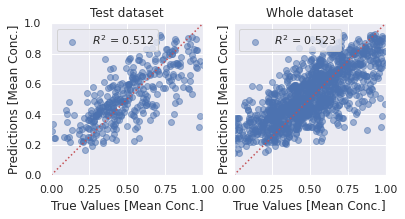

In [14]:
#Time for a real test
path_to_save = './plots'
if not os.path.exists(path_to_save):
    os.makedirs(path_to_save)
        
fig, (ax1,ax2) = plt.subplots(1,2, sharey=True)
# test_predictions = model(normed_test_data).flatten()
r = r2_score(targets_val, predicted_val.cpu())
ax1.scatter(targets_val, predicted_val.cpu(),alpha=0.5, label='$R^2$ = %.3f' % (r))
ax1.legend(loc="upper left")
ax1.set_xlabel('True Values [Mean Conc.]')
ax1.set_ylabel('Predictions [Mean Conc.]')
ax1.axis('equal')
ax1.axis('square')
ax1.set_xlim([0,1])
ax1.set_ylim([0,1])
_ = ax1.plot([-100, 100], [-100, 100], 'r:')
ax1.set_title('Test dataset')
f.set_figheight(30)
f.set_figwidth(10)
#plt.show()
#plt.close('all')

#Whole dataset
# dataset_predictions = model.predict(normed_dataset).flatten()
r = r2_score(targets, predicted.cpu())
ax2.scatter(targets, predicted.cpu(), alpha=0.5, label='$R^2$ = %.3f' % (r))
ax2.legend(loc="upper left")
ax2.set_xlabel('True Values [Mean Conc.]')
ax2.set_ylabel('Predictions [Mean Conc.]')
ax2.axis('equal')
ax2.axis('square')
ax2.set_xlim([0,1])
ax2.set_ylim([0,1])
_ = ax2.plot([-100, 100], [-100, 100], 'r:')
ax2.set_title('Whole dataset')
# plt.show()
fig.savefig(os.path.join(path_to_save, 'LogisticReg_LONGER_R2Score_' + config_str + '.png'), bbox_inches='tight')
# #plt.close('all')

In [16]:
# train(model,loss_fn, SGD, train_loader, test_loader)

## Question 2.2.1

__What percentage classification accuracy did your simple network achieve?__

As we can see in the results above, the accuracy achieved by the network with learning rate = 0.5 was 82.42% (test dataset). However, better accuracy was achieved by changing the learning rate to 0.01 (84.06%) or 0.001 (83.78%). Samples of digit prediction can be seen on the displays above

## Section 2.3

In [15]:
class FeedForwardNet(nn.Module):
    def __init__(self, in_dim,hid_dim,out_dim,verbose=False):
        super(FeedForwardNet, self).__init__()
        # Linear function
        self.fc1 = nn.Linear(in_dim, hid_dim)
        self.fc2 = nn.Linear(hid_dim, out_dim)

    def forward(self, x):
        # Linear function
        out = self.fc1(x)
        out = self.fc2(out)
        return out


lr: 0.001, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedForwardNet(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -0.2709. Test R^2: -0.4466. Loss Train: 0.1462. Loss Val: 0.0930. Time: 7.4865
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.3884. Test R^2: 0.3331. Loss Train: 0.0329. Loss Val: 0.0428. Time: 7.7301
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.4347. Test R^2: 0.3520. Loss Train: 0.0305. Loss Val: 0.0410. Time: 7.6968
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.4521. Test R^2: 0.3507. Loss Train: 0.0292. Loss Val: 0.0400. Time: 7.6256
 EPOCH 40. Progress: 8.0%. 
 Training R^2: 0.4327. Test R^2: 0.4065. Loss Train: 0.0290. Loss Val: 0.0398. Time: 8.0546
 EPOCH 50. Progress: 10.0%. 
 Train

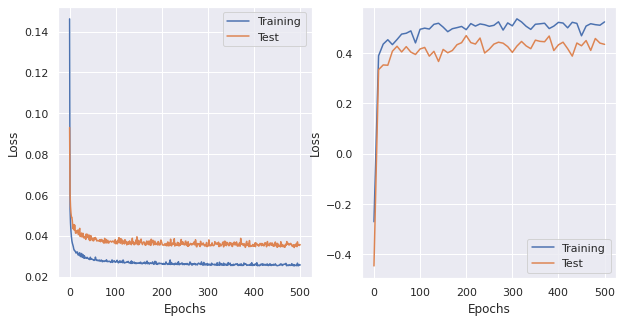

saving  ./plots/LogisticReg_lr0.001FFNet_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png

lr: 0.001, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedForwardNet(
  (fc1): Linear(in_features=47, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0829. Test R^2: 0.1862. Loss Train: 0.0662. Loss Val: 0.0508. Time: 7.6990
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.3700. Test R^2: 0.2979. Loss Train: 0.0334. Loss Val: 0.0447. Time: 7.5488
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.4276. Test R^2: 0.3557. Loss Train: 0.0309. Loss Val: 0.0422. Time: 7.2906
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.4317. Test R^2: 0.3398. Loss Train: 0.0305. Loss Val: 0.0407. Time: 7.7249
 EPOCH 40. Progress: 8.0%. 
 Training R^2: 0.4462. T

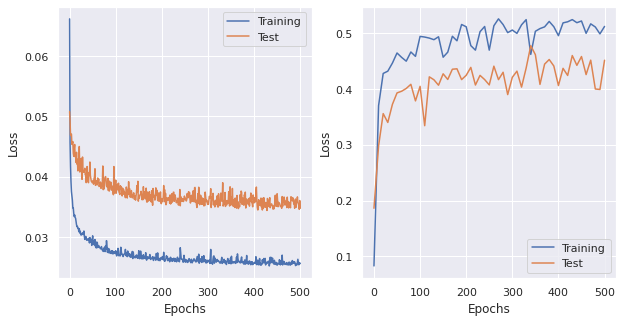

saving  ./plots/LogisticReg_lr0.001FFNet_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim128.png


In [17]:
# Best configuration for longer
lr_range = [0.001]
hid_dim_range = [64,128]
weight_decay_range = [0.001]
momentum_range = [0.9]
dampening_range = [0]
nesterov_range = [False]
for lr in lr_range:
    for momentum in momentum_range:
        for weight_decay in weight_decay_range:
            for nesterov in nesterov_range:
                for dampening in dampening_range:
                    for hid_dim in hid_dim_range:
                        try: 
                            print('\nlr: {}, momentum: {}, weight_decay: {}, dampening: {}, nesterov: {} '.format(lr, momentum, weight_decay, dampening, nesterov))
                            model = FeedForwardNet(in_dim=47,hid_dim=hid_dim, out_dim=1, verbose=False).to(device)
                            print(model)
                            SGD = torch.optim.SGD(model.parameters(), lr = lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay, nesterov=nesterov) # This is absurdly high.
                            # initialize the loss function. You don't want to use this one, so change it accordingly
                            loss_fn = nn.MSELoss()
                            config_str = 'lr' + str(lr) + 'FFNet_momentum' + str(momentum) + '_wdecay' + str(weight_decay) + '_dampening' + str(dampening) +'_nesterov' + str(nesterov) + '_HidDim' + str(hid_dim)
                            train(model,loss_fn, SGD, dataloaders['train'], dataloaders['val'], config_str,num_epochs=500, verbose=False)
                        except:
                            pass

In [18]:
# hid_dim_range = [128,256,512]
# lr_range = [0.5,0.1,0.01]
# print('FeedForwardNet - no non-linearity')
# for hid_dim in hid_dim_range:
#     for lr in lr_range:
#         print('\nhid_dim: {}, lr: {}'.format(hid_dim, lr))
#         if 'model' in globals():
#             print('Deleting previous model')
#             del model
#         model = FeedForwardNet(in_dim=784,hid_dim=hid_dim,out_dim=10,verbose=False).to(device)
#         SGD = torch.optim.SGD(model.parameters(), lr = lr) # This is absurdly high.
#         # initialize the loss function. You don't want to use this one, so change it accordingly
#         loss_fn = nn.CrossEntropyLoss().to(device)
#         train(model,loss_fn, SGD, train_loader, test_loader,verbose=False)

#         # Test
#         with torch.no_grad():
#             data, targets = next(iter(test_loader))
#             model_input = data.view(data.size(0),-1).to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
#             out = model(model_input)
#             _, predicted = torch.max(out, 1)
#             print('predicted[:20]: \t{}'.format(predicted[:20]))
#             print('targets[:20]: \t\t{}'.format(targets[:20]))
            
# # lr_range = [0.5,0.01,0.001]
# # print('FeedForwardNet - no non-linearity')
# # for lr in lr_range:
# #     print('\nlr: {}'.format(lr))
# #     model = FeedForwardNet(in_dim=784,hid_dim=128,out_dim=10,verbose=False)
# #     print(model)
# #     SGD = torch.optim.SGD(model.parameters(), lr = lr) # This is absurdly high.
# #     # initialize the loss function. You don't want to use this one, so change it accordingly
# #     loss_fn = nn.CrossEntropyLoss()
# #     train(model,loss_fn, SGD, train_loader, test_loader, verbose=False)

# #     # Test
# #     with torch.no_grad():
# #         data, targets = next(iter(test_loader))
# #         model_input = data.view(data.size(0),-1)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
# #         out = model(model_input)
# #         _, predicted = torch.max(out, 1)
# #         print('predicted[:20]: \t{}'.format(predicted[:20]))
# #         print('targets[:20]: \t\t{}'.format(targets[:20]))


lr: 0.1, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.1
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.0727. Test R^2: 0.1148. Loss Train: 0.1111. Loss Val: 0.0559. Time: 7.6555
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.5346. Test R^2: 0.4703. Loss Train: 0.0290. Loss Val: 0.0351. Time: 7.6737
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.3804. Test R^2: 0.3495. Loss Train: 0.0246. Loss Val: 0.0403. Time: 7.6011
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.5409. Test R^2: 0.4009. Loss Train: 0.0247. Loss Val: 0.0359. Time: 7.7135
 EPOCH 40. Progress: 8.0%. 
 Training R^2: 0.4728. Test R^2: 0.3904. Loss Train: 0.0250. Loss Val: 0.0376. Time: 7.4903
 EPOCH 50. Pr

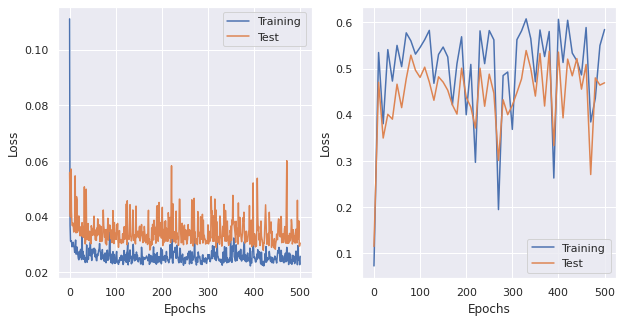

saving  ./plots/LogisticReg_lr0.1FFNet_ReLU_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png

lr: 0.1, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=128, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=128, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.1
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.3468. Test R^2: 0.3357. Loss Train: 0.0940. Loss Val: 0.0415. Time: 7.7581
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.4768. Test R^2: 0.3758. Loss Train: 0.0268. Loss Val: 0.0409. Time: 7.7153
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.5695. Test R^2: 0.4596. Loss Train: 0.0266. Loss Val: 0.0321. Time: 7.1329
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.1728. Test R^2: 0.2900. Loss Train: 0.0276. Loss Val: 0.0447. Time: 7.7023
 EPOCH 40. Progress: 8.0%

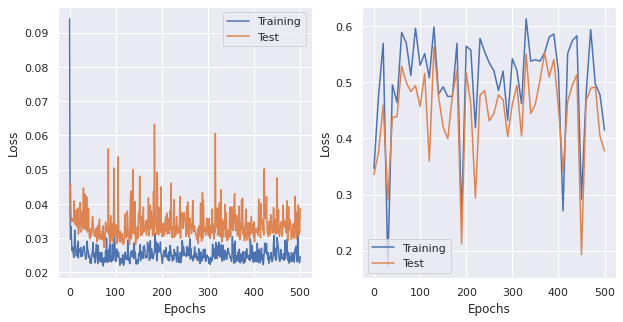

saving  ./plots/LogisticReg_lr0.1FFNet_ReLU_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim128.png

lr: 0.01, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1861. Test R^2: 0.2109. Loss Train: 0.0704. Loss Val: 0.0498. Time: 7.3735
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.3927. Test R^2: 0.3204. Loss Train: 0.0278. Loss Val: 0.0420. Time: 7.9096
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.5164. Test R^2: 0.4535. Loss Train: 0.0261. Loss Val: 0.0368. Time: 7.4185
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.5299. Test R^2: 0.4455. Loss Train: 0.0254. Loss Val: 0.0348. Time: 7.4349
 EPOCH 40. Progress: 8.0

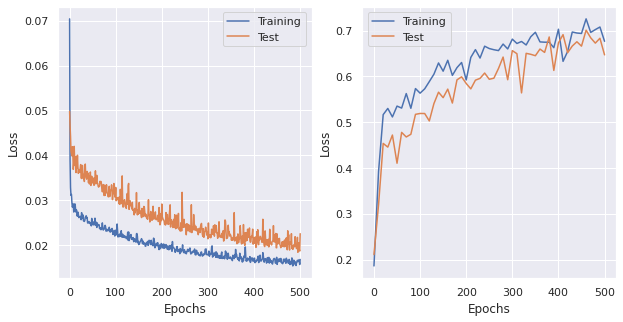

saving  ./plots/LogisticReg_lr0.01FFNet_ReLU_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png

lr: 0.01, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=128, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=128, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1463. Test R^2: 0.1346. Loss Train: 0.1110. Loss Val: 0.0545. Time: 7.8479
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.5102. Test R^2: 0.4368. Loss Train: 0.0272. Loss Val: 0.0370. Time: 7.4690
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.5120. Test R^2: 0.4010. Loss Train: 0.0257. Loss Val: 0.0351. Time: 7.8215
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.5245. Test R^2: 0.4538. Loss Train: 0.0257. Loss Val: 0.0342. Time: 7.4058
 EPOCH 40. Progress: 8

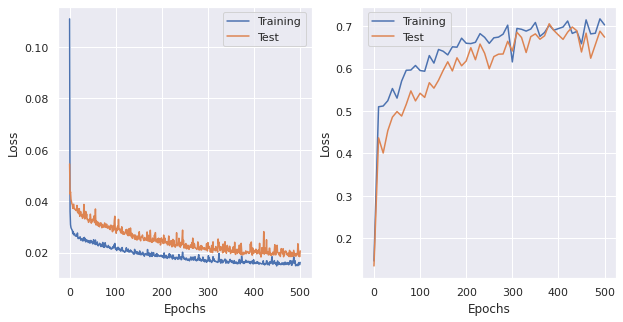

saving  ./plots/LogisticReg_lr0.01FFNet_ReLU_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim128.png


In [28]:
# Testing a regular FFnet
class FeedforwardNeuralNetModel(nn.Module):
    def __init__(self, in_dim, hid_dim, out_dim):
        super(FeedforwardNeuralNetModel, self).__init__()
        # Linear function
        self.fc1 = nn.Linear(in_dim, hid_dim) 
        # Non-linearity
        self.relu = nn.ReLU()
        # Linear function (readout)
        self.fc2 = nn.Linear(hid_dim, out_dim)  

    def forward(self, x):
        # Linear function
        out = self.fc1(x)
        # Non-linearity
        out = self.relu(out)
        # Linear function (readout)
        out = self.fc2(out)
        return out

# Best configuration for longer
lr_range = [0.1,0.01]
hid_dim_range = [64,128]
weight_decay_range = [0.001]
momentum_range = [0.9]
dampening_range = [0]
nesterov_range = [False]
for lr in lr_range:
    for momentum in momentum_range:
        for weight_decay in weight_decay_range:
            for nesterov in nesterov_range:
                for dampening in dampening_range:
                    for hid_dim in hid_dim_range:
#                         try: 
                        print('\nlr: {}, momentum: {}, weight_decay: {}, dampening: {}, nesterov: {} '.format(lr, momentum, weight_decay, dampening, nesterov))
                        model = FeedforwardNeuralNetModel(in_dim=47,hid_dim=hid_dim, out_dim=1).to(device)
                        print(model)
                        SGD = torch.optim.SGD(model.parameters(), lr = lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay, nesterov=nesterov) # This is absurdly high.
                        # initialize the loss function. You don't want to use this one, so change it accordingly
                        loss_fn = nn.MSELoss()
                        config_str = 'lr' + str(lr) + 'FFNet_ReLU_momentum' + str(momentum) + '_wdecay' + str(weight_decay) + '_dampening' + str(dampening) +'_nesterov' + str(nesterov) + '_HidDim' + str(hid_dim)
                        train(model,loss_fn, SGD, dataloaders['train'], dataloaders['val'], config_str,num_epochs=500, verbose=False)
#                         except:
#                             pass


lr: 0.01, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 1000
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.1114. Test R^2: 0.0701. Loss Train: 0.1178. Loss Val: 0.0560. Time: 7.7508
 EPOCH 10. Progress: 1.0%. 
 Training R^2: 0.4726. Test R^2: 0.3798. Loss Train: 0.0280. Loss Val: 0.0420. Time: 7.7404
 EPOCH 20. Progress: 2.0%. 
 Training R^2: 0.5102. Test R^2: 0.4166. Loss Train: 0.0260. Loss Val: 0.0353. Time: 7.6322
 EPOCH 30. Progress: 3.0%. 
 Training R^2: 0.5254. Test R^2: 0.4623. Loss Train: 0.0260. Loss Val: 0.0352. Time: 7.6232
 EPOCH 40. Progress: 4.0%. 
 Training R^2: 0.5518. Test R^2: 0.4913. Loss Train: 0.0249. Loss Val: 0.0338. Time: 7.6174
 EPOCH 50.

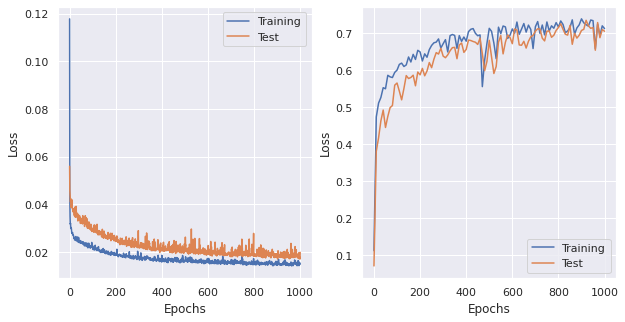

saving  ./plots/LONGER_FFNet_ReLU_lr0.01_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png


In [34]:
# Training the best for longer
# Testing a regular FFnet
class FeedforwardNeuralNetModel(nn.Module):
    def __init__(self, in_dim, hid_dim, out_dim):
        super(FeedforwardNeuralNetModel, self).__init__()
        # Linear function
        self.fc1 = nn.Linear(in_dim, hid_dim) 
        # Non-linearity
        self.relu = nn.ReLU()
        # Linear function (readout)
        self.fc2 = nn.Linear(hid_dim, out_dim)  

    def forward(self, x):
        # Linear function
        out = self.fc1(x)
        # Non-linearity
        out = self.relu(out)
        # Linear function (readout)
        out = self.fc2(out)
        return out

# Best configuration for longer
lr_range = [0.01]
hid_dim_range = [64]
weight_decay_range = [0.001]
momentum_range = [0.9]
dampening_range = [0]
nesterov_range = [False]
for lr in lr_range:
    for momentum in momentum_range:
        for weight_decay in weight_decay_range:
            for nesterov in nesterov_range:
                for dampening in dampening_range:
                    for hid_dim in hid_dim_range:
#                         try: 
                        print('\nlr: {}, momentum: {}, weight_decay: {}, dampening: {}, nesterov: {} '.format(lr, momentum, weight_decay, dampening, nesterov))
                        model = FeedforwardNeuralNetModel(in_dim=47,hid_dim=hid_dim, out_dim=1).to(device)
                        print(model)
                        SGD = torch.optim.SGD(model.parameters(), lr = lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay, nesterov=nesterov) # This is absurdly high.
                        # initialize the loss function. You don't want to use this one, so change it accordingly
                        loss_fn = nn.MSELoss()
                        config_str = 'LONGER_FFNet_ReLU_lr' + str(lr) + '_momentum' + str(momentum) + '_wdecay' + str(weight_decay) + '_dampening' + str(dampening) +'_nesterov' + str(nesterov) + '_HidDim' + str(hid_dim)
                        train(model,loss_fn, SGD, dataloaders['train'], dataloaders['val'], config_str,num_epochs=1000, verbose=False)
#                         except:
#                             pass

predicted.shape: torch.Size([335])
predicted[:20]: 	tensor([0.9134, 0.5872, 0.5416, 0.3574, 0.5957, 0.1936, 0.6270, 0.3637, 0.6762,
        0.4805, 0.2148, 0.3681, 0.5989, 0.5012, 0.5120, 0.4079, 0.4591, 0.6992,
        0.7181, 0.6576], device='cuda:0')
targets[:20]: 		tensor([0.9217, 0.9155, 0.5718, 0.4302, 0.5848, 0.3615, 0.5995, 0.4605, 0.8300,
        0.6352, 0.2376, 0.1772, 0.7141, 0.5454, 0.4968, 0.5447, 0.5573, 0.8372,
        0.9776, 0.7958])
predicted.shape: torch.Size([1118])
predicted[:20]: 	tensor([0.2095, 0.2015, 0.3405, 0.2351, 0.2122, 0.3416, 0.2617, 0.3581, 0.4553,
        0.4549, 0.4582, 0.4804, 0.5012, 0.4974, 0.5022, 0.5027, 0.5027, 0.5044,
        0.5106, 0.4500], device='cuda:0')
targets[:20]: 		tensor([0.0280, 0.1301, 0.2970, 0.2207, 0.2648, 0.3342, 0.2873, 0.3362, 0.6023,
        0.5031, 0.5335, 0.6247, 0.5454, 0.4926, 0.4442, 0.5030, 0.5472, 0.5128,
        0.5702, 0.5017])


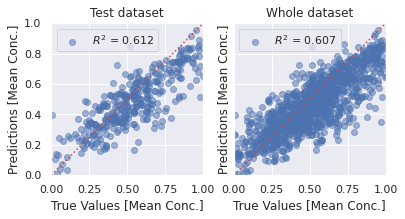

In [35]:
# Test
with torch.no_grad():
    data, targets_val = next(iter(dataloaders['all_val']))
    model_input = data.to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
    predicted_val = model(model_input).squeeze()
#         _, predicted = torch.max(out, 1)
    print('predicted.shape: {}'.format(predicted_val.shape))
    print('predicted[:20]: \t{}'.format(predicted_val[:20]))
    print('targets[:20]: \t\t{}'.format(targets_val[:20]))
    
# Test
with torch.no_grad():
    data, targets = next(iter(dataloaders['test']))
    model_input = data.to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
    predicted = model(model_input).squeeze()
    print('predicted.shape: {}'.format(predicted.shape))
    print('predicted[:20]: \t{}'.format(predicted[:20]))
    print('targets[:20]: \t\t{}'.format(targets[:20]))
    
#Time for a real test
path_to_save = './plots'
if not os.path.exists(path_to_save):
    os.makedirs(path_to_save)
        
fig, (ax1,ax2) = plt.subplots(1,2, sharey=True)
# test_predictions = model(normed_test_data).flatten()
r = r2_score(targets_val, predicted_val.cpu())
ax1.scatter(targets_val, predicted_val.cpu(),alpha=0.5, label='$R^2$ = %.3f' % (r))
ax1.legend(loc="upper left")
ax1.set_xlabel('True Values [Mean Conc.]')
ax1.set_ylabel('Predictions [Mean Conc.]')
ax1.axis('equal')
ax1.axis('square')
ax1.set_xlim([0,1])
ax1.set_ylim([0,1])
_ = ax1.plot([-100, 100], [-100, 100], 'r:')
ax1.set_title('Test dataset')
f.set_figheight(30)
f.set_figwidth(10)
#plt.show()
#plt.close('all')

#Whole dataset
# dataset_predictions = model.predict(normed_dataset).flatten()
r = r2_score(targets, predicted.cpu())
ax2.scatter(targets, predicted.cpu(), alpha=0.5, label='$R^2$ = %.3f' % (r))
ax2.legend(loc="upper left")
ax2.set_xlabel('True Values [Mean Conc.]')
ax2.set_ylabel('Predictions [Mean Conc.]')
ax2.axis('equal')
ax2.axis('square')
ax2.set_xlim([0,1])
ax2.set_ylim([0,1])
_ = ax2.plot([-100, 100], [-100, 100], 'r:')
ax2.set_title('Whole dataset')
# plt.show()
fig.savefig(os.path.join(path_to_save, 'FFNet_LONGER_R2Score_' + config_str + '.png'), bbox_inches='tight')
# #plt.close('all')


lr: 0.01, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.01
    weight_decay: 0
)
n. of epochs: 1000
 EPOCH 0. Progress: 0.0%. 
 Training R^2: 0.4276. Test R^2: 0.3267. Loss Train: 0.0555. Loss Val: 0.0432. Time: 7.8019
 EPOCH 10. Progress: 1.0%. 
 Training R^2: 0.4201. Test R^2: 0.3432. Loss Train: 0.0261. Loss Val: 0.0413. Time: 7.8847
 EPOCH 20. Progress: 2.0%. 
 Training R^2: 0.5374. Test R^2: 0.4975. Loss Train: 0.0236. Loss Val: 0.0320. Time: 7.6904
 EPOCH 30. Progress: 3.0%. 
 Training R^2: 0.5880. Test R^2: 0.5418. Loss Train: 0.0233. Loss Val: 0.0282. Time: 7.7256
 EPOCH 40. Progress: 4.0%. 
 Training R^2: 0.5423. Test R^2: 0.5385. Loss Train: 0.0219. Loss Val: 0.0288. Time: 8.2497
 EPOCH 50.

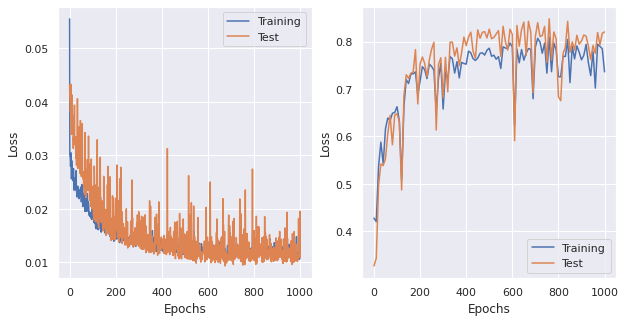

saving  ./plots/LONGER_ADAM_FFNet_ReLU_lr0.01_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png

lr: 0.001, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)
n. of epochs: 1000
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -0.0179. Test R^2: 0.0659. Loss Train: 0.1193. Loss Val: 0.0619. Time: 7.5650
 EPOCH 10. Progress: 1.0%. 
 Training R^2: 0.5003. Test R^2: 0.4397. Loss Train: 0.0264. Loss Val: 0.0360. Time: 7.5039
 EPOCH 20. Progress: 2.0%. 
 Training R^2: 0.5445. Test R^2: 0.4926. Loss Train: 0.0243. Loss Val: 0.0314. Time: 7.2738
 EPOCH 30. Progress: 3.0%. 
 Training R^2: 0.5678. Test R^2: 0.5043. Loss Train: 0.0231. Loss Val: 0.0321. Time: 7.6130
 EPOCH 40. Progress

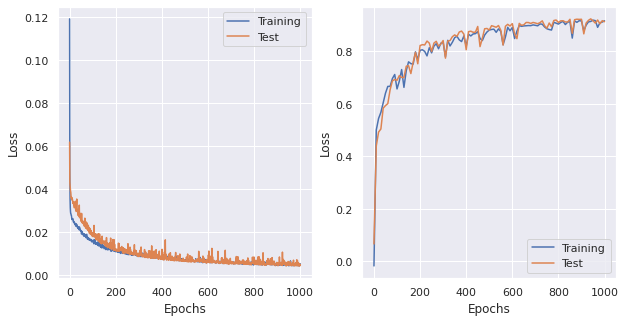

saving  ./plots/LONGER_ADAM_FFNet_ReLU_lr0.001_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png


In [36]:
# Trying ADAM
class FeedforwardNeuralNetModel(nn.Module):
    def __init__(self, in_dim, hid_dim, out_dim):
        super(FeedforwardNeuralNetModel, self).__init__()
        # Linear function
        self.fc1 = nn.Linear(in_dim, hid_dim) 
        # Non-linearity
        self.relu = nn.ReLU()
        # Linear function (readout)
        self.fc2 = nn.Linear(hid_dim, out_dim)  

    def forward(self, x):
        # Linear function
        out = self.fc1(x)
        # Non-linearity
        out = self.relu(out)
        # Linear function (readout)
        out = self.fc2(out)
        return out

# Best configuration for longer
lr_range = [0.01,0.001]
hid_dim_range = [64]
weight_decay_range = [0.001]
momentum_range = [0.9]
dampening_range = [0]
nesterov_range = [False]
for lr in lr_range:
    for hid_dim in hid_dim_range:
        print('\nlr: {}, momentum: {}, weight_decay: {}, dampening: {}, nesterov: {} '.format(lr, momentum, weight_decay, dampening, nesterov))
        model = FeedforwardNeuralNetModel(in_dim=47,hid_dim=hid_dim, out_dim=1).to(device)
        print(model)
        SGD = torch.optim.Adam(model.parameters(), lr = lr) # This is absurdly high.
        # initialize the loss function. You don't want to use this one, so change it accordingly
        loss_fn = nn.MSELoss().to(device)
        config_str = 'LONGER_ADAM_FFNet_ReLU_lr' + str(lr) + '_momentum' + str(momentum) + '_wdecay' + str(weight_decay) + '_dampening' + str(dampening) +'_nesterov' + str(nesterov) + '_HidDim' + str(hid_dim)
        train(model,loss_fn, SGD, dataloaders['train'], dataloaders['val'], config_str,num_epochs=1000, verbose=False)

predicted.shape: torch.Size([335])
predicted[:20]: 	tensor([0.4813, 0.0021, 0.3099, 0.5124, 0.4291, 0.4278, 0.1699, 0.3673, 0.9917,
        0.2446, 0.4156, 0.1808, 0.9327, 0.3106, 0.7442, 0.4967, 0.6678, 0.3727,
        0.3914, 0.7597], device='cuda:0')
targets[:20]: 		tensor([0.4751, 0.0745, 0.8673, 0.5059, 0.5109, 0.8643, 0.2712, 0.4034, 0.9510,
        0.2709, 0.3923, 0.2684, 0.9734, 0.3585, 0.8507, 0.5810, 0.5573, 0.4552,
        0.4137, 0.8530])
predicted.shape: torch.Size([1118])
predicted[:20]: 	tensor([0.0543, 0.1623, 0.2759, 0.1653, 0.1504, 0.2334, 0.2520, 0.3039, 0.5162,
        0.4897, 0.4926, 0.5586, 0.4551, 0.4644, 0.4826, 0.4849, 0.4849, 0.4874,
        0.5103, 0.4008], device='cuda:0')
targets[:20]: 		tensor([0.0280, 0.1301, 0.2970, 0.2207, 0.2648, 0.3342, 0.2873, 0.3362, 0.6023,
        0.5031, 0.5335, 0.6247, 0.5454, 0.4926, 0.4442, 0.5030, 0.5472, 0.5128,
        0.5702, 0.5017])


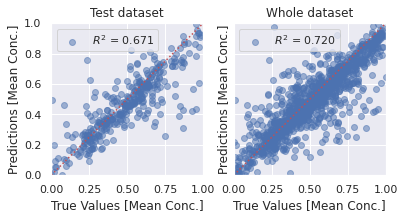

In [37]:
# Test
with torch.no_grad():
    data, targets_val = next(iter(dataloaders['all_val']))
    model_input = data.to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
    predicted_val = model(model_input).squeeze()
#         _, predicted = torch.max(out, 1)
    print('predicted.shape: {}'.format(predicted_val.shape))
    print('predicted[:20]: \t{}'.format(predicted_val[:20]))
    print('targets[:20]: \t\t{}'.format(targets_val[:20]))
    
# Test
with torch.no_grad():
    data, targets = next(iter(dataloaders['test']))
    model_input = data.to(device)# TODO: Turn the 28 by 28 image tensors into a 784 dimensional tensor.
    predicted = model(model_input).squeeze()
    print('predicted.shape: {}'.format(predicted.shape))
    print('predicted[:20]: \t{}'.format(predicted[:20]))
    print('targets[:20]: \t\t{}'.format(targets[:20]))
    
#Time for a real test
path_to_save = './plots'
if not os.path.exists(path_to_save):
    os.makedirs(path_to_save)
        
fig, (ax1,ax2) = plt.subplots(1,2, sharey=True)
# test_predictions = model(normed_test_data).flatten()
r = r2_score(targets_val, predicted_val.cpu())
ax1.scatter(targets_val, predicted_val.cpu(),alpha=0.5, label='$R^2$ = %.3f' % (r))
ax1.legend(loc="upper left")
ax1.set_xlabel('True Values [Mean Conc.]')
ax1.set_ylabel('Predictions [Mean Conc.]')
ax1.axis('equal')
ax1.axis('square')
ax1.set_xlim([0,1])
ax1.set_ylim([0,1])
_ = ax1.plot([-100, 100], [-100, 100], 'r:')
ax1.set_title('Test dataset')
f.set_figheight(30)
f.set_figwidth(10)
#plt.show()
#plt.close('all')

#Whole dataset
# dataset_predictions = model.predict(normed_dataset).flatten()
r = r2_score(targets, predicted.cpu())
ax2.scatter(targets, predicted.cpu(), alpha=0.5, label='$R^2$ = %.3f' % (r))
ax2.legend(loc="upper left")
ax2.set_xlabel('True Values [Mean Conc.]')
ax2.set_ylabel('Predictions [Mean Conc.]')
ax2.axis('equal')
ax2.axis('square')
ax2.set_xlim([0,1])
ax2.set_ylim([0,1])
_ = ax2.plot([-100, 100], [-100, 100], 'r:')
ax2.set_title('Whole dataset')
# plt.show()
fig.savefig(os.path.join(path_to_save, 'FFNet_ADAM_LONGER_R2Score_' + config_str + '.png'), bbox_inches='tight')
# #plt.close('all')


lr: 0.001, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (drop): Dropout(p=0.2, inplace=False)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -1.0673. Test R^2: -0.6219. Loss Train: 0.2637. Loss Val: 0.1010. Time: 7.8626
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.0216. Test R^2: 0.0600. Loss Train: 0.0513. Loss Val: 0.0599. Time: 7.6683
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.1402. Test R^2: 0.1438. Loss Train: 0.0471. Loss Val: 0.0572. Time: 7.5705
 EPOCH 30. Progress: 6.0%. 
 Training R^2: 0.1776. Test R^2: 0.1835. Loss Train: 0.0439. Loss Val: 0.0528. Time: 7.5889
 EPOCH 40. Progress: 8.0%. 

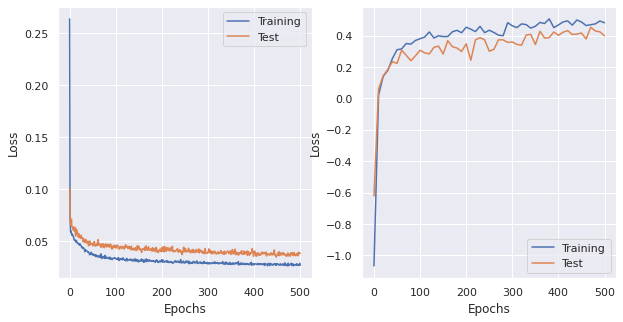

saving  ./plots/LogisticReg_lr0.001_3FFNet_2ReLU_Drop_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png

lr: 0.001, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=128, bias=True)
  (drop): Dropout(p=0.2, inplace=False)
  (relu): ReLU()
  (fc2): Linear(in_features=128, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.001
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -0.1505. Test R^2: -0.1059. Loss Train: 0.1836. Loss Val: 0.0708. Time: 7.5957
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.1314. Test R^2: 0.0870. Loss Train: 0.0477. Loss Val: 0.0561. Time: 8.0544
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.2536. Test R^2: 0.1974. Loss Train: 0.0404. Loss Val: 0.0494. Time: 7.5354
 EPOCH 30. Progress: 6.0%. 

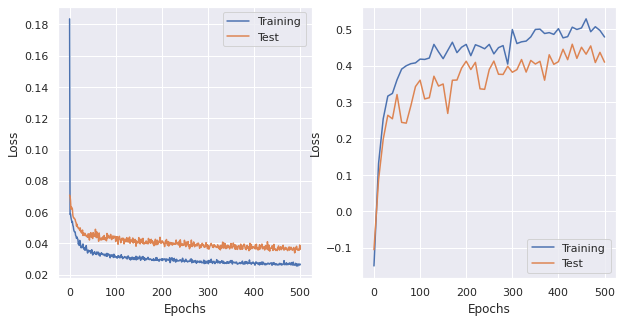

saving  ./plots/LogisticReg_lr0.001_3FFNet_2ReLU_Drop_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim128.png

lr: 0.01, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=64, bias=True)
  (drop): Dropout(p=0.2, inplace=False)
  (relu): ReLU()
  (fc2): Linear(in_features=64, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -0.1773. Test R^2: -0.0679. Loss Train: 0.1235. Loss Val: 0.0700. Time: 7.9721
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.3958. Test R^2: 0.3031. Loss Train: 0.0336. Loss Val: 0.0439. Time: 7.6630
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.4363. Test R^2: 0.3913. Loss Train: 0.0316. Loss Val: 0.0415. Time: 7.5239
 EPOCH 30. Progress: 6.0%. 
 Tra

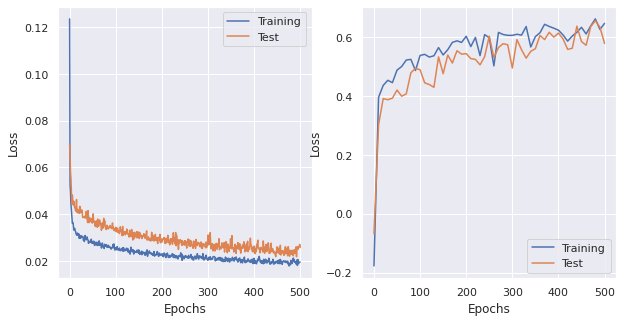

saving  ./plots/LogisticReg_lr0.01_3FFNet_2ReLU_Drop_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim64.png

lr: 0.01, momentum: 0.9, weight_decay: 0.001, dampening: 0, nesterov: False 
FeedforwardNeuralNetModel(
  (fc1): Linear(in_features=47, out_features=128, bias=True)
  (drop): Dropout(p=0.2, inplace=False)
  (relu): ReLU()
  (fc2): Linear(in_features=128, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=1, bias=True)
)
optimizer: SGD (
Parameter Group 0
    dampening: 0
    lr: 0.01
    momentum: 0.9
    nesterov: False
    weight_decay: 0.001
)
n. of epochs: 500
 EPOCH 0. Progress: 0.0%. 
 Training R^2: -0.0329. Test R^2: 0.0028. Loss Train: 0.1232. Loss Val: 0.0635. Time: 7.3332
 EPOCH 10. Progress: 2.0%. 
 Training R^2: 0.4037. Test R^2: 0.3410. Loss Train: 0.0327. Loss Val: 0.0418. Time: 7.6407
 EPOCH 20. Progress: 4.0%. 
 Training R^2: 0.4645. Test R^2: 0.3741. Loss Train: 0.0310. Loss Val: 0.0411. Time: 7.5889
 EPOCH 30. Progress: 6.0%. 
 Tr

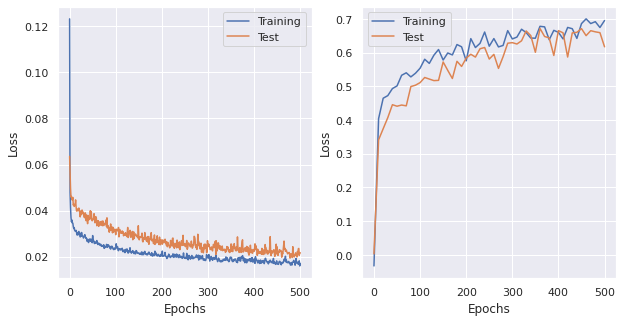

saving  ./plots/LogisticReg_lr0.01_3FFNet_2ReLU_Drop_momentum0.9_wdecay0.001_dampening0_nesterovFalse_HidDim128.png


In [31]:
# Testing a regular FFnet
class FeedforwardNeuralNetModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(FeedforwardNeuralNetModel, self).__init__()
        # Linear function
        self.fc1 = nn.Linear(input_dim, hidden_dim) 
        self.drop = nn.Dropout(0.2)
        # Non-linearity
        self.relu = nn.ReLU()
        # Linear function (readout)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        # Linear function
        out = self.relu(self.fc1(x))
        out = self.drop(out)
        out = self.relu(self.fc2(out))
        out = self.drop(out)
        out = self.fc3(out)
        return out

# Best configuration for longer
lr_range = [0.001,0.01]
hid_dim_range = [64,128]
weight_decay_range = [0.001]
momentum_range = [0.9]
dampening_range = [0]
nesterov_range = [False]
for lr in lr_range:
    for momentum in momentum_range:
        for weight_decay in weight_decay_range:
            for nesterov in nesterov_range:
                for dampening in dampening_range:
                    for hid_dim in hid_dim_range:
                        print('\nlr: {}, momentum: {}, weight_decay: {}, dampening: {}, nesterov: {} '.format(lr, momentum, weight_decay, dampening, nesterov))
                        model = FeedforwardNeuralNetModel(input_dim=47,hidden_dim=hid_dim, output_dim=1).to(device)
                        print(model)
                        SGD = torch.optim.SGD(model.parameters(), lr = lr, momentum=momentum, dampening=dampening, weight_decay=weight_decay, nesterov=nesterov) # This is absurdly high.
                        # initialize the loss function. You don't want to use this one, so change it accordingly
                        loss_fn = nn.MSELoss().to(device)
                        config_str = 'lr' + str(lr) + '_3FFNet_2ReLU_Drop_momentum' + str(momentum) + '_wdecay' + str(weight_decay) + '_dampening' + str(dampening) +'_nesterov' + str(nesterov) + '_HidDim' + str(hid_dim)
                        train(model,loss_fn, SGD, dataloaders['train'], dataloaders['val'], config_str,num_epochs=500, verbose=False)